In [148]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

# Loading data

In [2]:
data=pd.read_csv('Data_Agriculture.csv')
data_expl=pd.read_csv('Data_Explication.csv')

# First look at the data

In [3]:
data.head(10)

,YEAR,COUNTRY,TF8,SYS02,SYS03,SYS04,SE005,SE010,SE011,SE015,...,SE625,SE626,SE630,SE631,SE632,SE640,SE650,SE699,SE700,SE750
0,2004,(BEL) Belgium,(1) Fieldcrops,4040,100 - <200,40.33990,129.1,1.40,3307.91,1.26,...,0.0,866.0,0.0,0.0,0.0,0.0,0.0,456.0,0.0,0.0
1,2004,(BEL) Belgium,(2) Horticulture,4400,200 - <500,40.33990,250.4,3.18,7952.50,1.69,...,0.0,2000.0,0.0,0.0,0.0,0.0,0.0,147.0,0.0,0.0
2,2004,(BEL) Belgium,(4) Other permanent crops,1200,40 - <100,40.33990,277.5,3.56,8740.97,1.39,...,0.0,1042.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,0.0
3,2004,(BEL) Belgium,(5) Milk,6390,200 - <500,40.33990,141.3,1.60,4592.85,1.54,...,0.0,1368.0,0.0,0.0,0.0,0.0,0.0,371.0,0.0,0.0
4,2004,(BEL) Belgium,(6) Other grazing livestock,8320,200 - <500,40.33990,133.7,1.56,4505.13,1.54,...,0.0,1455.0,0.0,0.0,0.0,0.0,0.0,2368.0,0.0,0.0
5,2004,(BEL) Belgium,(7) Granivores,4510,100 - <200,40.33990,317.7,1.54,4124.35,1.50,...,0.0,969.0,0.0,0.0,0.0,0.0,0.0,323.0,0.0,0.0
6,2004,(BEL) Belgium,(8) Mixed,6680,200 - <500,40.33990,194.0,1.83,5035.30,1.68,...,0.0,1483.0,0.0,0.0,0.0,0.0,0.0,1283.0,0.0,0.0
7,2004,(CYP) Cyprus,(1) Fieldcrops,4540,100 - <200,0.58192,30.1,1.65,3809.35,1.07,...,0.0,0.0,878.0,0.0,878.0,0.0,0.0,0.0,0.0,0.0
8,2004,(CYP) Cyprus,(2) Horticulture,890,< 15,0.58192,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2004,(CYP) Cyprus,(3) Wine,730,15 - <40,0.58192,7.9,1.01,2315.36,0.79,...,0.0,0.0,399.0,0.0,399.0,0.0,0.0,0.0,0.0,0.0


In [4]:
data_expl.head()

,code,Explication
0,SE005,Dimension conomique
1,SE010,Total main d'oeuvre
2,SE011,Main d'oeuvre
3,SE015,Main d'oeuvre non-salarie
4,SE016,Main d'oeuvre non-salarie


In [5]:
data_expl=data_expl.set_index('code')

In [6]:
data_expl=data_expl['Explication']

In [7]:
data_expl.head()

code
SE005          Dimension conomique
SE010           Total main d'oeuvre
SE011                 Main d'oeuvre
SE015    Main d'oeuvre non-salarie
SE016    Main d'oeuvre non-salarie
Name: Explication, dtype: object

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2678 entries, 0 to 2677
Columns: 193 entries, YEAR to SE750
dtypes: float64(188), int64(2), object(3)
memory usage: 3.9+ MB


In [9]:
data['YEAR'].unique()

array([2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016])

In [10]:
data['COUNTRY'].unique()

array(['(BEL) Belgium', '(CYP) Cyprus', '(CZE) Czech Republic',
       '(DAN) Denmark', '(DEU) Germany', '(ELL) Greece', '(ESP) Spain',
       '(EST) Estonia', '(FRA) France', '(HUN) Hungary', '(IRE) Ireland',
       '(ITA) Italy', '(LTU) Lithuania', '(LUX) Luxembourg',
       '(LVA) Latvia', '(MLT) Malta', '(NED) Netherlands',
       '(OST) Austria', '(POL) Poland', '(POR) Portugal', '(SUO) Finland',
       '(SVE) Sweden', '(SVK) Slovakia', '(SVN) Slovenia',
       '(UKI) United Kingdom', '(BGR) Bulgaria', '(ROU) Romania',
       '(HRV) Croatia', nan], dtype=object)

In [11]:
data['TF8'].unique()

array(['(1) Fieldcrops', '(2) Horticulture', '(4) Other permanent crops',
       '(5) Milk', '(6) Other grazing livestock', '(7) Granivores',
       '(8) Mixed', '(3) Wine'], dtype=object)

## Duplicated data

In [12]:
data.duplicated().sum()

0

## Missing data

In [13]:
data.isnull().sum()[:30]

YEAR         0
COUNTRY    104
TF8          0
SYS02        0
SYS03        0
SYS04        0
SE005      242
SE010      242
SE011      242
SE015      242
SE016      242
SE020      242
SE021      242
SE025      242
SE030      242
SE035      242
SE041      242
SE042      242
SE046      242
SE050      242
SE054      242
SE055      242
SE060      242
SE065      242
SE071      242
SE072      242
SE073      242
SE074      242
SE075      242
SE080      242
dtype: int64

In [14]:
data[data['SE631'].isnull()]

,YEAR,COUNTRY,TF8,SYS02,SYS03,SYS04,SE005,SE010,SE011,SE015,...,SE625,SE626,SE630,SE631,SE632,SE640,SE650,SE699,SE700,SE750
8,2004,(CYP) Cyprus,(2) Horticulture,890,< 15,0.58192,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,2004,(CYP) Cyprus,(5) Milk,180,< 15,0.58192,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,2004,(CYP) Cyprus,(8) Mixed,290,< 15,0.58192,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,2004,(CZE) Czech Republic,(4) Other permanent crops,240,< 15,31.90567,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
44,2004,(ELL) Greece,(7) Granivores,940,< 15,0.34075,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
56,2004,(EST) Estonia,(4) Other permanent crops,20,< 15,15.64660,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91,2004,(LTU) Lithuania,(4) Other permanent crops,1580,< 15,3.45286,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93,2004,(LTU) Lithuania,(6) Other grazing livestock,920,< 15,3.45286,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
94,2004,(LTU) Lithuania,(7) Granivores,290,< 15,3.45286,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96,2004,(LUX) Luxembourg,(1) Fieldcrops,30,< 15,40.33990,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Missing values

In [15]:
data.isnull().sum().sum()

58247

### Number of rows with missing values

In [16]:
sum(data.isnull().sum(axis=1)>0)
#sum(data.apply(lambda x:sum(x.isnull()), axis=1)>0)

2672

### Number of columns with missing values

In [17]:
sum(data.isnull().sum(axis=0)>0)

188

#### Rows with at least 100 missing values 

In [18]:
max(data.isnull().sum(axis=1))

187

In [19]:
sum(data.isnull().sum(axis=1)==187)

242

In [20]:
sum(data.isnull().sum(axis=1)>=100)

242

#### We will drop rows with 187 missing values

In [21]:
new_data=data.dropna(axis=0, how='any', thresh=data.shape[1]-186)

In [22]:
new_data.shape

(2436, 193)

#### We will drop rows with nan values in column 'COUNTRY'

In [23]:
new_data.dropna(subset=['COUNTRY'], axis=0, inplace=True)

In [24]:
new_data.shape

(2332, 193)

# General information (income, financial situation...)

#### We'll make a dataframe with general information. The colulns are:

In [25]:
general_columns=['SYS02', 'SYS03', 'SE005', 'SE010', 'SE011', 'SE025', 'SE080', 'SE131', 'SE132', 'SE270', 'SE405', 'SE600', 'SE476', 'SE501', 'SE506', 'SE510', 'SE516', 'SE521', 'SE530', 'SE532', 'SE410', 'SE415', 'SE420']

In [26]:
data_expl[general_columns]

code
SYS02                       Exploitations reprsentes
SYS03                 Exploitations dans l'chantillon
SE005                             Dimension conomique
SE010                              Total main d'oeuvre
SE011                                    Main d'oeuvre
SE025               Total Superficie Agricole Utilise
SE080                                    Total cheptel
SE131                               Total produit brut
SE132                       Total output / Total input
SE270                                Total des charges
SE405    Solde subventions & taxes sur investissements
SE600         Solde subventions d'exploitation & taxes
SE476                                      Inventories
SE501                                    Fonds propres
SE506                      Variation des fonds propres
SE510                     Capital d'exploitation moyen
SE516                            Investissements bruts
SE521                             Investissements nets
SE530

In [27]:
general_data=new_data[['YEAR', 'COUNTRY', 'TF8']+general_columns]

In [28]:
general_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2332 entries, 0 to 2573
Data columns (total 26 columns):
YEAR       2332 non-null int64
COUNTRY    2332 non-null object
TF8        2332 non-null object
SYS02      2332 non-null int64
SYS03      2332 non-null object
SE005      2332 non-null float64
SE010      2332 non-null float64
SE011      2332 non-null float64
SE025      2332 non-null float64
SE080      2332 non-null float64
SE131      2332 non-null float64
SE132      2332 non-null float64
SE270      2332 non-null float64
SE405      2332 non-null float64
SE600      2332 non-null float64
SE476      2332 non-null float64
SE501      2332 non-null float64
SE506      2332 non-null float64
SE510      2332 non-null float64
SE516      2332 non-null float64
SE521      2332 non-null float64
SE530      2332 non-null float64
SE532      2332 non-null float64
SE410      2332 non-null float64
SE415      2332 non-null float64
SE420      2332 non-null float64
dtypes: float64(21), int64(2), object(3)
m

In [29]:
general_data.head()

,YEAR,COUNTRY,TF8,SYS02,SYS03,SE005,SE010,SE011,SE025,SE080,...,SE501,SE506,SE510,SE516,SE521,SE530,SE532,SE410,SE415,SE420
0,2004,(BEL) Belgium,(1) Fieldcrops,4040,100 - <200,129.1,1.40,3307.91,59.18,14.14,...,267526.0,13160.0,156434.0,17904.0,4630.0,27206.0,0.074601,76689.0,63414.0,41200.0
1,2004,(BEL) Belgium,(2) Horticulture,4400,200 - <500,250.4,3.18,7952.50,5.90,0.65,...,196666.0,3568.0,275183.0,30918.0,2175.0,30572.0,0.089329,111066.0,82323.0,37811.0
2,2004,(BEL) Belgium,(4) Other permanent crops,1200,40 - <100,277.5,3.56,8740.97,17.15,0.36,...,347279.0,-3714.0,335326.0,35814.0,3712.0,47416.0,0.102773,132703.0,100602.0,44828.0
3,2004,(BEL) Belgium,(5) Milk,6390,200 - <500,141.3,1.60,4592.85,42.06,80.83,...,286382.0,7038.0,207739.0,19579.0,1553.0,35097.0,0.090405,75412.0,57387.0,41497.0
4,2004,(BEL) Belgium,(6) Other grazing livestock,8320,200 - <500,133.7,1.56,4505.13,55.61,112.32,...,322065.0,9190.0,282324.0,18594.0,4719.0,36655.0,0.086916,72854.0,58979.0,43850.0


In [30]:
general_data.describe()

,YEAR,SYS02,SE005,SE010,SE011,SE025,SE080,SE131,SE132,SE270,...,SE501,SE506,SE510,SE516,SE521,SE530,SE532,SE410,SE415,SE420
count,2332.000000,2332.000000,2332.000000,2332.000000,2332.000000,2332.000000,2332.000000,2.332000e+03,2332.000000,2.332000e+03,...,2.332000e+03,2.332000e+03,2.332000e+03,2.332000e+03,2.332000e+03,2.332000e+03,2332.000000,2332.000000,2332.000000,2332.000000
mean,2010.210120,26219.245283,149.455489,2.808015,5798.076209,62.215493,75.585527,1.628620e+05,1.117716,1.613027e+05,...,4.254542e+05,1.349482e+04,3.245019e+05,2.549191e+04,5.196673e+03,2.411372e+04,0.068557,74574.494425,54279.258148,24245.664237
std,3.709244,57173.047022,203.771605,3.806643,7278.644106,122.558240,146.923087,2.144580e+05,0.274121,2.288609e+05,...,4.473526e+05,8.951325e+04,3.814511e+05,4.076000e+04,3.161410e+04,4.223683e+04,0.083051,83792.062829,63923.647802,30843.669789
min,2004.000000,70.000000,4.900000,0.530000,944.070000,0.890000,0.000000,5.690000e+03,0.418174,4.217000e+03,...,1.541100e+04,-1.858129e+06,1.215800e+04,-3.173690e+05,-3.628040e+05,-1.033044e+06,-0.809981,-17044.000000,-28100.000000,-357296.000000
25%,2007.000000,1917.500000,25.500000,1.460000,3042.627500,10.512500,0.550000,2.989425e+04,0.940712,2.596725e+04,...,1.176662e+05,-1.429500e+03,8.525450e+04,3.796750e+03,-1.808000e+03,7.682250e+03,0.028079,19816.500000,14355.000000,8898.250000
50%,2010.000000,7340.000000,67.850000,1.790000,3833.765000,27.695000,14.635000,8.135100e+04,1.077532,8.053150e+04,...,2.655570e+05,4.602500e+03,2.213835e+05,1.395600e+04,9.420000e+02,1.782700e+04,0.059717,45956.500000,33174.000000,18435.000000
75%,2013.000000,23275.000000,186.500000,2.510000,5433.830000,67.795000,93.652500,2.087840e+05,1.268576,2.038058e+05,...,5.593102e+05,1.714650e+04,4.101665e+05,3.460200e+04,8.045250e+03,3.462925e+04,0.096268,101601.250000,70902.000000,35608.750000
max,2016.000000,603830.000000,1570.100000,49.880000,95876.340000,1221.810000,1128.980000,1.567411e+06,3.034025,1.735207e+06,...,3.532444e+06,1.052258e+06,3.612391e+06,1.085024e+06,1.021587e+06,5.217370e+05,2.032704,806939.000000,641794.000000,249474.000000


In [32]:
general_cluster=(general_data.drop('YEAR', axis=1).groupby(['COUNTRY', 'TF8']).mean()).groupby(level=[0]).sum()
general_cluster.head()

,SYS02,SE005,SE010,SE011,SE025,SE080,SE131,SE132,SE270,SE405,...,SE501,SE506,SE510,SE516,SE521,SE530,SE532,SE410,SE415,SE420
COUNTRY,,,,,,,,,,,,,,,,,,,,,
(BEL) Belgium,31467.692308,1941.992308,18.135385,42262.265385,278.242308,815.606154,1.836594e+06,8.355382,1.548478e+06,-435.923077,...,3.172725e+06,184676.076923,2.714423e+06,316084.538462,85700.000000,313441.615385,0.538387,9.009243e+05,6.705404e+05,414179.615385
(BGR) Bulgaria,121086.000000,286.190000,24.188000,44890.241000,204.628000,158.031000,3.568710e+05,8.475225,3.514193e+05,3901.800000,...,7.203714e+05,2857.200000,7.269694e+05,74967.900000,27488.500000,17848.200000,0.461037,1.809578e+05,1.334783e+05,55763.700000
(CYP) Cyprus,11612.307692,678.036480,13.704668,29771.930676,54.651760,556.874744,5.487240e+05,7.391379,5.331784e+05,2573.933566,...,1.557772e+06,-67879.250000,1.196544e+06,7593.329837,-44746.933566,87703.715618,0.309794,1.603422e+05,1.080027e+05,44139.534965
(CZE) Czech Republic,16227.115385,2204.803846,52.370449,107730.634423,1115.198974,1313.877628,2.502881e+06,7.609915,2.704271e+06,31506.871795,...,4.214009e+06,123174.429487,5.160452e+06,281692.993590,43320.833333,428993.250000,0.869800,9.732736e+05,7.349013e+05,239119.826923
(DAN) Denmark,29436.923077,2820.100000,17.790000,32874.491538,556.802308,1126.848462,3.173940e+06,6.595717,3.281279e+06,4589.538462,...,6.118377e+06,178261.538462,6.773346e+06,477925.230769,176052.538462,279954.846154,0.153630,1.309097e+06,1.007224e+06,87112.076923


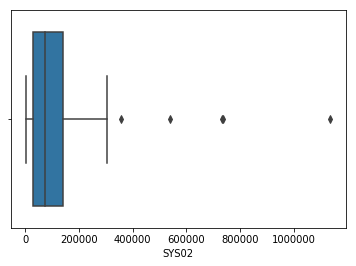

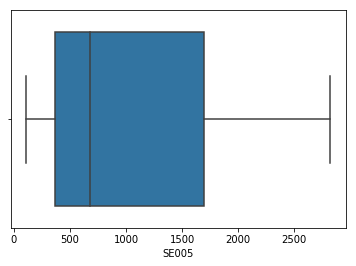

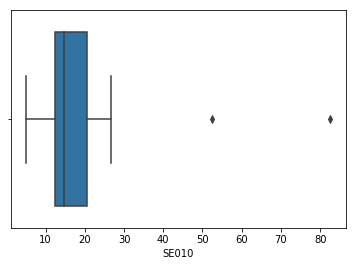

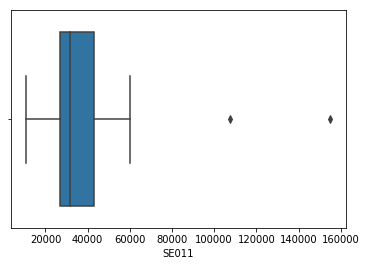

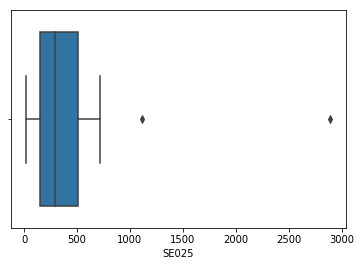

...

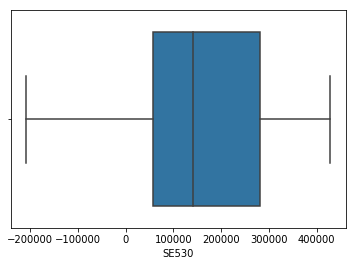

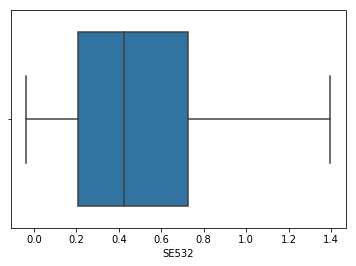

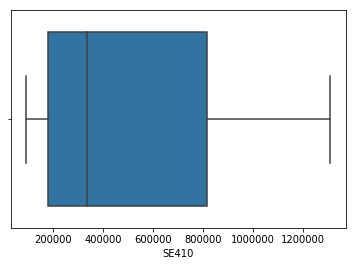

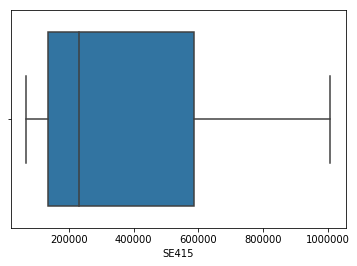

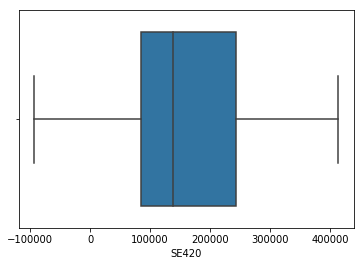

In [33]:
for feat in general_cluster.columns:
    plt.figure()
    sns.boxplot(general_cluster[feat])

In [34]:
'''
for feat in general_cluster.columns:
    q1=general_cluster.describe().loc['25%',feat]
    q3=general_data.cluster().loc['75%',feat]
    IQR=q3-q1
    general_cluster[feat]=general_cluster[feat].apply(lambda x: q1-1.5*IQR if x<q1-1.5*IQR else x)
    general_cluster[feat]=general_cluster[feat].apply(lambda x: q3+1.5*IQR if x>q3+1.5*IQR else x)
'''

"\nfor feat in general_cluster.columns:\n    q1=general_cluster.describe().loc['25%',feat]\n    q3=general_data.cluster().loc['75%',feat]\n    IQR=q3-q1\n    general_cluster[feat]=general_cluster[feat].apply(lambda x: q1-1.5*IQR if x<q1-1.5*IQR else x)\n    general_cluster[feat]=general_cluster[feat].apply(lambda x: q3+1.5*IQR if x>q3+1.5*IQR else x)\n"

Text(0.5,1,'Total labour unit per country')

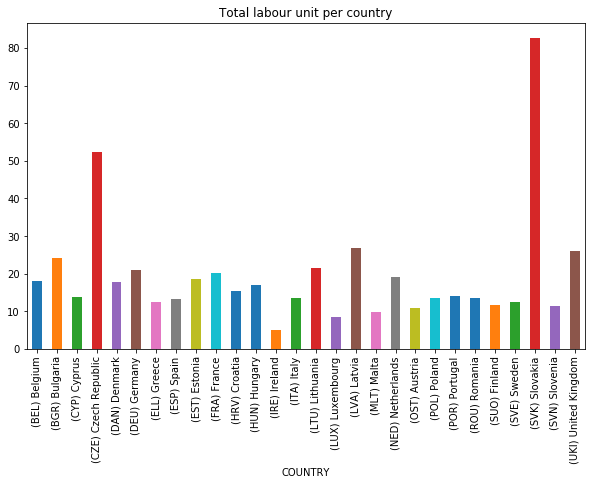

In [35]:
plt.figure(figsize=(10,6))
general_cluster['SE010'].plot.bar()
plt.title("Total labour unit per country")

Text(0.5,1,'Total labour input(in hours) per country')

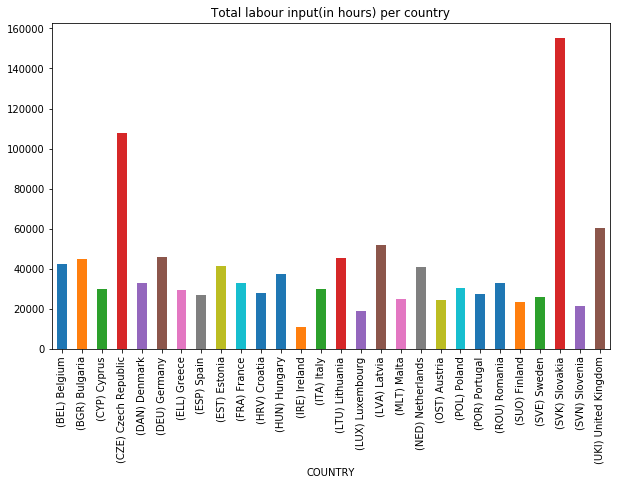

In [36]:
plt.figure(figsize=(10,6))
general_cluster['SE011'].plot.bar()
plt.title("Total labour input(in hours) per country")

Text(0.5,1,'Total utilised agriculture area per country')

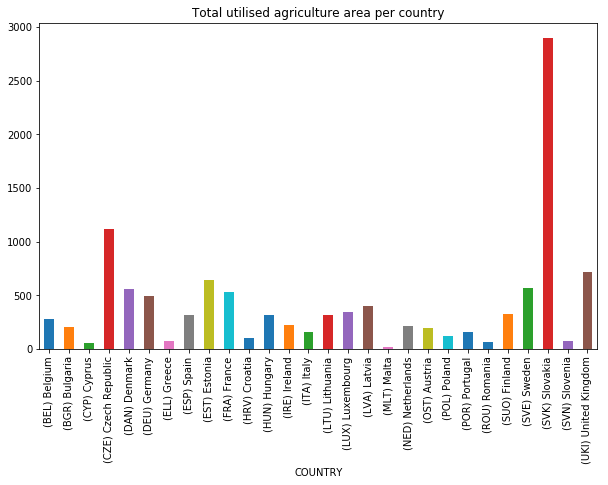

In [37]:
plt.figure(figsize=(10,6))
general_cluster['SE025'].plot.bar()
plt.title("Total utilised agriculture area per country")

Text(0.5,1,'Total livestock units per country')

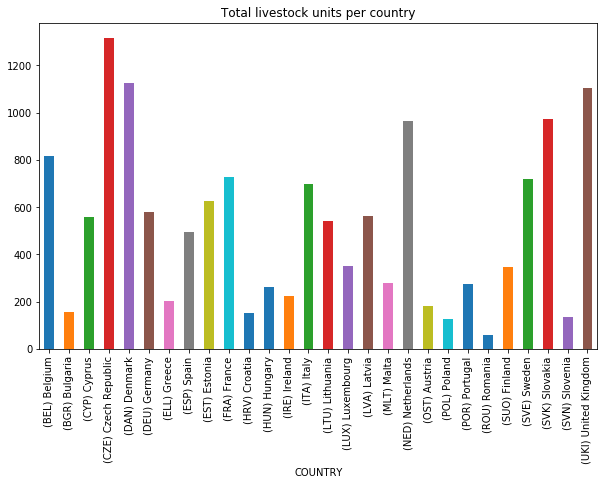

In [38]:
plt.figure(figsize=(10,6))
general_cluster['SE080'].plot.bar()
plt.title("Total livestock units per country")

Text(0.5,1,'Output per country')

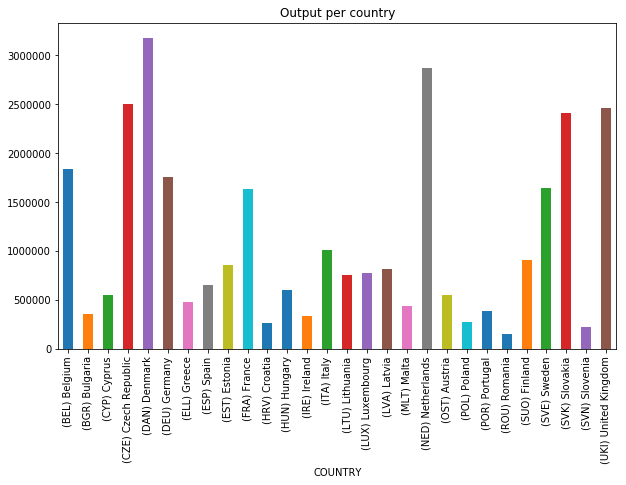

In [39]:
plt.figure(figsize=(10,6))
general_cluster['SE131'].plot.bar()
plt.title("Output per country")

Text(0.5,1,'Input per country')

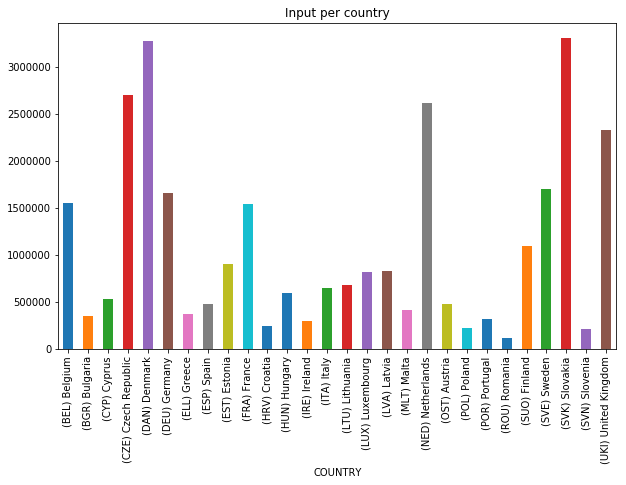

In [40]:
plt.figure(figsize=(10,6))
general_cluster['SE270'].plot.bar()
plt.title("Input per country")

Text(0.5,1,'Output/Input per country')

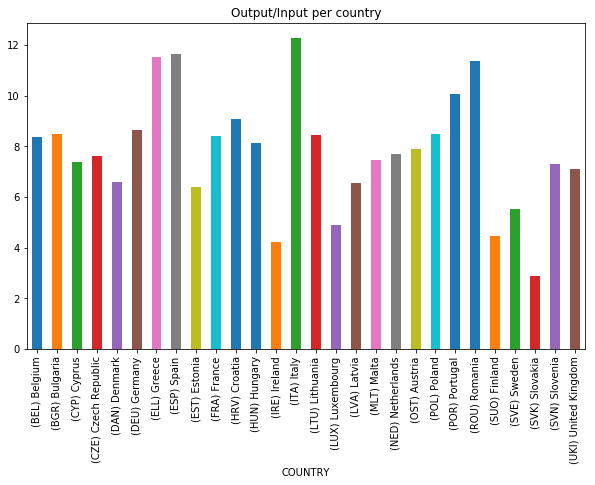

In [41]:
plt.figure(figsize=(10,6))
general_cluster['SE132'].plot.bar()
plt.title("Output/Input per country")

Text(0.5,1,'Economic size per country')

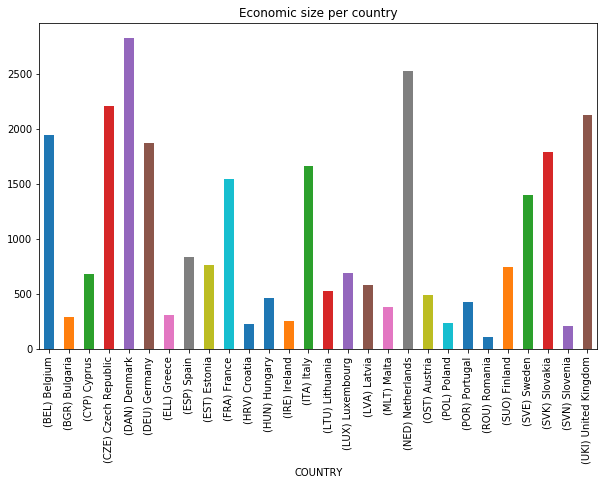

In [42]:
plt.figure(figsize=(10,6))
general_cluster['SE005'].plot.bar()
plt.title("Economic size per country")

Text(0.5,1,'Gross farm income per country')

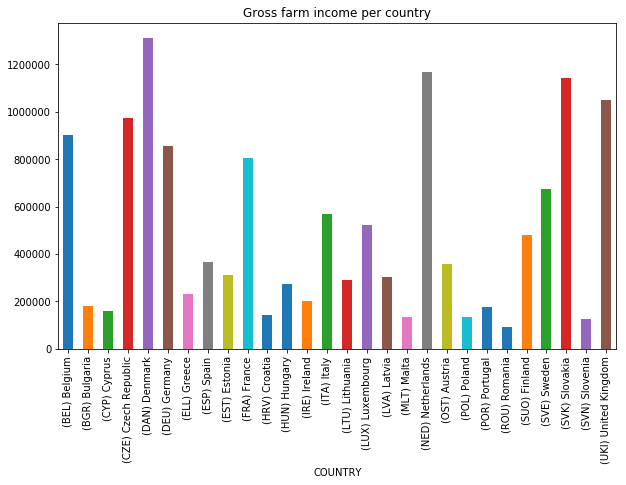

In [43]:
plt.figure(figsize=(10,6))
general_cluster['SE410'].plot.bar()
plt.title("Gross farm income per country")

Text(0.5,1,'Farm net value added per country')

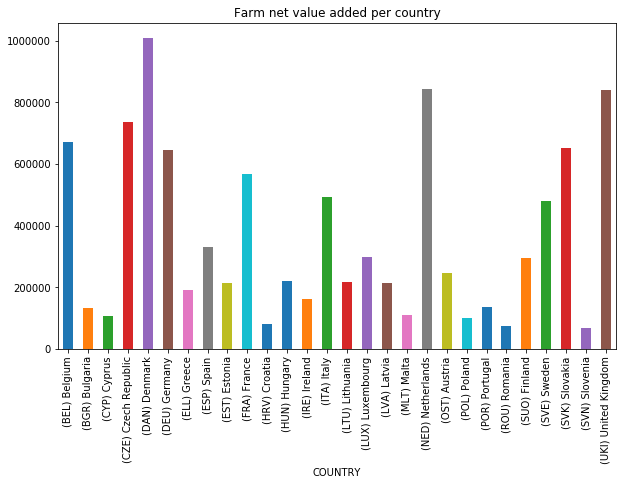

In [44]:
plt.figure(figsize=(10,6))
general_cluster['SE415'].plot.bar()
plt.title("Farm net value added per country")

Text(0.5,1,'Farm net income per country')

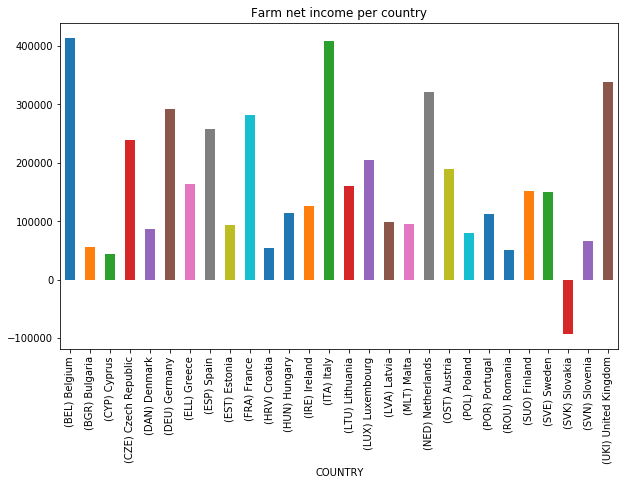

In [45]:
plt.figure(figsize=(10,6))
general_cluster['SE420'].plot.bar()
plt.title("Farm net income per country")

Text(0.5,1,'Average farm capital per country')

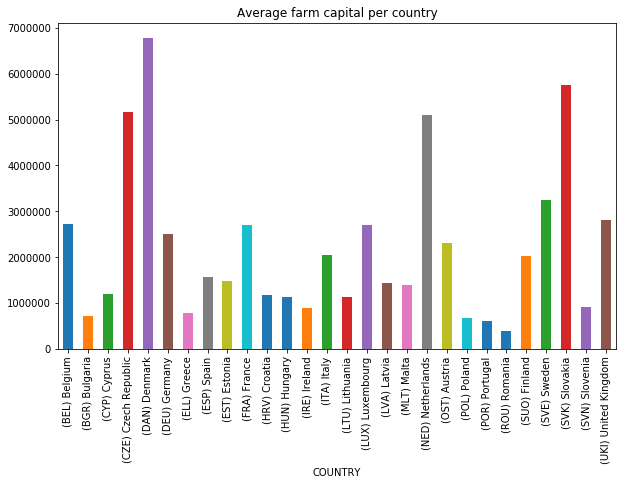

In [46]:
plt.figure(figsize=(10,6))
general_cluster['SE510'].plot.bar()
plt.title("Average farm capital per country")

Text(0.5,1,'Cash flow capital per country')

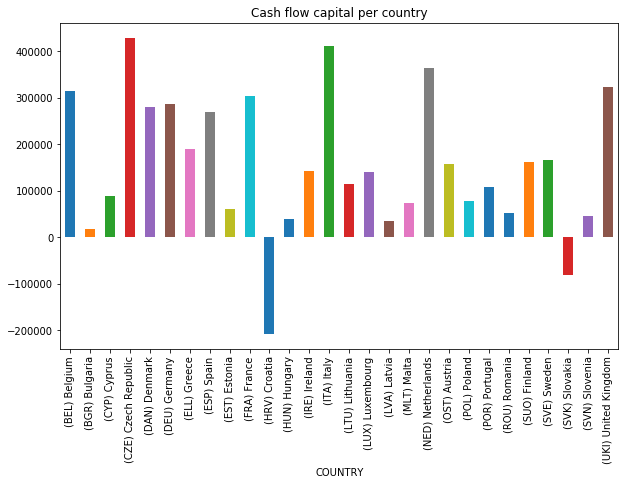

In [47]:
plt.figure(figsize=(10,6))
general_cluster['SE530'].plot.bar()
plt.title("Cash flow capital per country")

Text(0.5,1,'Cash flow/farm total capital per country')

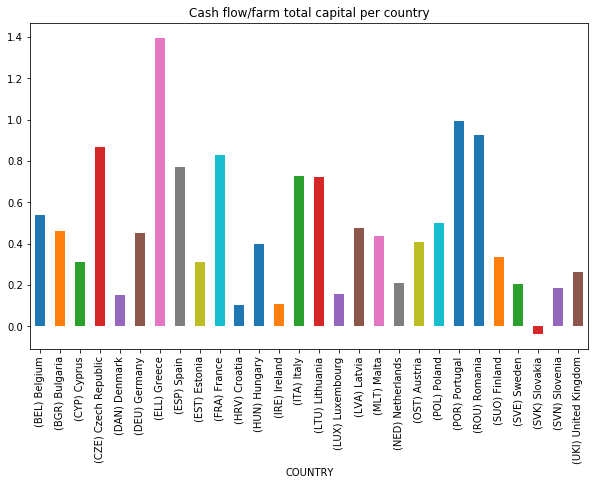

In [48]:
plt.figure(figsize=(10,6))
general_cluster['SE532'].plot.bar()
plt.title("Cash flow/farm total capital per country")

Text(0.5,1,'Net worth per country')

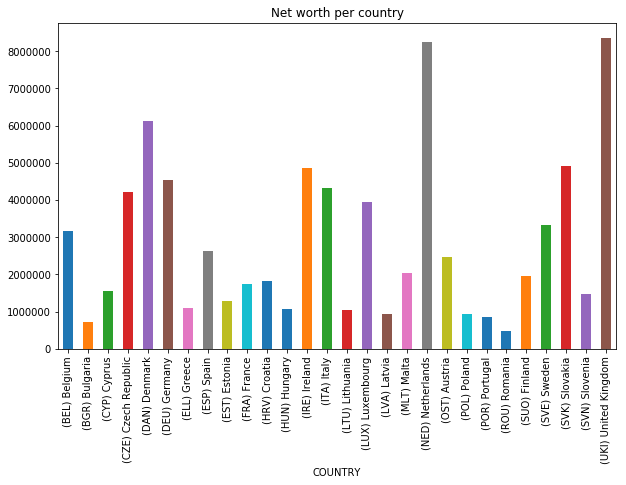

In [49]:
plt.figure(figsize=(10,6))
general_cluster['SE501'].plot.bar()
plt.title("Net worth per country")

Text(0.5,1,'Change in net worth per country')

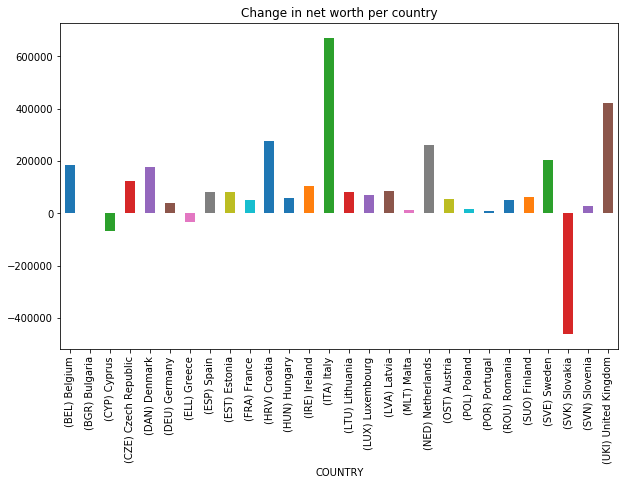

In [50]:
plt.figure(figsize=(10,6))
general_cluster['SE506'].plot.bar()
plt.title("Change in net worth per country")

In [51]:
general_data.groupby(['COUNTRY','TF8']).mean().groupby(level=[1]).mean()

,YEAR,SYS02,SE005,SE010,SE011,SE025,SE080,SE131,SE132,SE270,...,SE501,SE506,SE510,SE516,SE521,SE530,SE532,SE410,SE415,SE420
TF8,,,,,,,,,,,,,,,,,,,,,
(1) Fieldcrops,2010.401786,43660.630495,79.218599,1.848996,3780.977025,81.952842,5.249141,100957.290797,1.069406,101198.655357,...,456634.887637,17964.334066,220774.407555,21639.090247,5226.665797,21467.641346,0.062620,59462.019231,43049.574588,22860.159478
(2) Horticulture,2010.404589,7937.912114,189.131631,3.825743,7836.193704,9.400001,0.595734,219334.039353,1.246720,194487.872854,...,235274.285953,10045.390041,249245.590970,19963.284894,1532.445578,31125.647677,0.105458,103736.962635,85306.099294,29632.217466
(3) Wine,2010.533333,16521.421368,52.855509,2.165389,4413.390947,12.041595,0.368659,64294.700925,1.356088,49751.471189,...,258047.309821,6459.571026,202682.744483,11339.854211,564.731352,20069.792238,0.066146,43418.345431,32643.251158,20527.990878
(4) Other permanent crops,2010.734848,30221.731935,79.493159,2.299199,4741.720527,17.158898,0.932821,85047.626282,1.211861,74485.171620,...,286429.910723,9639.872552,186366.866259,15222.292075,2085.517366,17935.595862,0.072072,52597.637121,39460.895221,17456.105536
(5) Milk,2010.231481,23788.041311,159.201368,3.440551,7185.600027,95.605846,88.582375,183993.136325,1.097769,194205.467949,...,556251.976068,7773.874359,434159.522792,34384.241026,8023.598006,27348.577493,0.065992,86880.806125,60520.165670,28122.489601
(6) Other grazing livestock,2010.321429,28563.201673,55.928730,1.896782,3946.270729,69.161508,50.638469,60371.760261,0.960609,72199.088894,...,322353.076003,8660.796279,210809.395475,14131.228438,1542.468640,14326.412904,0.063798,38347.090201,25758.371653,15292.061447
(7) Granivores,2010.128000,7002.643590,378.335549,3.489848,7299.495819,39.047621,339.213842,361082.363897,1.106627,342478.881949,...,534692.137333,36700.349846,587392.852923,51810.569077,21236.823897,27786.074923,0.056886,107556.128308,76982.396615,36843.036769
(8) Mixed,2010.422619,39988.431818,130.219128,3.156477,6392.591060,103.921459,73.927344,152861.543644,1.036341,171129.870221,...,512255.419018,8030.068744,359885.584245,26832.103226,3471.207255,18177.160860,0.052543,70354.650999,46993.761892,15380.300487


Text(0.5,1,'Output per Farm type')

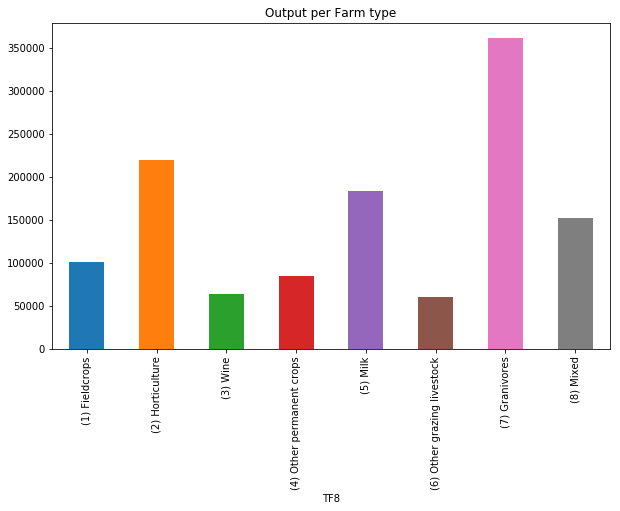

In [52]:
plt.figure(figsize=(10,6))
general_data.groupby(['COUNTRY','TF8']).mean().groupby(level=[1]).mean()['SE131'].plot.bar()
plt.title("Output per Farm type")

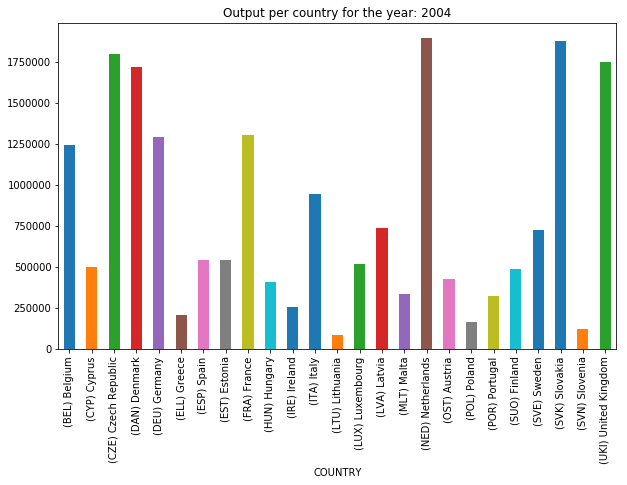

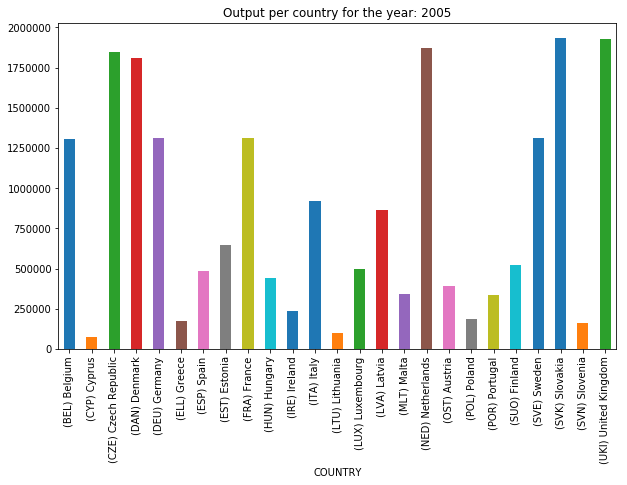

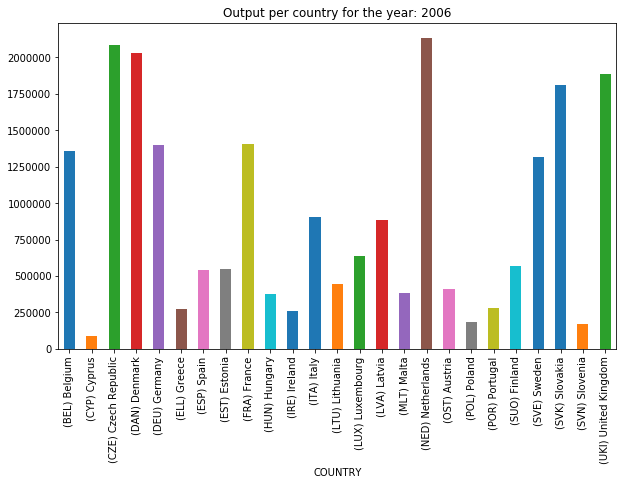

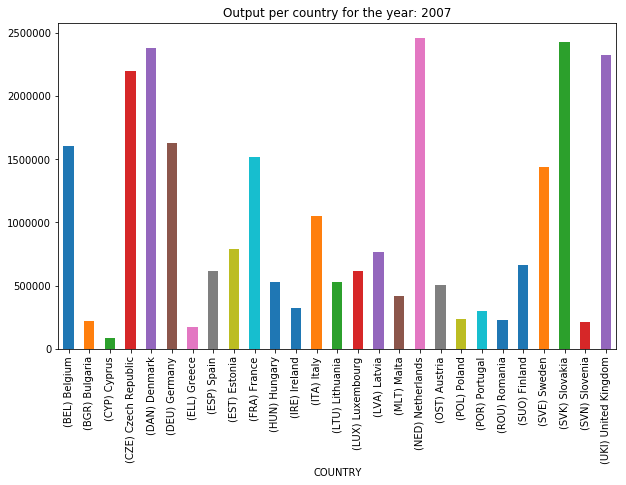

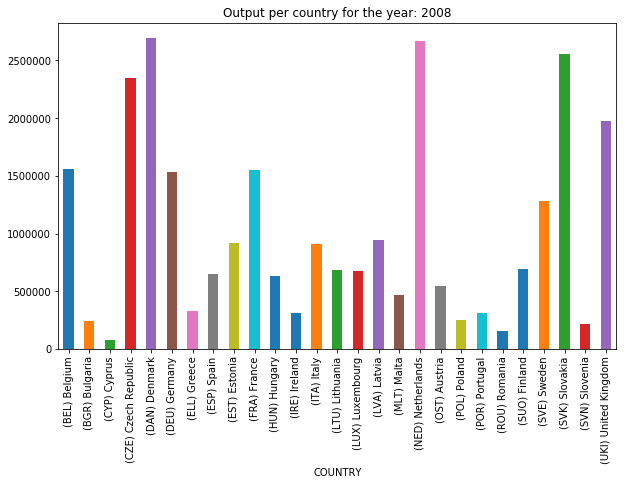

...

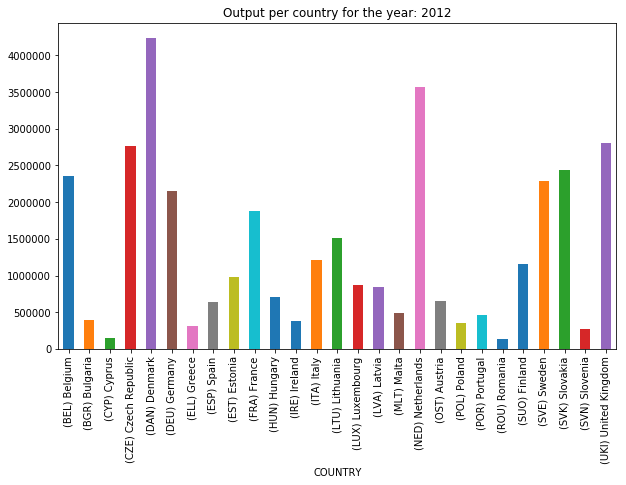

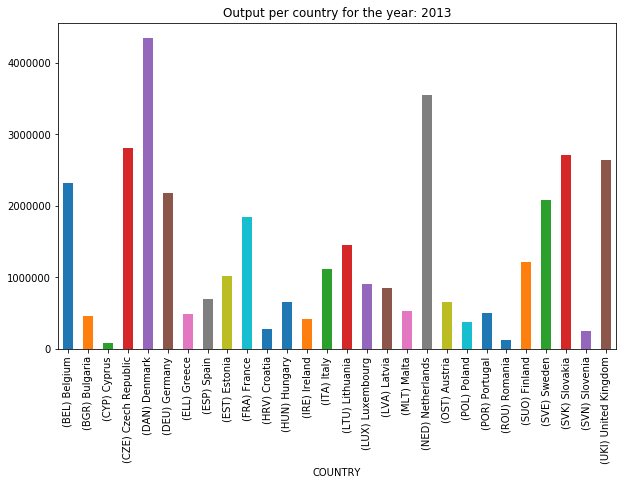

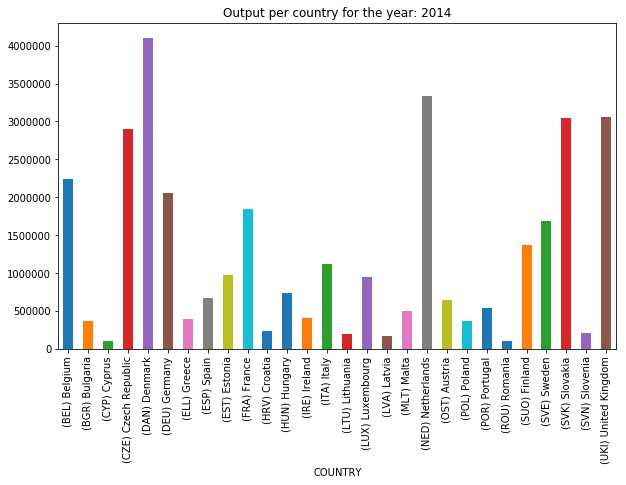

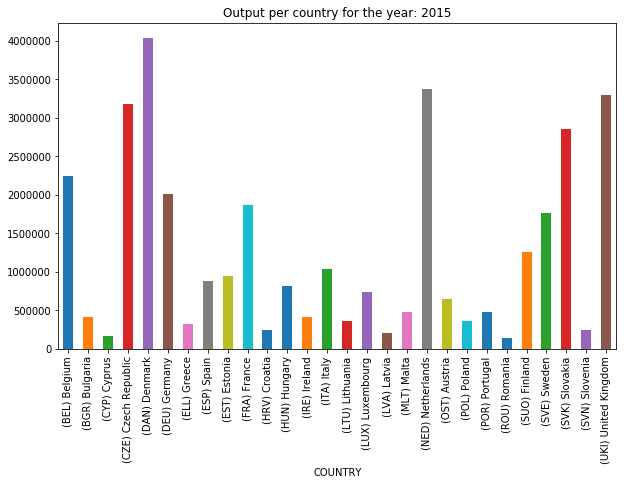

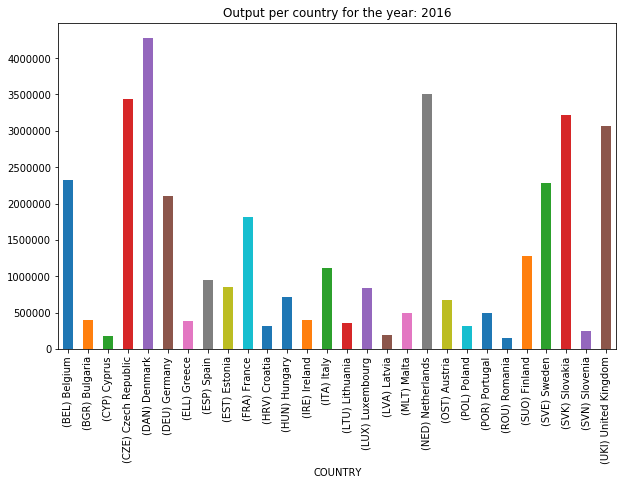

In [54]:
for year in general_data['YEAR'].unique():
    plt.figure(figsize=(10,6))
    general_data[general_data['YEAR']==year].groupby(['COUNTRY']).sum()['SE131'].plot.bar()
    plt.title("Output per country for the year: "+str(year))

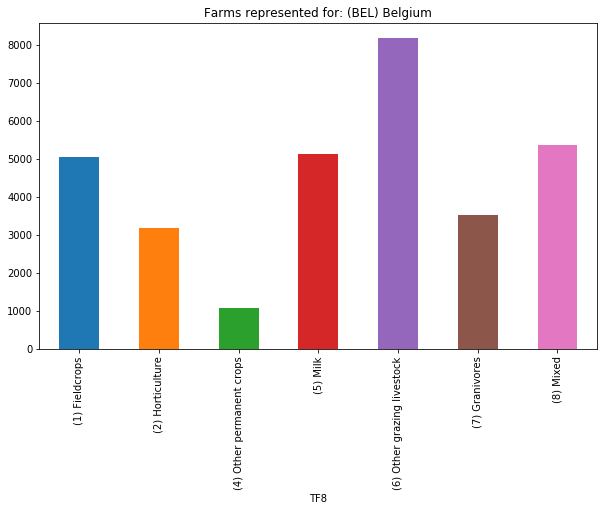

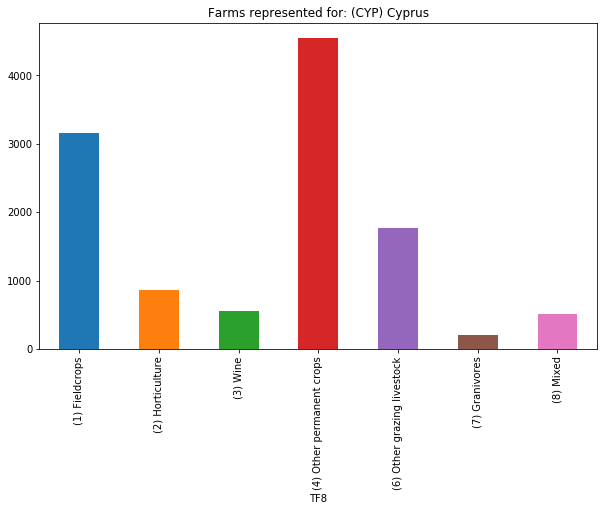

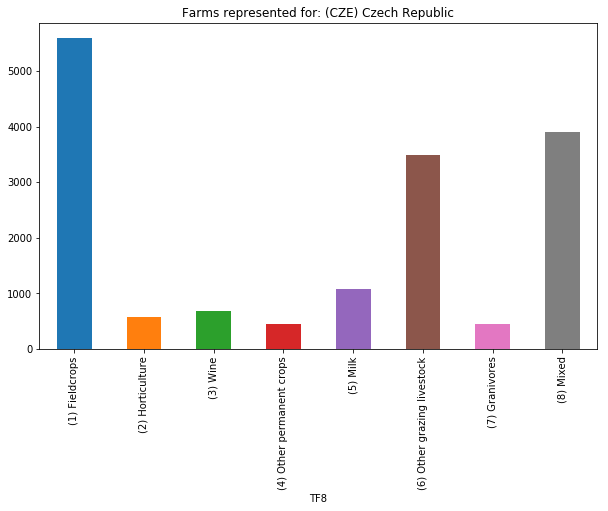

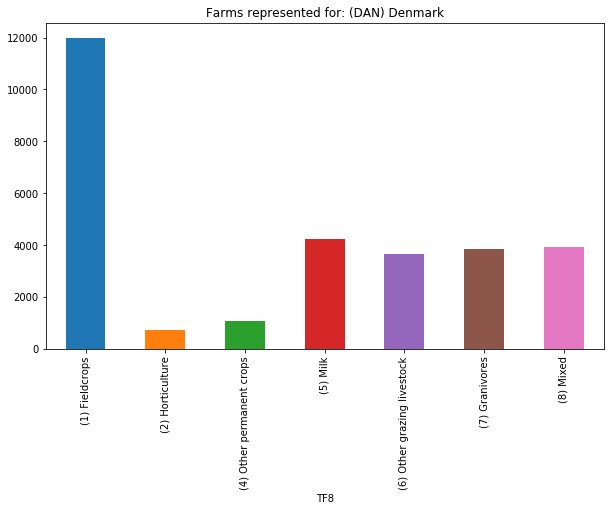

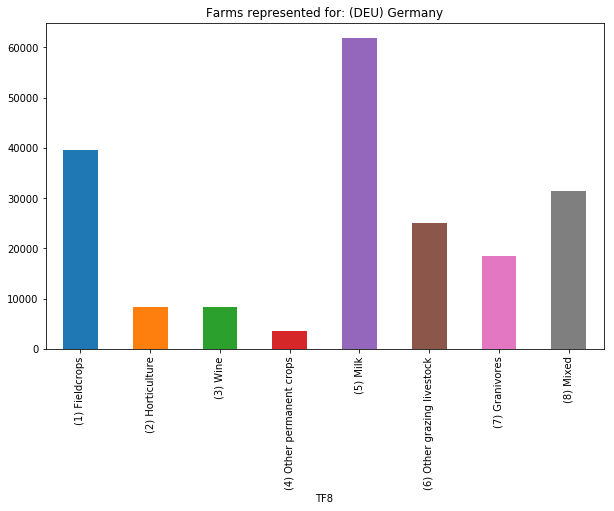

...

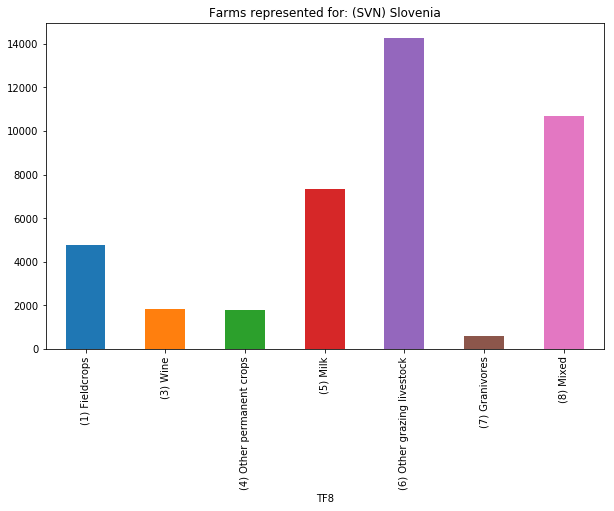

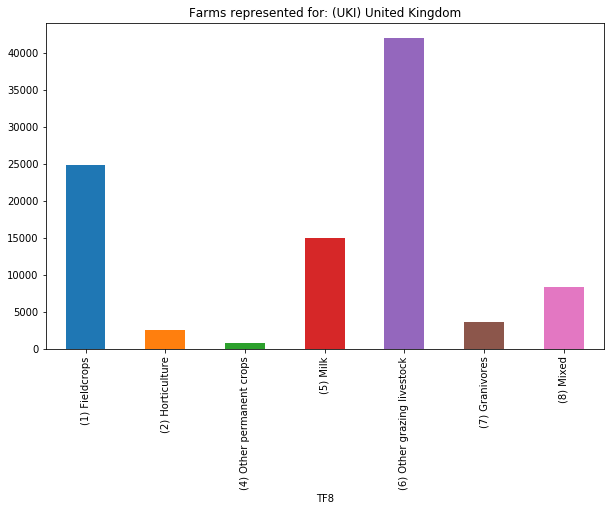

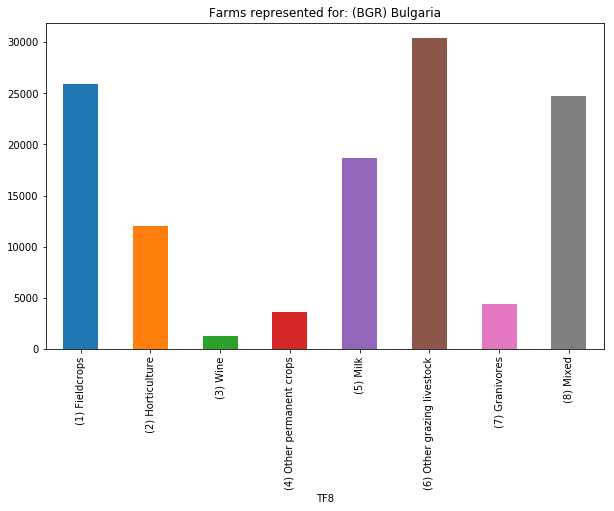

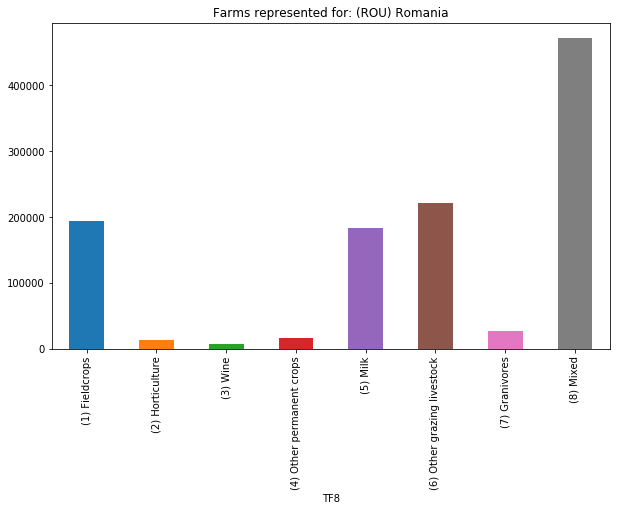

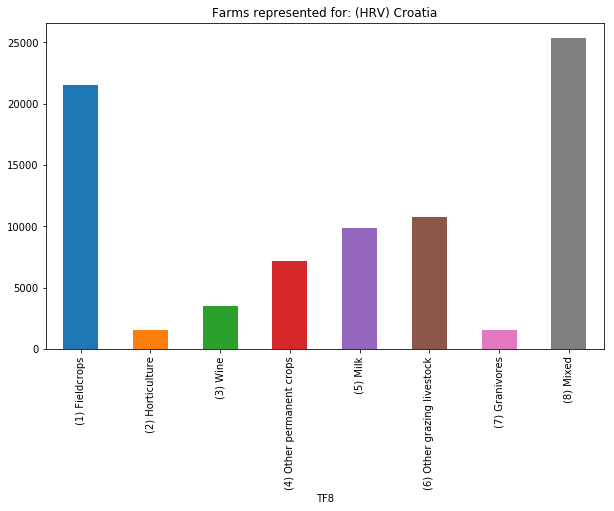

In [55]:
for country in general_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    general_data[general_data['COUNTRY']==country].groupby(['TF8']).mean()['SYS02'].plot.bar()
    plt.title("Farms represented for: "+country)

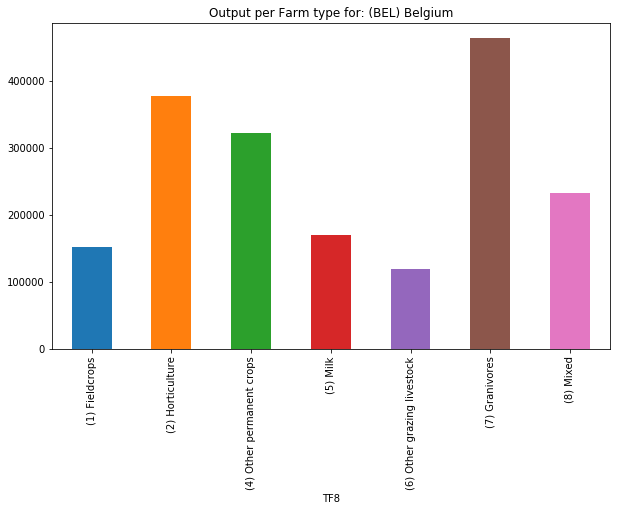

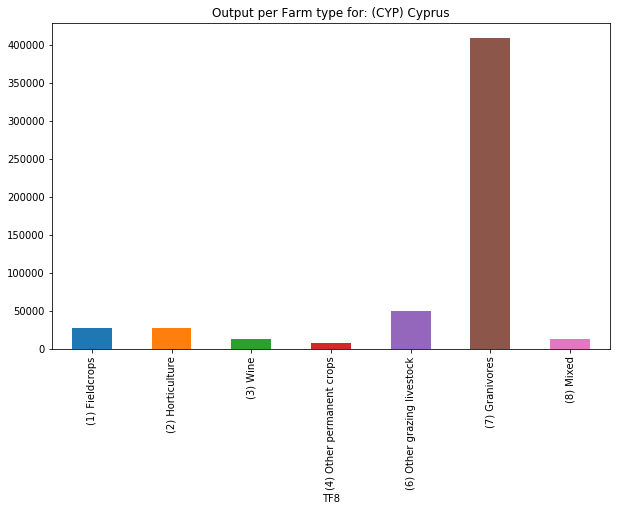

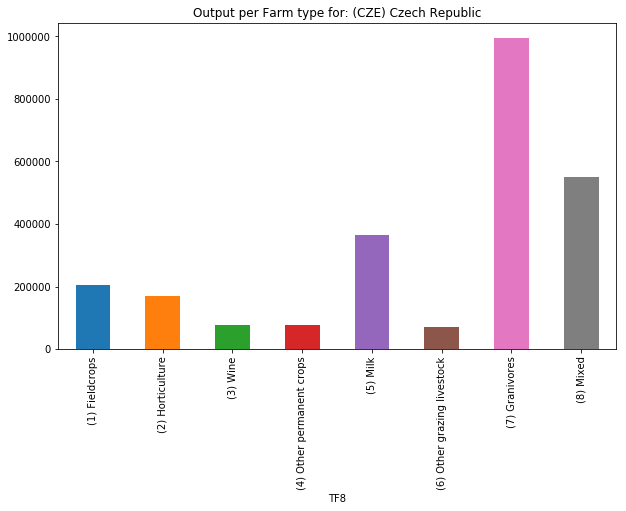

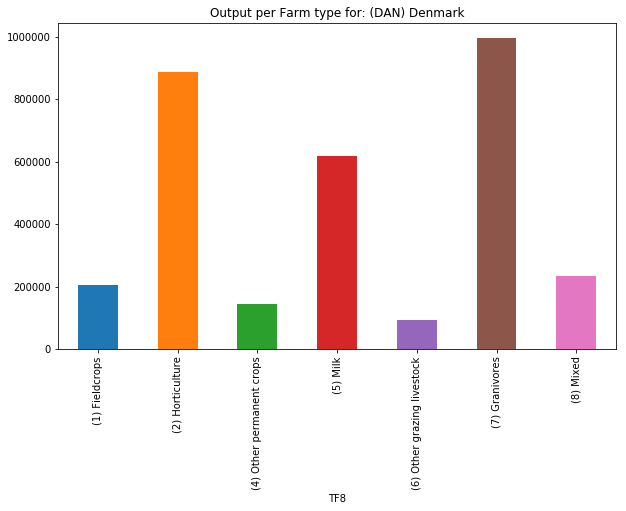

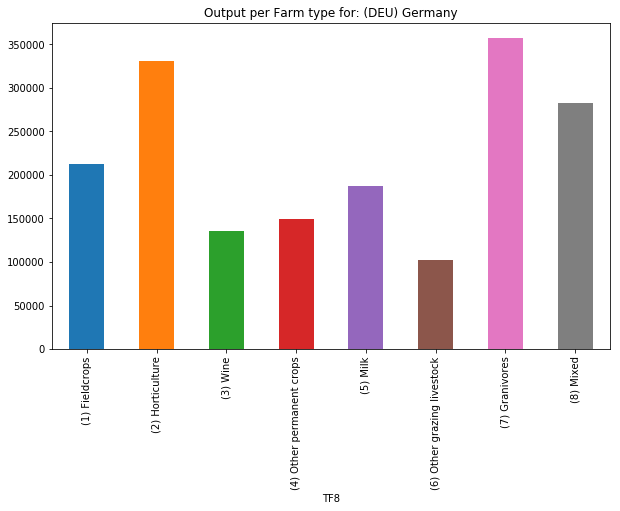

...

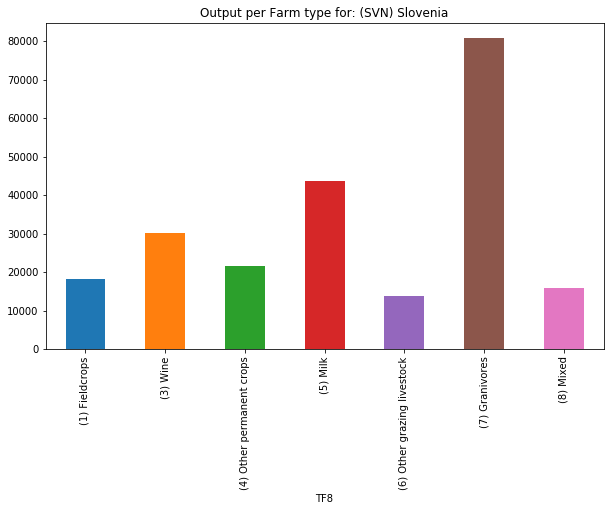

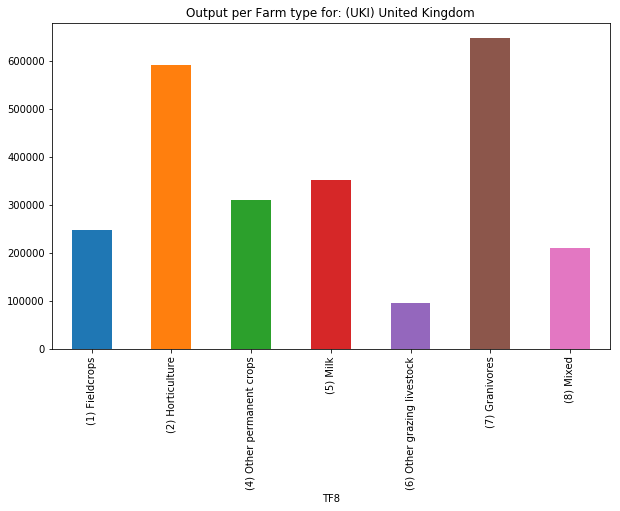

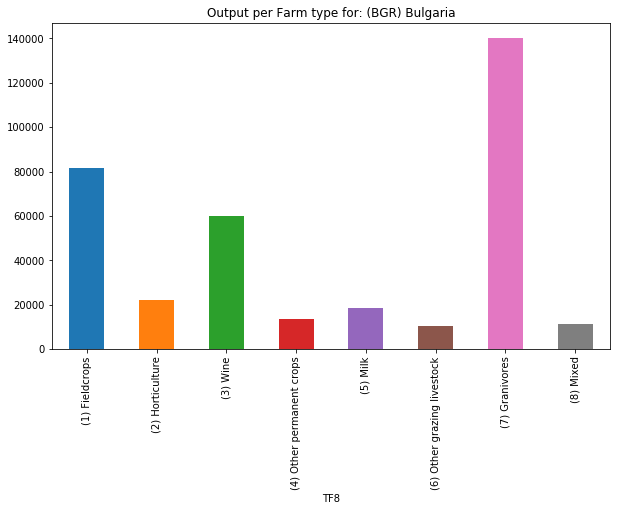

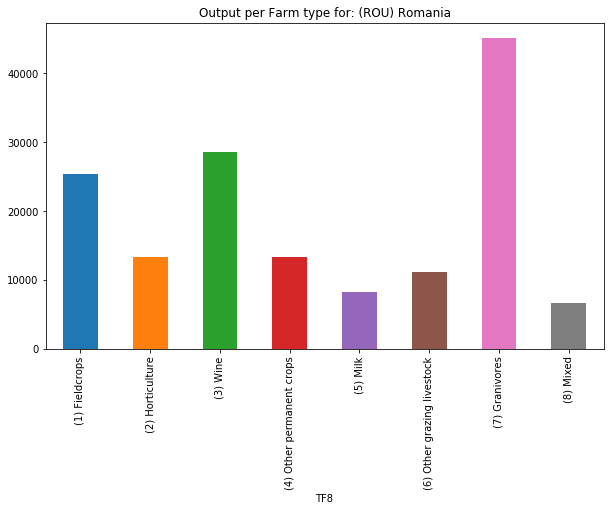

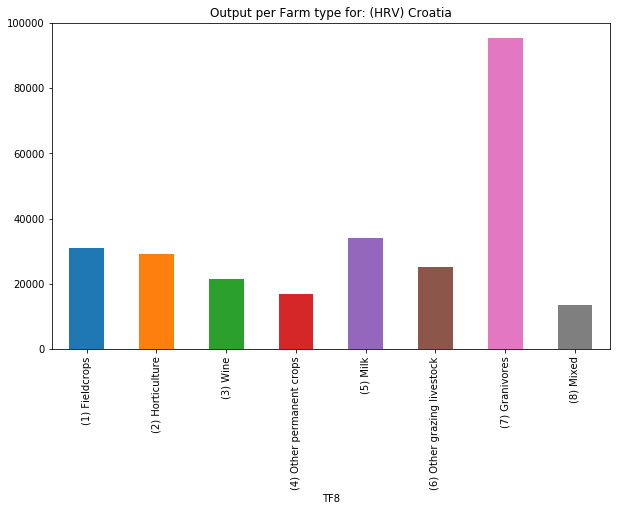

In [56]:
for country in general_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    general_data[general_data['COUNTRY']==country].groupby(['TF8']).mean()['SE131'].plot.bar()
    plt.title("Output per Farm type for: "+country)

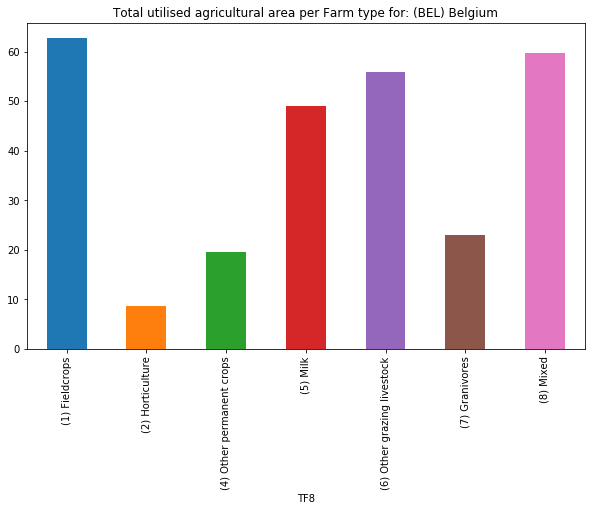

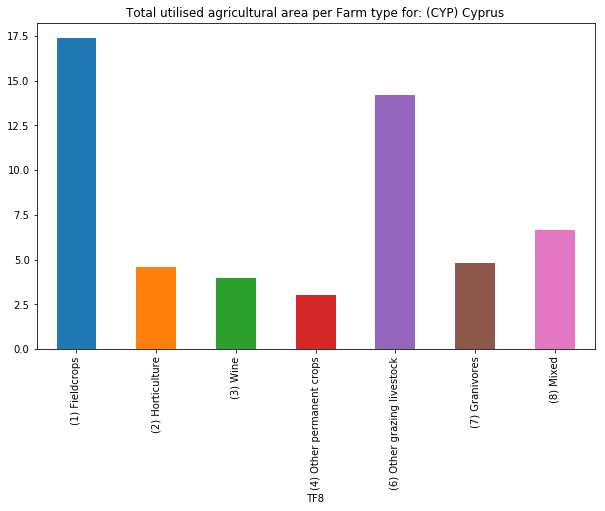

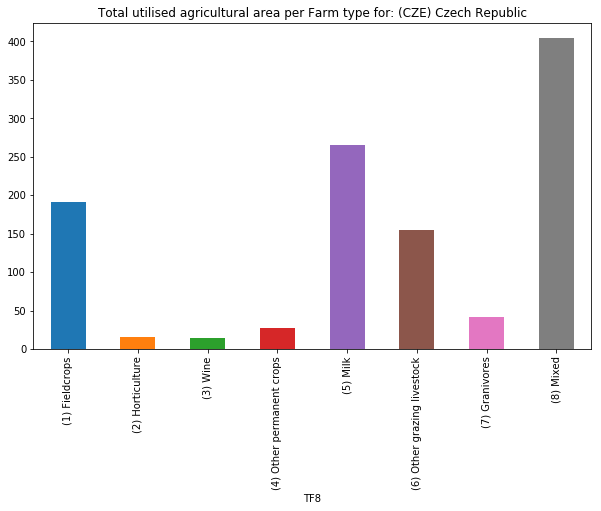

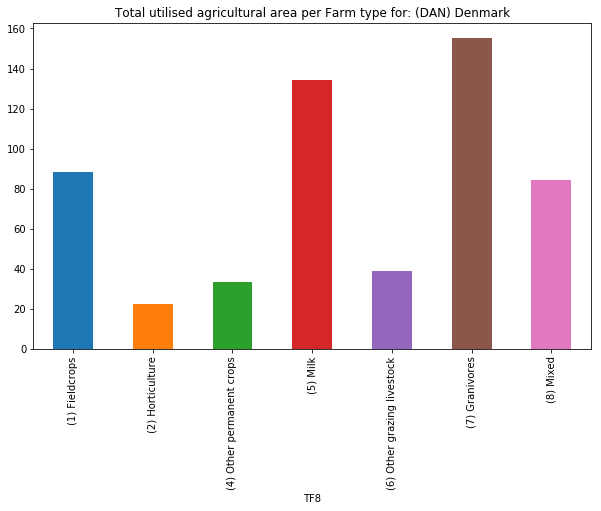

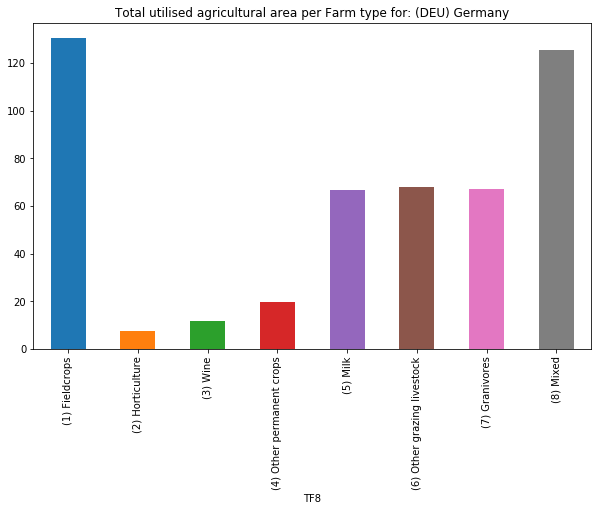

...

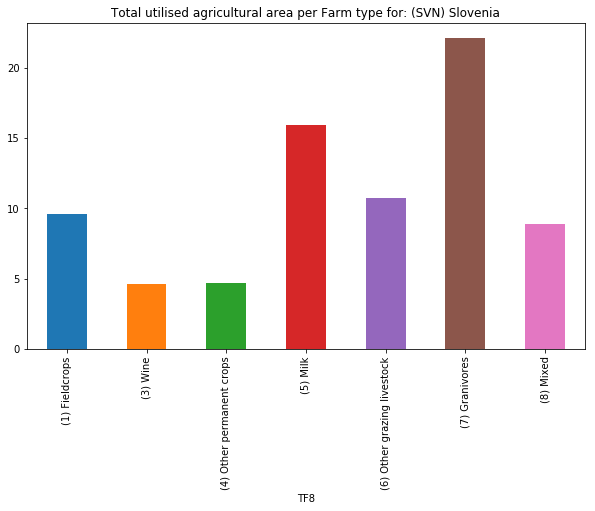

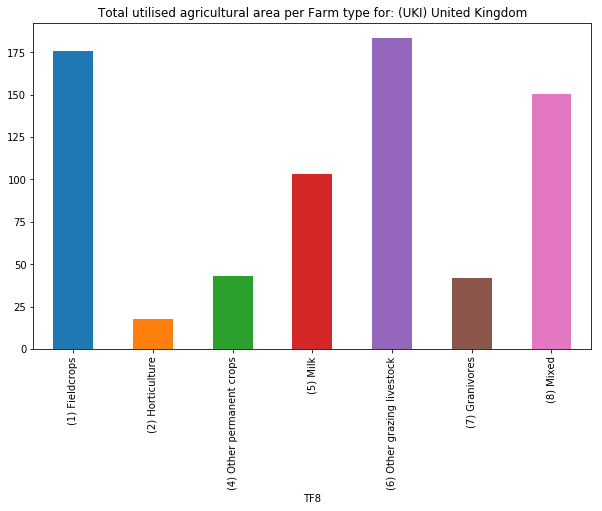

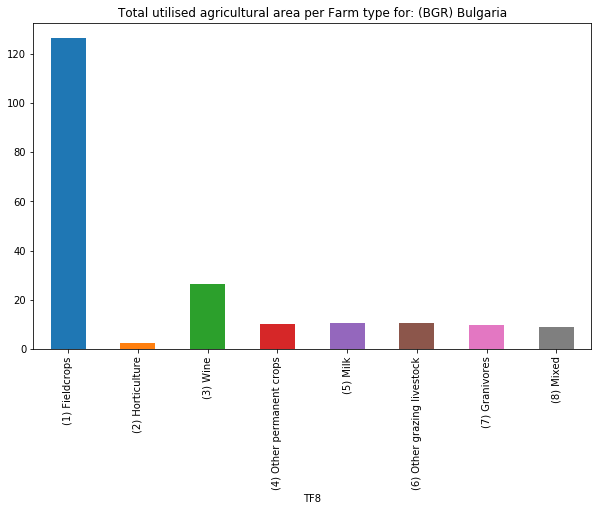

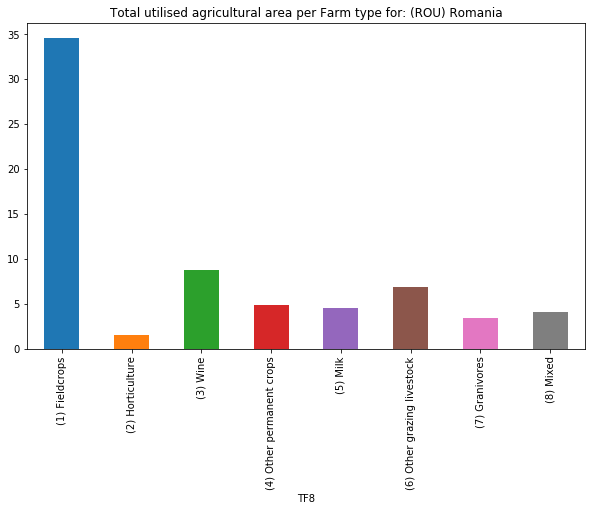

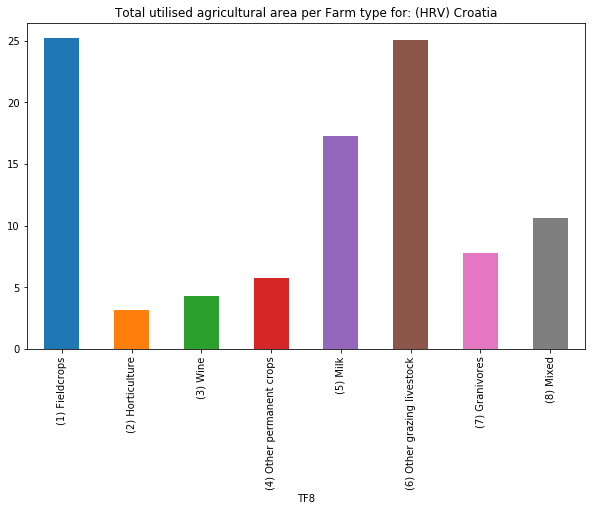

In [57]:
for country in general_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    general_data[general_data['COUNTRY']==country].groupby(['TF8']).mean()['SE025'].plot.bar()
    plt.title("Total utilised agricultural area per Farm type for: "+country)

<Figure size 720x432 with 0 Axes>

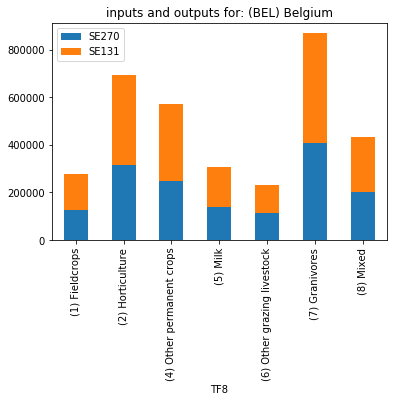

<Figure size 720x432 with 0 Axes>

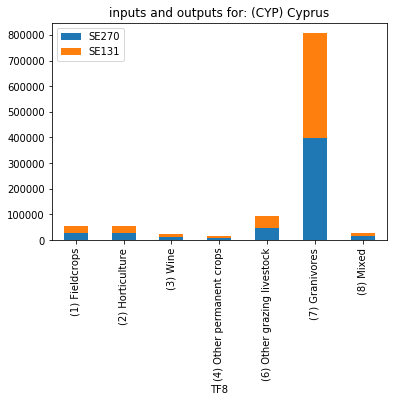

<Figure size 720x432 with 0 Axes>

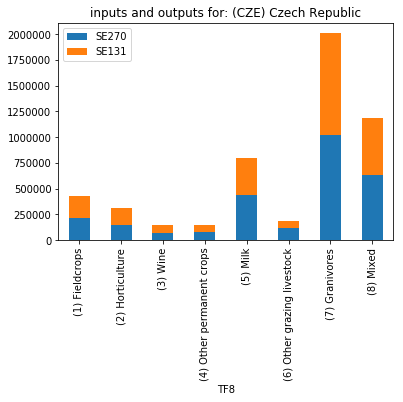

<Figure size 720x432 with 0 Axes>

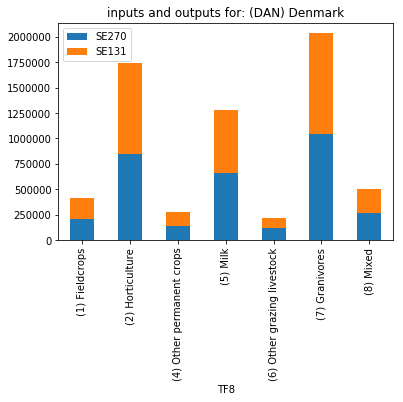

<Figure size 720x432 with 0 Axes>

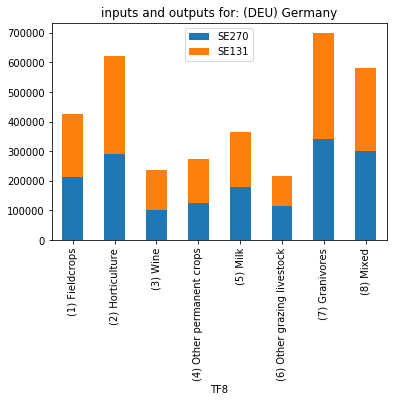

<Figure size 720x432 with 0 Axes>

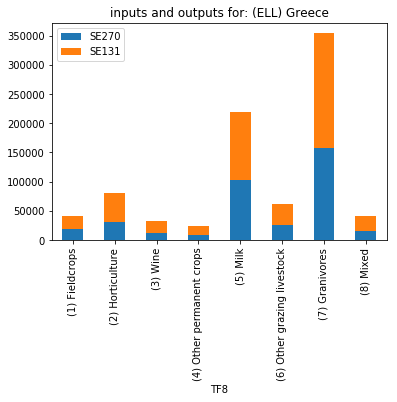

<Figure size 720x432 with 0 Axes>

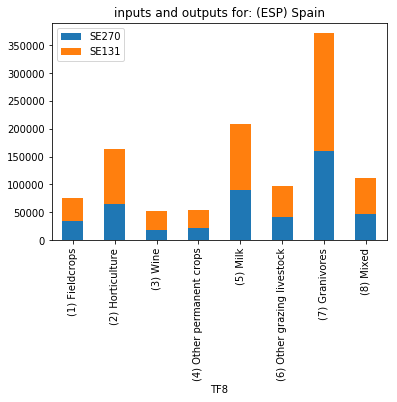

<Figure size 720x432 with 0 Axes>

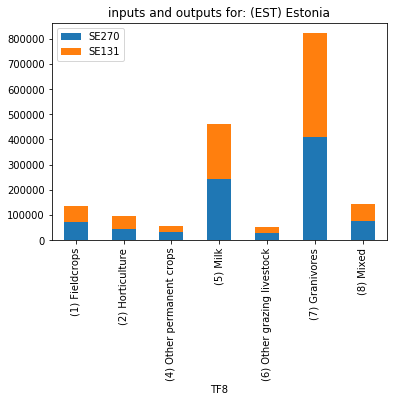

<Figure size 720x432 with 0 Axes>

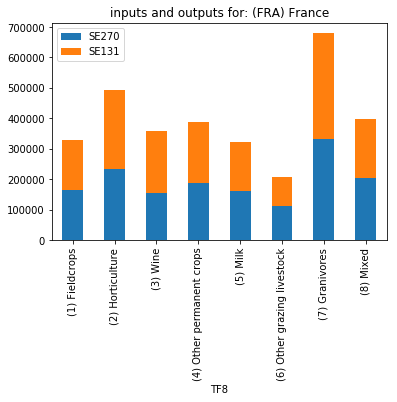

<Figure size 720x432 with 0 Axes>

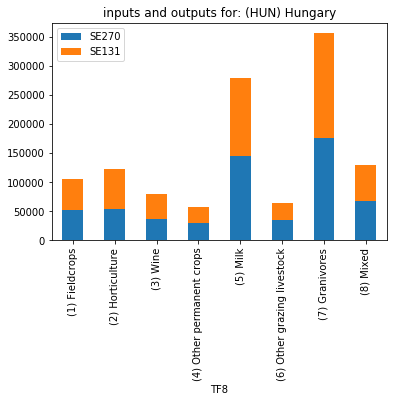

<Figure size 720x432 with 0 Axes>

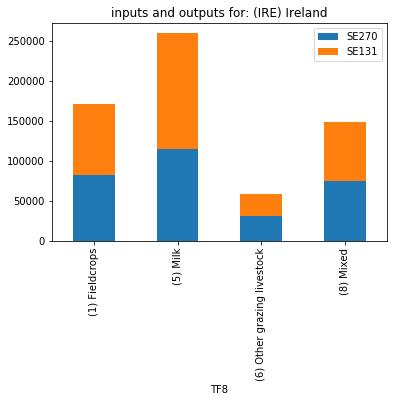

<Figure size 720x432 with 0 Axes>

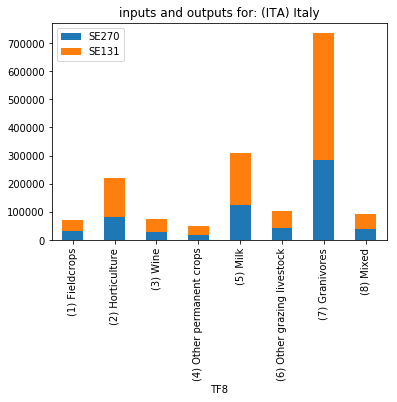

<Figure size 720x432 with 0 Axes>

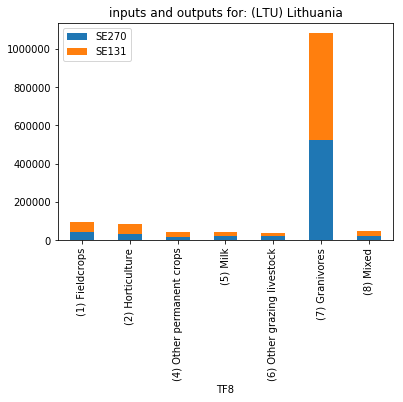

<Figure size 720x432 with 0 Axes>

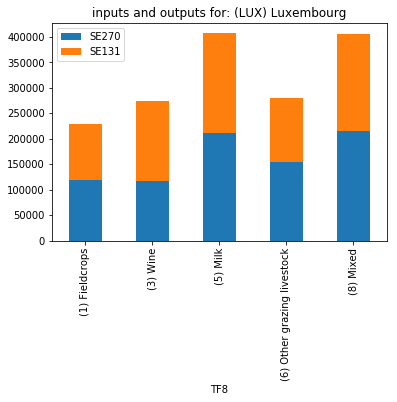

<Figure size 720x432 with 0 Axes>

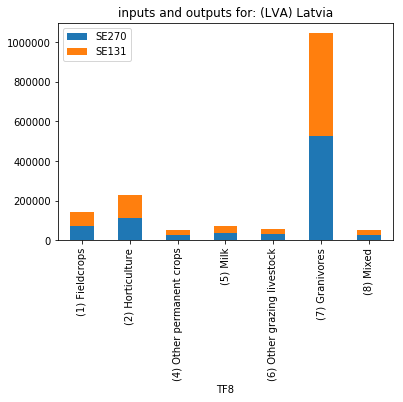

<Figure size 720x432 with 0 Axes>

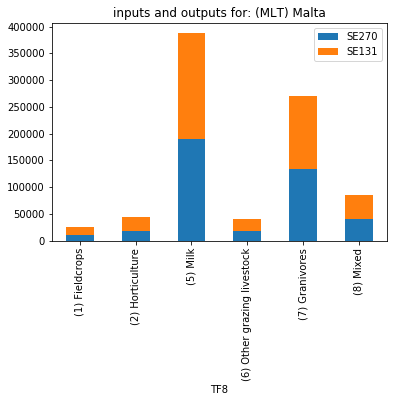

<Figure size 720x432 with 0 Axes>

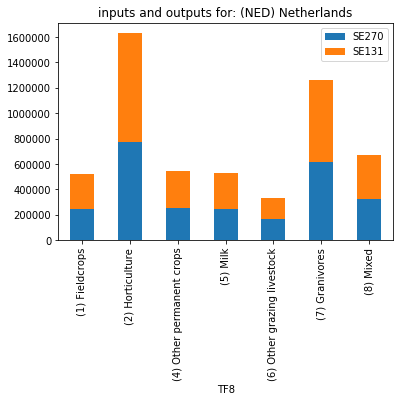

<Figure size 720x432 with 0 Axes>

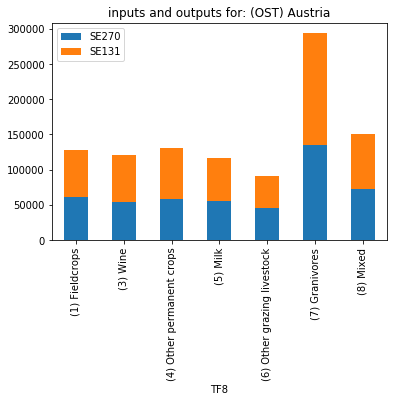

<Figure size 720x432 with 0 Axes>

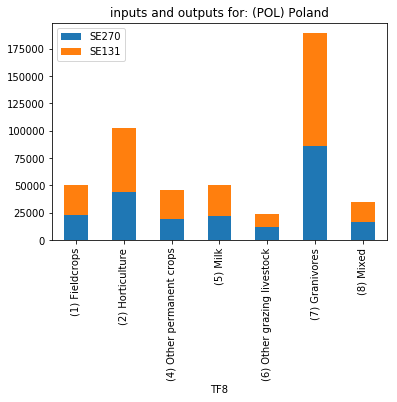

<Figure size 720x432 with 0 Axes>

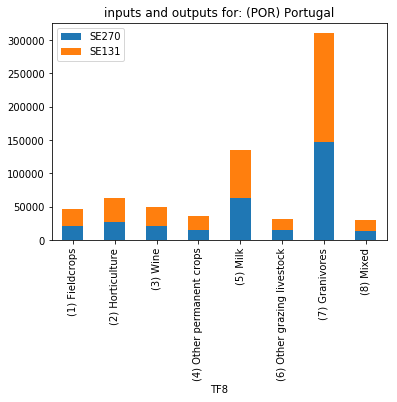

<Figure size 720x432 with 0 Axes>

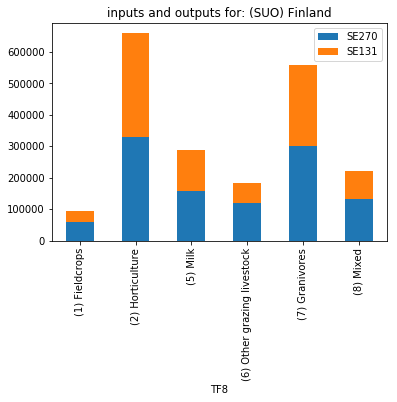

<Figure size 720x432 with 0 Axes>

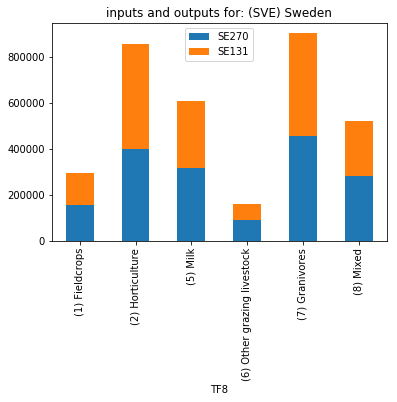

<Figure size 720x432 with 0 Axes>

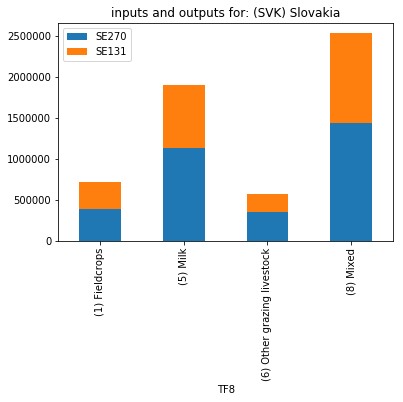

<Figure size 720x432 with 0 Axes>

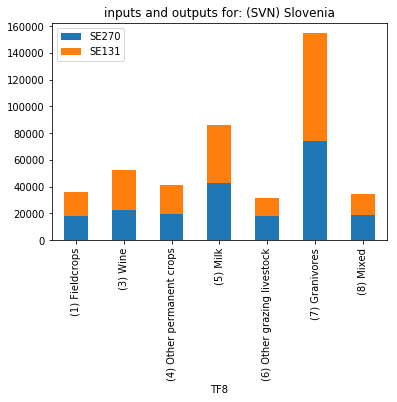

<Figure size 720x432 with 0 Axes>

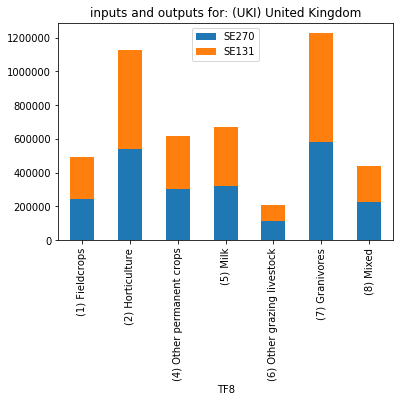

<Figure size 720x432 with 0 Axes>

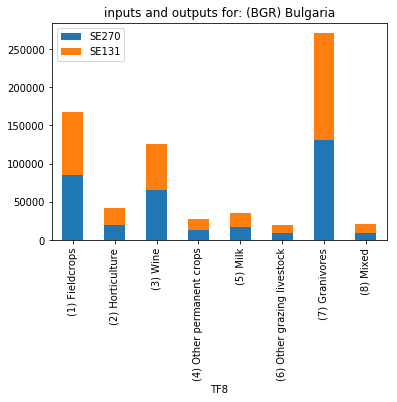

<Figure size 720x432 with 0 Axes>

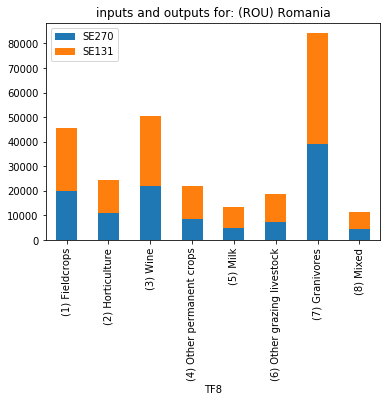

<Figure size 720x432 with 0 Axes>

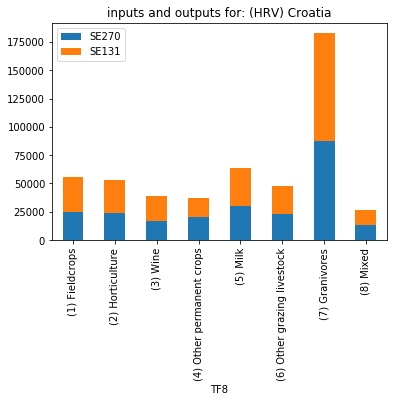

In [58]:
for country in general_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    general_data[general_data['COUNTRY']==country].groupby(['TF8']).mean()[['SE270', 'SE131']].plot.bar(stacked=True)
    plt.title("inputs and outputs for: "+country)

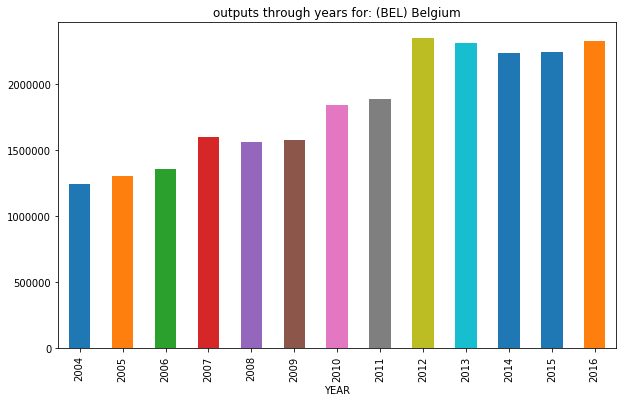

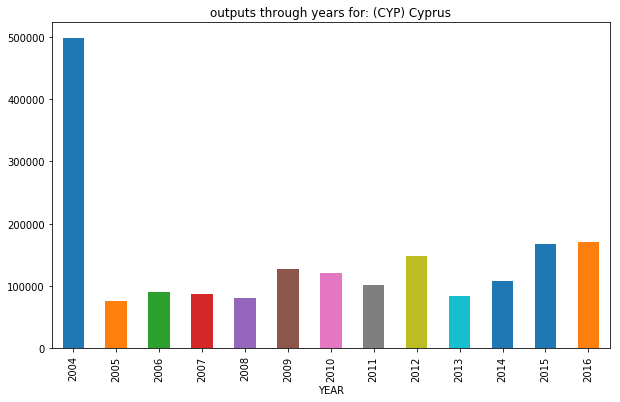

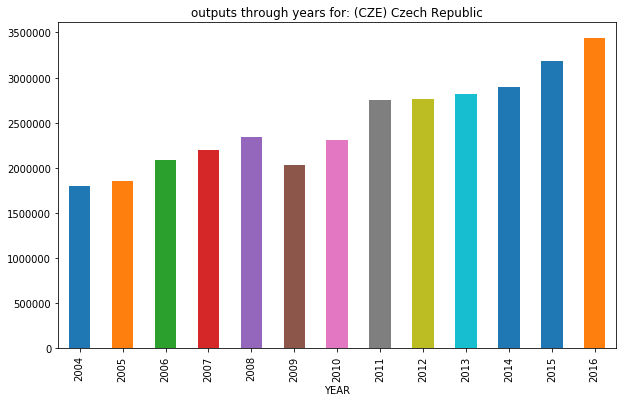

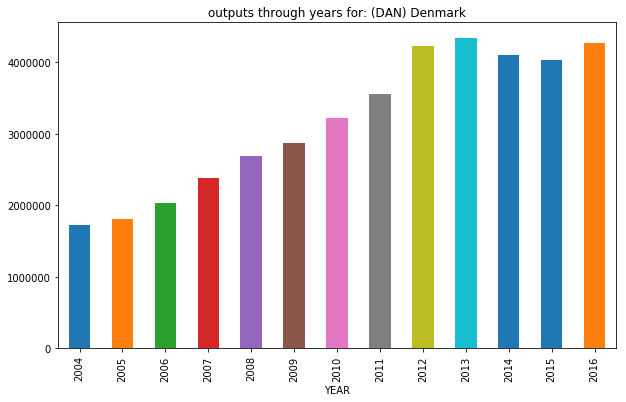

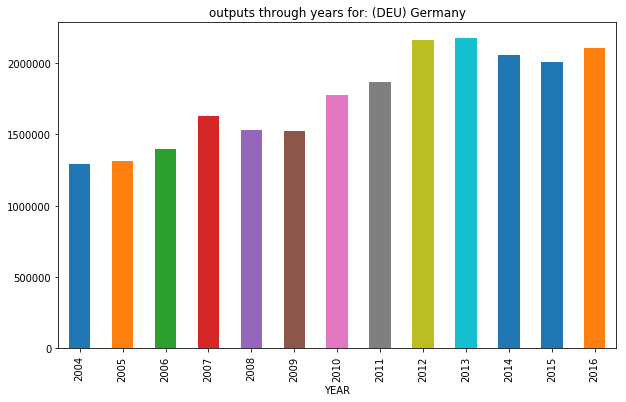

...

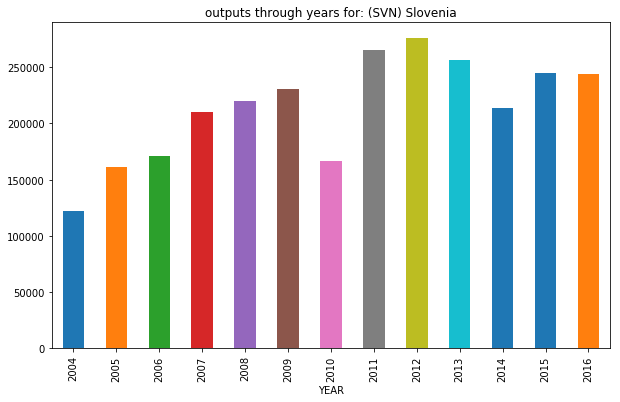

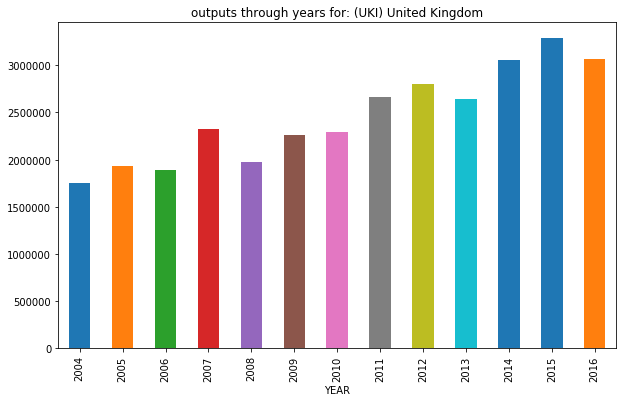

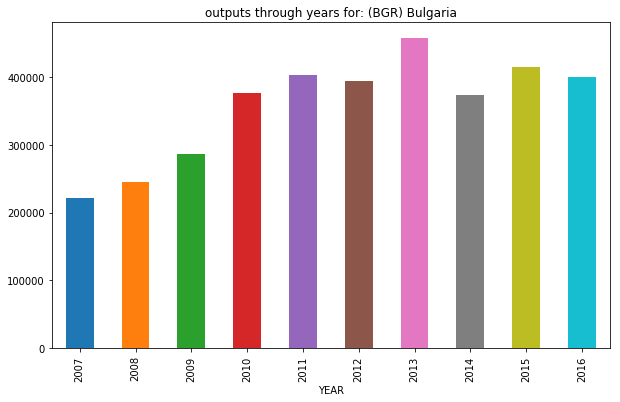

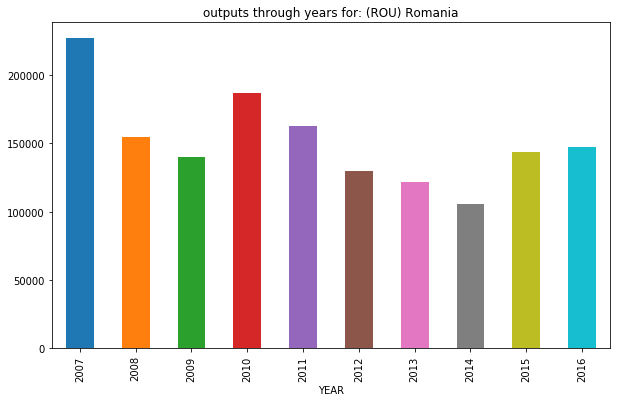

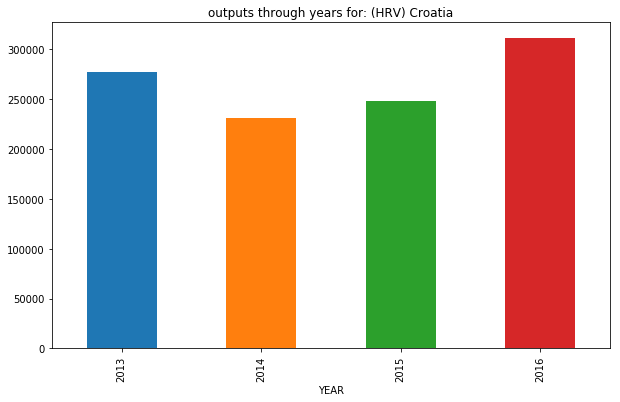

In [59]:
for country in general_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    general_data[general_data['COUNTRY']==country].groupby(['YEAR']).sum()['SE131'].plot.bar()
    plt.title("outputs through years for: "+country)

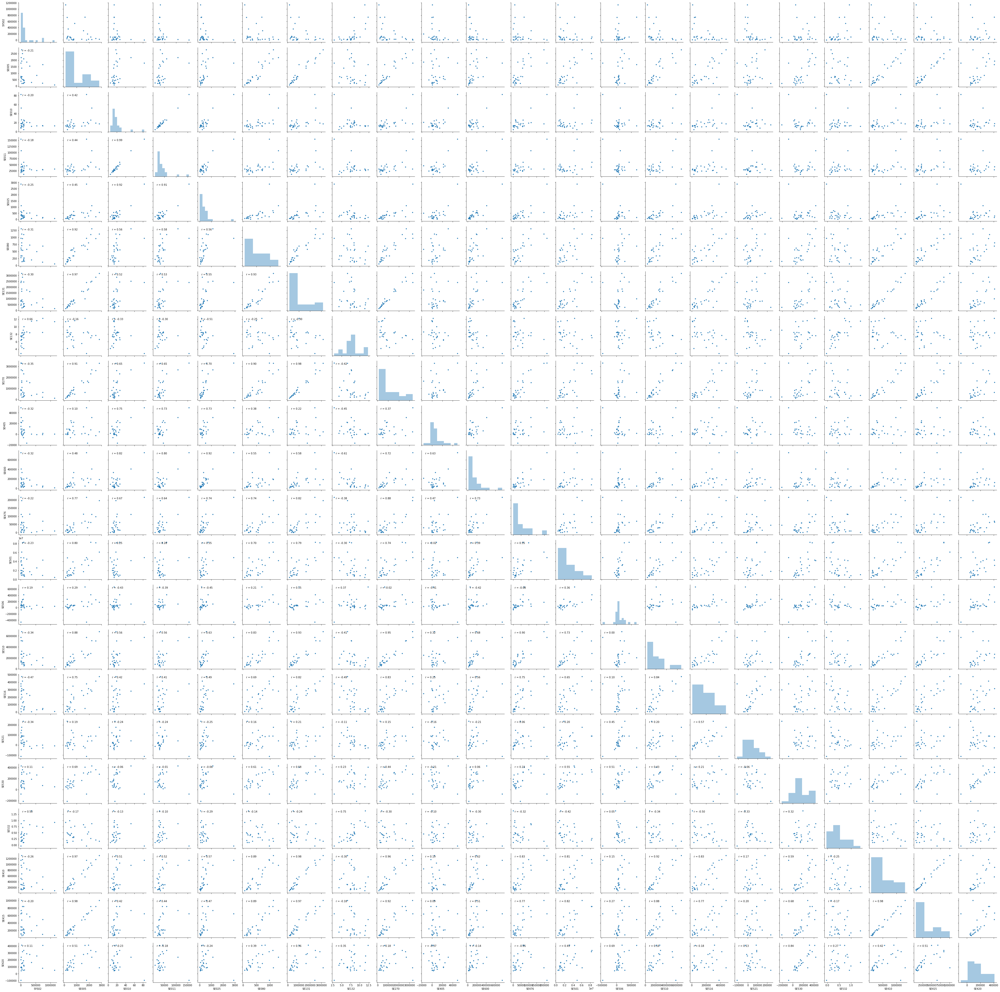

In [60]:
def corrfunc(x, y, **kws):
    r, _ = stats.pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.1, .9), xycoords=ax.transAxes)

g = sns.PairGrid(general_cluster, palette=["red"])
g.map_offdiag(plt.scatter, s=10)
g.map_diag(sns.distplot, kde=False)
g.map_lower(corrfunc)

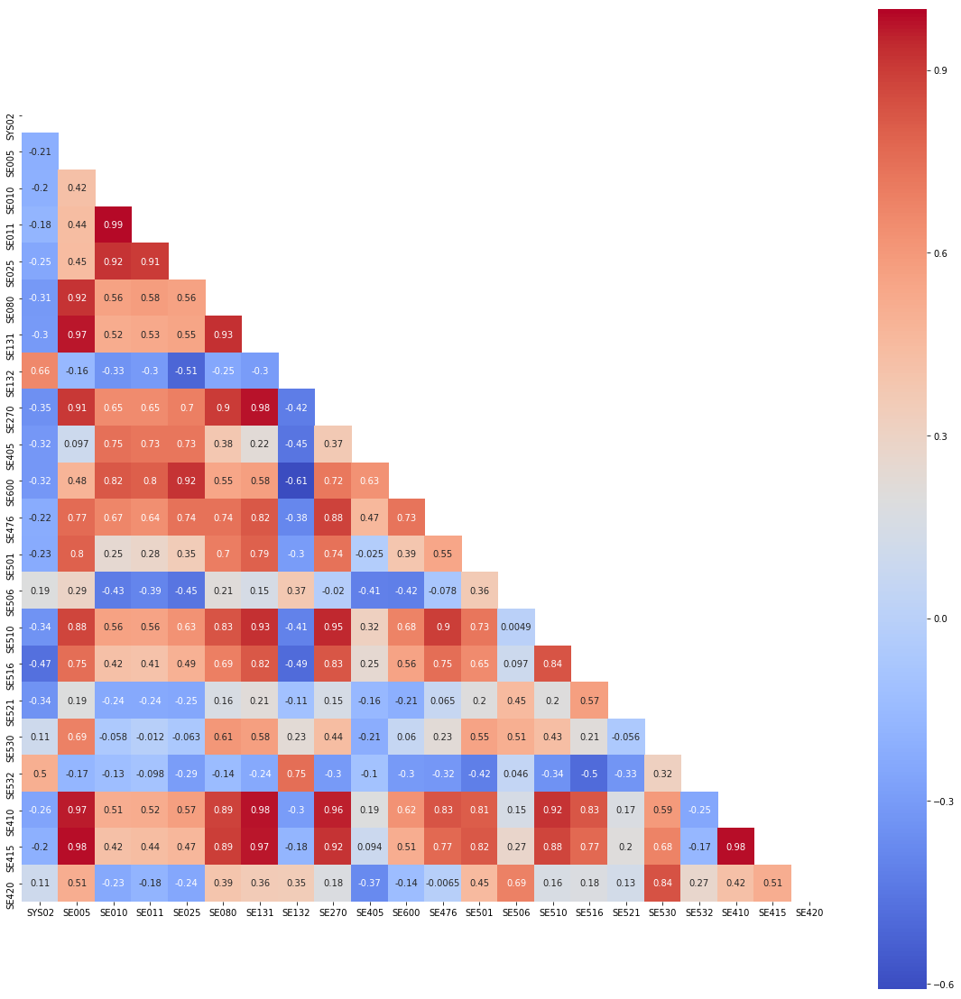

In [61]:
mask = np.zeros_like(general_cluster.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(20,20))
sns.heatmap(general_cluster.corr(), annot=True, mask=mask, square=True, cmap='coolwarm')

## Clustering of countries

In [62]:
data_cluster=general_cluster

In [63]:
data_cluster.head()

,SYS02,SE005,SE010,SE011,SE025,SE080,SE131,SE132,SE270,SE405,...,SE501,SE506,SE510,SE516,SE521,SE530,SE532,SE410,SE415,SE420
COUNTRY,,,,,,,,,,,,,,,,,,,,,
(BEL) Belgium,31467.692308,1941.992308,18.135385,42262.265385,278.242308,815.606154,1.836594e+06,8.355382,1.548478e+06,-435.923077,...,3.172725e+06,184676.076923,2.714423e+06,316084.538462,85700.000000,313441.615385,0.538387,9.009243e+05,6.705404e+05,414179.615385
(BGR) Bulgaria,121086.000000,286.190000,24.188000,44890.241000,204.628000,158.031000,3.568710e+05,8.475225,3.514193e+05,3901.800000,...,7.203714e+05,2857.200000,7.269694e+05,74967.900000,27488.500000,17848.200000,0.461037,1.809578e+05,1.334783e+05,55763.700000
(CYP) Cyprus,11612.307692,678.036480,13.704668,29771.930676,54.651760,556.874744,5.487240e+05,7.391379,5.331784e+05,2573.933566,...,1.557772e+06,-67879.250000,1.196544e+06,7593.329837,-44746.933566,87703.715618,0.309794,1.603422e+05,1.080027e+05,44139.534965
(CZE) Czech Republic,16227.115385,2204.803846,52.370449,107730.634423,1115.198974,1313.877628,2.502881e+06,7.609915,2.704271e+06,31506.871795,...,4.214009e+06,123174.429487,5.160452e+06,281692.993590,43320.833333,428993.250000,0.869800,9.732736e+05,7.349013e+05,239119.826923
(DAN) Denmark,29436.923077,2820.100000,17.790000,32874.491538,556.802308,1126.848462,3.173940e+06,6.595717,3.281279e+06,4589.538462,...,6.118377e+06,178261.538462,6.773346e+06,477925.230769,176052.538462,279954.846154,0.153630,1.309097e+06,1.007224e+06,87112.076923


### Scaling data

In [64]:
scaler=StandardScaler()
scaled_data_cluster_vals=scaler.fit_transform(data_cluster)

### PCA

In [65]:
def var_pca(df):
    cov_matrix = np.cov(df.T)
    eig_vals, eig_vects=np.linalg.eig(cov_matrix)
    eig_pairs=list(zip(eig_vals,eig_vects.T))
    eig_pairs.sort(reverse=True)
    sorted_eigVals=[eig_pairs[ind][0] for ind in range(len(eig_pairs))]
    sorted_eigVects=[eig_pairs[ind][1] for ind in range(len(eig_pairs))]
    var_exp=[var/sum(sorted_eigVals) for var in sorted_eigVals]
    var_cum=np.cumsum(sorted_eigVals)/sum(sorted_eigVals)
    return var_cum, var_exp
var_cum, var_exp=var_pca(scaled_data_cluster_vals)
var_cum

array([0.50999996, 0.72266295, 0.83565221, 0.87708121, 0.91282305,
       0.93973644, 0.9558838 , 0.97050662, 0.97929817, 0.98557249,
       0.99058927, 0.99422135, 0.99673399, 0.99782251, 0.99860242,
       0.99912263, 0.9995399 , 0.99975182, 0.99991045, 1.        ,
       1.        , 1.        ])

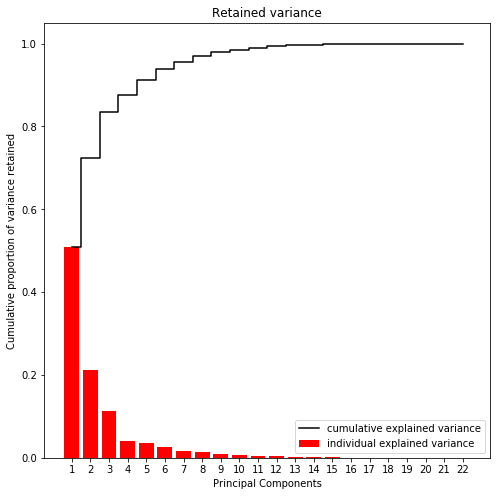

In [66]:
def varCum_plot(var_cum):
    plt.figure(figsize=(8,8))
    plt.step(range(1,len(var_cum)+1), var_cum, where='mid', label='cumulative explained variance', color='k')
    plt.bar(range(1,len(var_cum)+1), var_exp, label='individual explained variance', color='r')
    plt.xticks(range(1,len(var_cum)+1))
    plt.legend()
    plt.xlabel("Principal Components")
    plt.ylabel("Cumulative proportion of variance retained")
    plt.title("Retained variance")
varCum_plot(var_cum)

#### We'll use 9 components

In [67]:
pca=PCA(n_components=9)
pca_model=pca.fit_transform(scaled_data_cluster_vals)

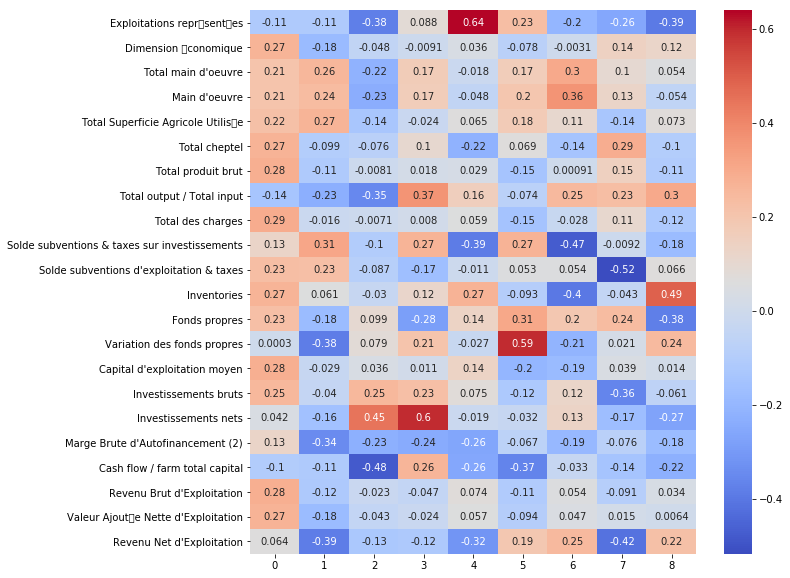

In [68]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.DataFrame(pca.components_, columns=data_expl[data_cluster.columns].values).T, annot=True, cmap='coolwarm')

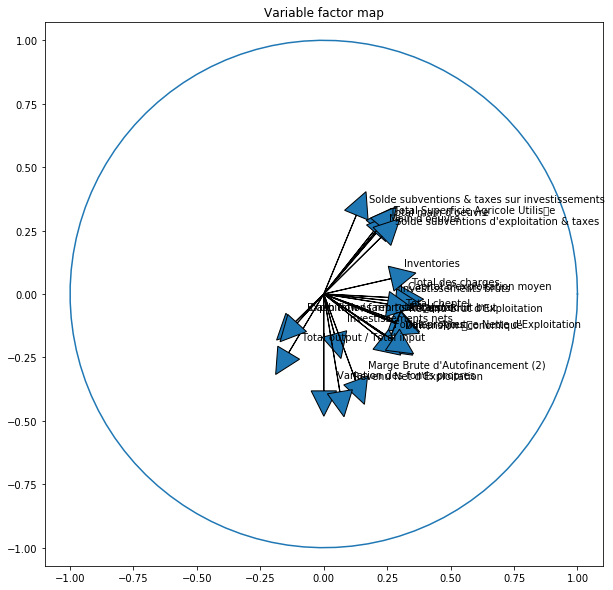

In [71]:
def plot_factor_map(data, pca, data_expl):
    # Plot a variable factor map for the first two dimensions.
    (fig, ax) = plt.subplots(figsize=(10, 10))
    for i in range(0, len(data.columns)):
        ax.arrow(0,
                 0,  # Start the arrow at the origin
                 pca.components_[0, i],  #0 for PC1
                 pca.components_[1, i],  #1 for PC2
                 head_width=0.1,
                 head_length=0.1)

        plt.text(pca.components_[0, i] + 0.05,
                 pca.components_[1, i] + 0.05,
             data_expl[data.columns].values[i])

    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
    plt.axis('equal')
    ax.set_title('Variable factor map')

plot_factor_map(data_cluster, pca, data_expl)

In [72]:
kmeans=KMeans(n_clusters=3)
kmeans.fit(pca_model)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

[0.38139406 1.         2.         3.         4.         5.
 6.         7.         8.         9.        ]
[0.38139406 0.38266988 2.         3.         4.         5.
 6.         7.         8.         9.        ]
[0.38139406 0.38266988 0.2693991  3.         4.         5.
 6.         7.         8.         9.        ]
[0.38139406 0.38266988 0.2693991  0.23283514 4.         5.
 6.         7.         8.         9.        ]
[0.38139406 0.38266988 0.2693991  0.23283514 0.22475722 5.
 6.         7.         8.         9.        ]
[0.38139406 0.38266988 0.2693991  0.23283514 0.22475722 0.20609159
 6.         7.         8.         9.        ]
[0.38139406 0.38266988 0.2693991  0.23283514 0.22475722 0.20609159
 0.21645662 7.         8.         9.        ]
[0.38139406 0.38266988 0.2693991  0.23283514 0.22475722 0.20609159
 0.21645662 0.22394536 8.         9.        ]
[0.38139406 0.38266988 0.2693991  0.23283514 0.22475722 0.20609159
 0.21645662 0.22394536 0.24104874 9.        ]
[0.38139406 0.38266988 

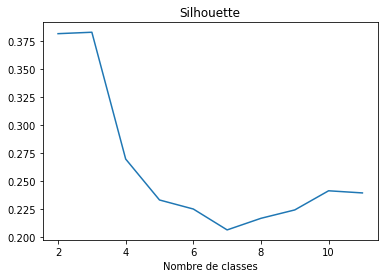

In [149]:
def silhoutte(pca_model):
    res = np.arange(10,dtype="double")
    for k in np.arange(10):
        km=KMeans(n_clusters=k+2)
        km.fit(pca_model)
        res[k] = metrics.silhouette_score(pca_model,km.labels_)
        print(res)
  # Graphique nombre optimal de classe (Silhouette )
    plt.title("Silhouette")
    plt.xlabel("Nombre de classes")
    plt.plot(np.arange(2,12,1),res)

silhoutte(pca_model)

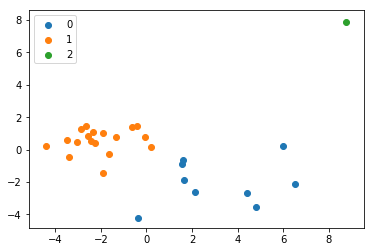

In [73]:
for i in range (3):
    plt.scatter(pca_model[np.where(kmeans.labels_==i)[0],0], pca_model[np.where(kmeans.labels_==i)[0],1], label=i)
    plt.legend()

In [74]:
df=pd.DataFrame(np.hstack((pca_model,kmeans.labels_.reshape(1,-1).T)), columns=[1,2,3,4,5,6,7,8,9,'labels'], index=data_cluster.index)
df

,1,2,3,4,5,6,7,8,9,labels
COUNTRY,,,,,,,,,,
(BEL) Belgium,2.139839,-2.599374,0.010779,0.156490,-0.848158,-0.446390,0.709051,-0.620684,0.519356,0.0
(BGR) Bulgaria,-2.656609,1.458292,0.128487,0.297969,0.090764,-0.140636,0.601643,0.469812,0.327350,1.0
(CYP) Cyprus,-2.354132,1.114709,0.260779,-1.168767,-0.374093,-0.439527,-0.093240,1.428098,0.127055,1.0
(CZE) Czech Republic,6.010748,0.238087,-2.458197,1.040487,-1.645054,0.107048,-0.089306,0.074833,-0.428508,0.0
(DAN) Denmark,6.531667,-2.103001,1.989804,0.870612,1.559194,-1.587080,-1.250962,0.668498,-0.014968,0.0
(DEU) Germany,1.660436,-1.863803,-0.337479,-0.998054,0.530327,-0.726753,1.675247,-0.336309,-0.020902,0.0
(ELL) Greece,-3.400834,-0.434673,-2.615207,0.208712,-0.405650,-1.371068,0.354641,-0.032593,-0.250695,1.0
(ESP) Spain,-1.911730,-1.458682,-2.012661,-0.244699,0.251697,0.002618,0.345097,-0.026517,-0.133078,1.0
(EST) Estonia,-0.400288,1.453242,0.937915,0.685022,-0.761356,0.400919,-0.605962,0.154296,0.032769,1.0


In [75]:
df[df['labels']==0].index

Index(['(BEL) Belgium', '(CZE) Czech Republic', '(DAN) Denmark',
       '(DEU) Germany', '(FRA) France', '(ITA) Italy', '(NED) Netherlands',
       '(SVE) Sweden', '(UKI) United Kingdom'],
      dtype='object', name='COUNTRY')

In [76]:
df[df['labels']==1].index

Index(['(BGR) Bulgaria', '(CYP) Cyprus', '(ELL) Greece', '(ESP) Spain',
       '(EST) Estonia', '(HRV) Croatia', '(HUN) Hungary', '(IRE) Ireland',
       '(LTU) Lithuania', '(LUX) Luxembourg', '(LVA) Latvia', '(MLT) Malta',
       '(OST) Austria', '(POL) Poland', '(POR) Portugal', '(ROU) Romania',
       '(SUO) Finland', '(SVN) Slovenia'],
      dtype='object', name='COUNTRY')

In [77]:
df[df['labels']==2].index

Index(['(SVK) Slovakia'], dtype='object', name='COUNTRY')

In [78]:
#scaled_data_cluster_vals_orig=scaler.inverse_transform(scaled_data_cluster_vals)
#data_cluster_df=pd.DataFrame(scaled_data_cluster_vals_orig, columns=data_cluster.columns)

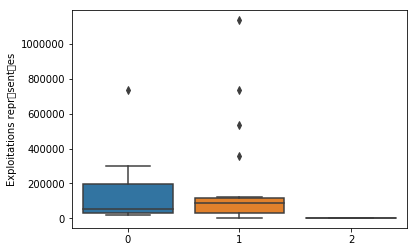

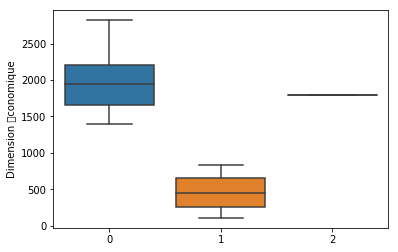

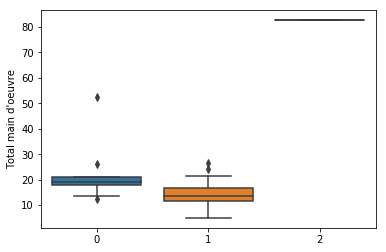

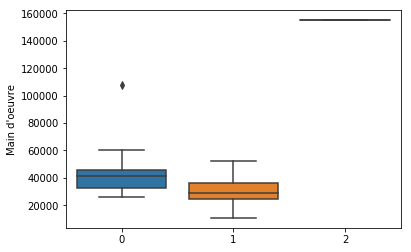

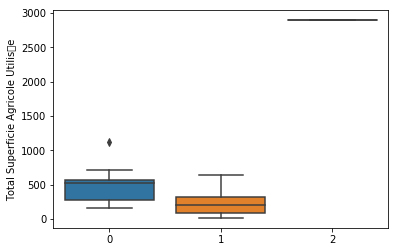

...

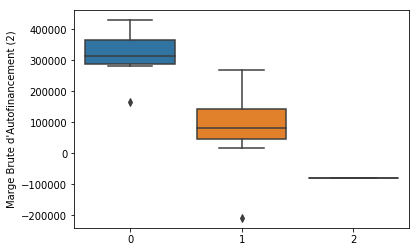

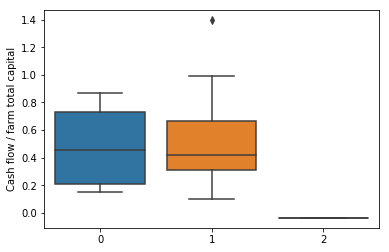

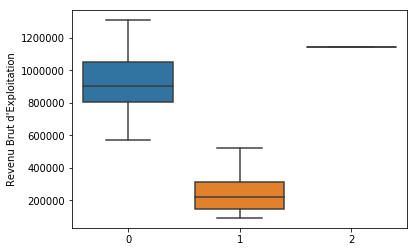

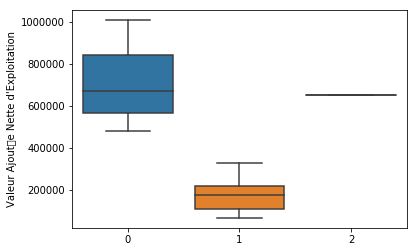

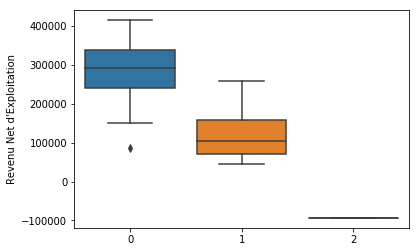

In [79]:
for feat in data_cluster.columns:
    plt.figure()
    sns.boxplot(x=kmeans.labels_,y=data_cluster[feat])
    plt.ylabel(data_expl[feat])

In [158]:
kmeans.labels_.T

array([0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 2, 1, 0], dtype=int32)

In [182]:
df_inter=general_data.drop('YEAR', axis=1).groupby(['COUNTRY', 'TF8']).mean()
df_inter=df_inter.unstack()
df_inter['labels'] = kmeans.labels_
df_inter.set_index('labels', append=True, inplace=True)
df_inter=df_inter.stack()
df_inter['SE131']

COUNTRY               labels  TF8                        
(BEL) Belgium         0       (1) Fieldcrops                 1.524772e+05
                              (2) Horticulture               3.780945e+05
                              (4) Other permanent crops      3.219245e+05
                              (5) Milk                       1.697179e+05
                              (6) Other grazing livestock    1.190037e+05
                              (7) Granivores                 4.632743e+05
                              (8) Mixed                      2.321016e+05
(BGR) Bulgaria        1       (1) Fieldcrops                 8.158010e+04
                              (2) Horticulture               2.196870e+04
                              (3) Wine                       5.989130e+04
                              (4) Other permanent crops      1.338490e+04
                              (5) Milk                       1.835390e+04
                              (6) Other grazing livest

# Zoom on Production

In [80]:
production_columns=['SE131', 'SE135', 'SE206', 'SE256', 'SE136', 'SE207', 'SE140', 'SE145', 'SE150', 'SE155', 'SE160', 'SE165', 'SE170', 'SE175','SE180', 'SE185', 'SE190', 'SE195', 'SE200', 'SE216', 'SE220', 'SE225', 'SE230', 'SE235', 'SE240', 'SE245', 'SE251', 'SE260', 'SE265', 'SE146']

In [81]:
data_expl[production_columns]

code
SE131                   Total produit brut
SE135           Total produit brut vgtal
SE206                 Total produit animal
SE256                   autre produit brut
SE136              Total crops output / ha
SE207          Total livestock output / LU
SE140                             crales
SE145                         protagineux
SE150                      pommes de terre
SE155                 betteraves sucrires
SE160                           olagineux
SE165                plantes industrielles
SE170                    lgumes et fleurs
SE175                               fruits
SE180                              agrumes
SE185              vin et raisins de table
SE190              olives et huile d'olive
SE195                 cultures fourragres
SE200                autre produit vgtal
SE216    lait de vache & produits laitiers
SE220                        viande bovine
SE225                       viande porcine
SE230              viande ovine et caprine
SE235 

In [82]:
production_data=new_data[['YEAR', 'COUNTRY', 'TF8']+production_columns]

In [83]:
production_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2332 entries, 0 to 2573
Data columns (total 33 columns):
YEAR       2332 non-null int64
COUNTRY    2332 non-null object
TF8        2332 non-null object
SE131      2332 non-null float64
SE135      2332 non-null float64
SE206      2332 non-null float64
SE256      2332 non-null float64
SE136      2332 non-null float64
SE207      2240 non-null float64
SE140      2332 non-null float64
SE145      2332 non-null float64
SE150      2332 non-null float64
SE155      2332 non-null float64
SE160      2332 non-null float64
SE165      2332 non-null float64
SE170      2332 non-null float64
SE175      2332 non-null float64
SE180      2332 non-null float64
SE185      2332 non-null float64
SE190      2332 non-null float64
SE195      2332 non-null float64
SE200      2332 non-null float64
SE216      2332 non-null float64
SE220      2332 non-null float64
SE225      2332 non-null float64
SE230      2332 non-null float64
SE235      2332 non-null float64
SE240 

In [84]:
production_data['SE207'].isnull().sum()

92

In [85]:
production_data['SE207'].fillna(new_data['SE206']/(new_data['SE080']+10**-30), inplace=True)

In [86]:
production_data['T_crop_product']=(production_data['SE135']/(production_data['SE131']+10**-30))*100
production_data['T_livestock_product']=(production_data['SE206']/(production_data['SE131']+10**-30))*100
production_data['T_other_product']=(production_data['SE256']/(production_data['SE131']+10**-30))*100

In [87]:
data_expl['T_crop_product']='output crops/total output'
data_expl['T_livestock_product']='output livestock/total output'
data_expl['T_other_product']='other output/total output'

In [88]:
production_data.drop(['SE135','SE206', 'SE256', 'SE131'], axis=1, inplace=True)

In [89]:
product_cluster=(production_data.drop('YEAR', axis=1).groupby(['COUNTRY', 'TF8']).mean()).groupby(level=[0]).sum()
product_cluster.head()

,SE136,SE207,SE140,SE145,SE150,SE155,SE160,SE165,SE170,SE175,...,SE235,SE240,SE245,SE251,SE260,SE265,SE146,T_crop_product,T_livestock_product,T_other_product
COUNTRY,,,,,,,,,,,,,,,,,,,,,
(BEL) Belgium,62434.322566,5.123077e+32,94788.846154,1037.230769,64738.384615,42610.000000,2640.384615,9215.384615,329486.846154,298812.076923,...,77285.000000,50310.230769,2010.769231,18450.461538,1588.846154,43025.692308,817.846154,337.370089,339.878822,22.751144
(BGR) Bulgaria,14924.476181,6.446722e+03,55234.200000,276.100000,1985.100000,2.800000,26377.100000,3627.500000,19426.400000,12675.500000,...,38065.500000,28443.800000,2756.200000,15635.200000,4116.800000,15090.500000,22.500000,458.233415,306.366315,35.402541
(CYP) Cyprus,16930.613227,9.076677e+03,7332.081002,417.134615,7397.708625,2.461538,45.615385,219.769231,37482.180070,5957.888112,...,135441.480769,103672.173077,24389.346154,4844.935897,4732.177739,10092.222611,0.000000,424.636298,254.314406,21.052910
(CZE) Czech Republic,30125.967012,6.144520e+03,300713.371795,3664.391026,43844.564103,31217.538462,115710.794872,8391.769231,128609.134615,67504.858974,...,248255.538462,148073.230769,1708.384615,24361.858974,2613.314103,170084.788462,2762.615385,482.282806,254.733836,62.983731
(DAN) Denmark,45957.050008,3.438462e+32,279981.307692,2018.230769,29256.692308,13373.769231,36323.846154,190.538462,739888.307692,43469.307692,...,33288.384615,29553.538462,0.000000,137541.692308,913.230769,232301.461538,3195.461538,303.161320,305.500691,91.337632


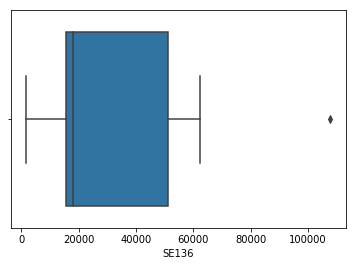

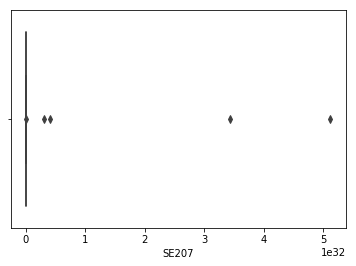

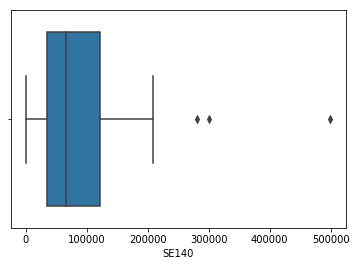

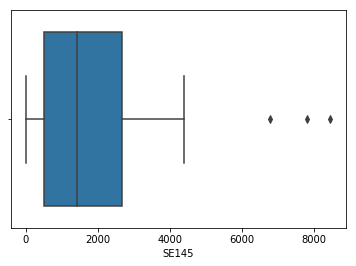

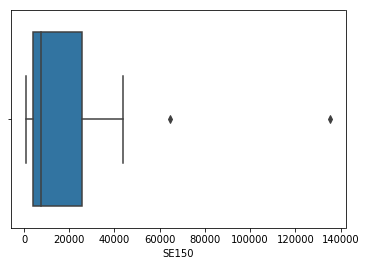

...

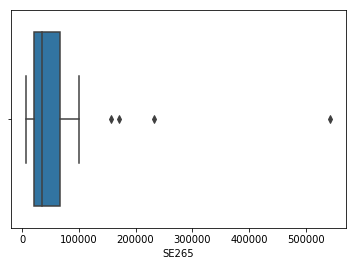

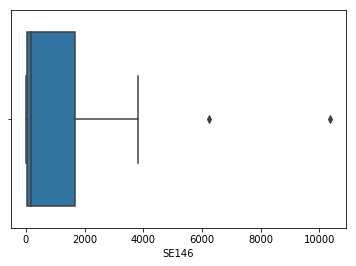

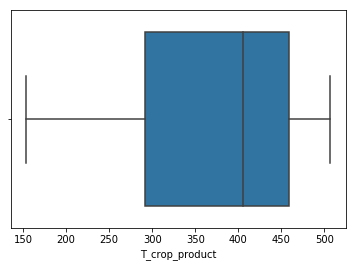

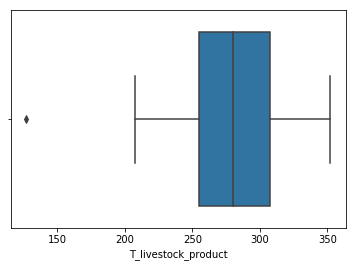

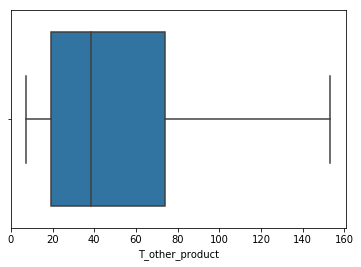

In [90]:
for feat in product_cluster.columns:
    plt.figure()
    sns.boxplot(product_cluster[feat])

In [91]:
product_cluster.describe()

,SE136,SE207,SE140,SE145,SE150,SE155,SE160,SE165,SE170,SE175,...,SE235,SE240,SE245,SE251,SE260,SE265,SE146,T_crop_product,T_livestock_product,T_other_product
count,28.000000,2.800000e+01,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,...,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,30306.479246,3.313248e+31,105179.839978,2099.963931,18639.459830,10009.621444,24484.096154,2491.445391,155059.676895,50090.439541,...,53241.401794,53604.152807,7274.768740,22942.240392,4648.255235,71064.673704,1333.057540,374.175010,276.823749,49.001284
std,24299.447630,1.142627e+32,112434.935111,2318.894764,27630.019953,14211.052339,40202.280512,2842.220339,208788.935270,79987.168658,...,58836.329937,54589.065423,10517.523366,30461.277120,6567.174586,106948.725975,2307.142384,101.535245,48.375123,36.284988
min,1665.748586,2.938935e+03,0.000000,0.000000,835.230769,0.000000,0.000000,0.000000,422.000000,73.538462,...,-37.858974,391.692308,0.000000,-2392.846154,179.769231,6856.700000,0.000000,153.303179,126.863552,7.242169
25%,15718.537991,5.838840e+03,34448.950321,503.802885,4071.927885,382.538462,2713.307692,299.115385,23207.600000,6729.097028,...,17523.262821,12523.884615,119.750000,4799.653846,1169.115385,21338.701923,21.050000,292.047110,254.628979,19.402107
50%,17948.631263,6.792415e+03,65545.784149,1420.847436,7424.811577,2446.538462,9851.674359,1255.444444,52657.692308,15898.229701,...,34390.307692,37896.297203,2207.000000,10869.000000,2802.604720,34577.375000,157.775641,405.124656,279.976661,38.537288
75%,51136.908148,1.023296e+04,121870.576923,2680.442308,25775.653846,14031.000000,27687.940385,3308.086538,261172.250000,44298.711538,...,75165.730769,59929.423077,10883.326923,32872.544017,4846.397727,66125.461538,1660.096154,459.302759,307.431367,74.175609
max,107787.272475,5.123077e+32,499281.615385,8451.461538,135419.307692,42610.000000,188462.000000,9215.384615,739888.307692,298812.076923,...,248255.538462,180631.267949,37370.923077,137541.692308,31960.615385,543207.307692,10367.384615,506.776935,352.163726,153.241639


In [92]:
'''
for feat in production_columns:
    q1=product_cluster.describe().loc['25%',feat]
    q3=product_cluster.describe().loc['75%',feat]
    IQR=q3-q1
    product_cluster[feat]=product_cluster[feat].apply(lambda x: q1-1.5*IQR if x<q1-1.5*IQR else x)
    product_cluster[feat]=product_cluster[feat].apply(lambda x: q3+1.5*IQR if x>q3+1.5*IQR else x)
'''

"\nfor feat in production_columns:\n    q1=product_cluster.describe().loc['25%',feat]\n    q3=product_cluster.describe().loc['75%',feat]\n    IQR=q3-q1\n    product_cluster[feat]=product_cluster[feat].apply(lambda x: q1-1.5*IQR if x<q1-1.5*IQR else x)\n    product_cluster[feat]=product_cluster[feat].apply(lambda x: q3+1.5*IQR if x>q3+1.5*IQR else x)\n"

In [93]:
product_cluster.columns

Index(['SE136', 'SE207', 'SE140', 'SE145', 'SE150', 'SE155', 'SE160', 'SE165',
       'SE170', 'SE175', 'SE180', 'SE185', 'SE190', 'SE195', 'SE200', 'SE216',
       'SE220', 'SE225', 'SE230', 'SE235', 'SE240', 'SE245', 'SE251', 'SE260',
       'SE265', 'SE146', 'T_crop_product', 'T_livestock_product',
       'T_other_product'],
      dtype='object')

Text(0.5,1,'Production per country')

<Figure size 1080x720 with 0 Axes>

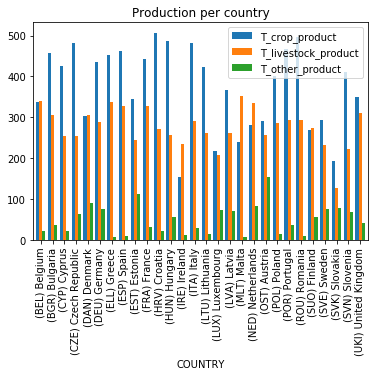

In [94]:
plt.figure(figsize=(15,10))
product_cluster[['T_crop_product','T_livestock_product', 'T_other_product']].plot.bar(width=0.8)
plt.title("Production per country")

<Figure size 720x432 with 0 Axes>

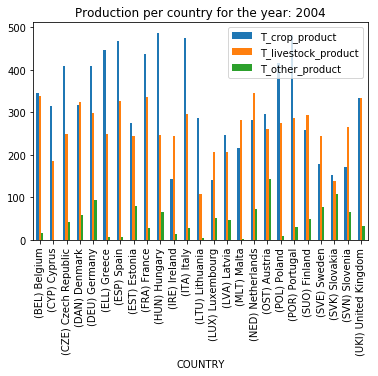

<Figure size 720x432 with 0 Axes>

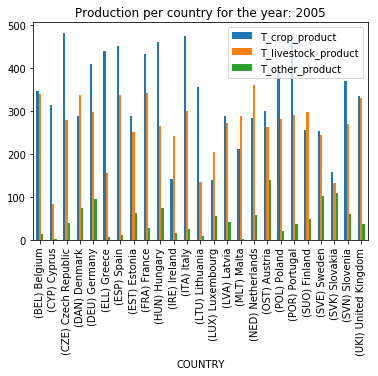

<Figure size 720x432 with 0 Axes>

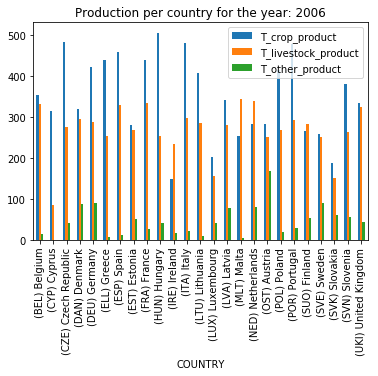

<Figure size 720x432 with 0 Axes>

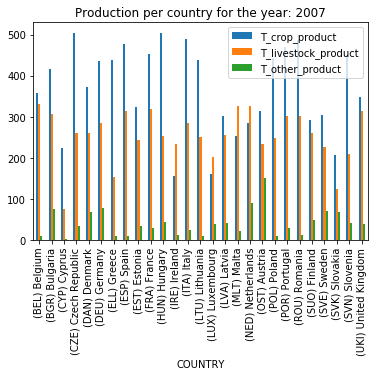

<Figure size 720x432 with 0 Axes>

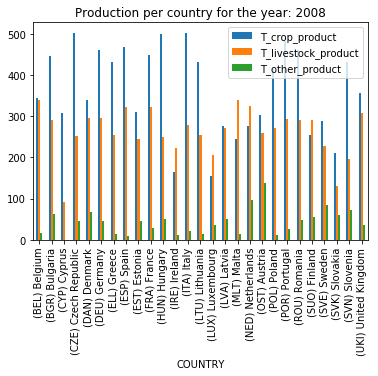

<Figure size 720x432 with 0 Axes>

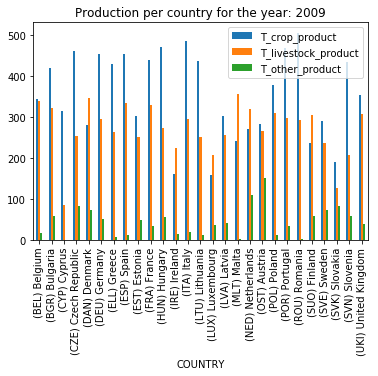

<Figure size 720x432 with 0 Axes>

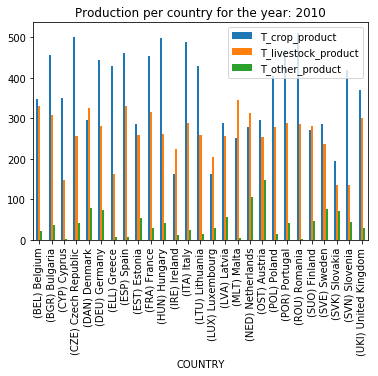

<Figure size 720x432 with 0 Axes>

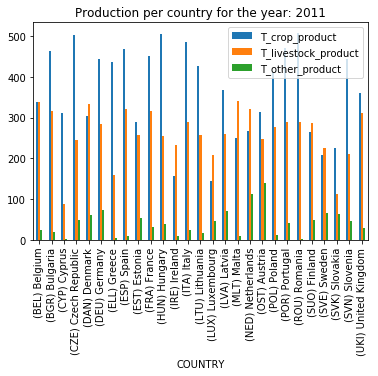

<Figure size 720x432 with 0 Axes>

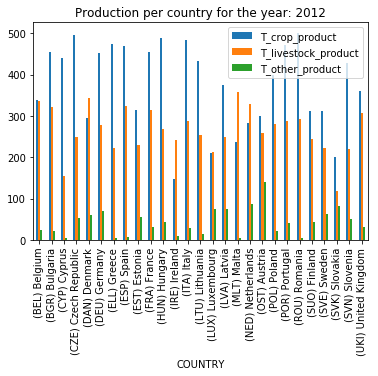

<Figure size 720x432 with 0 Axes>

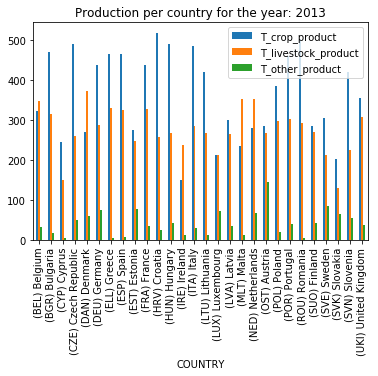

<Figure size 720x432 with 0 Axes>

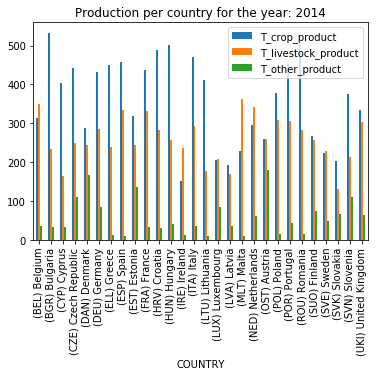

<Figure size 720x432 with 0 Axes>

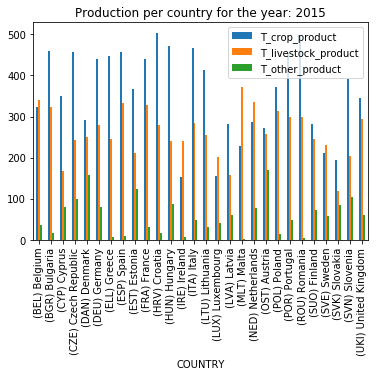

<Figure size 720x432 with 0 Axes>

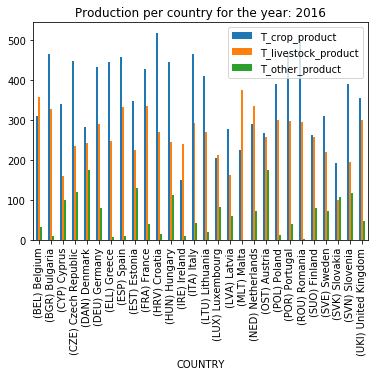

In [95]:
for year in production_data['YEAR'].unique():
    plt.figure(figsize=(10,6))
    production_data[production_data['YEAR']==year].groupby(['COUNTRY']).sum()[['T_crop_product','T_livestock_product', 'T_other_product']].plot.bar()
    plt.title("Production per country for the year: "+str(year))

<Figure size 720x432 with 0 Axes>

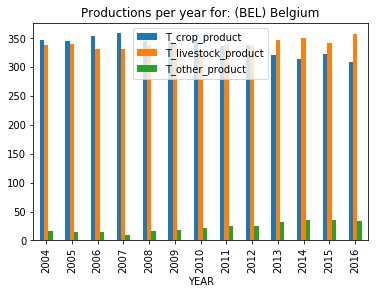

<Figure size 720x432 with 0 Axes>

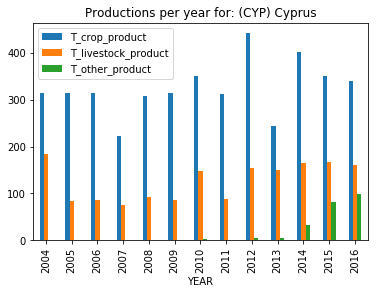

<Figure size 720x432 with 0 Axes>

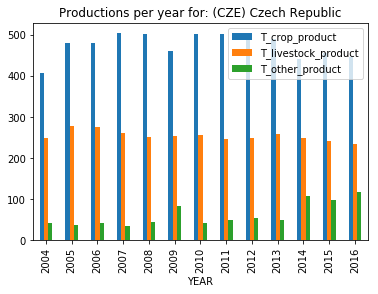

<Figure size 720x432 with 0 Axes>

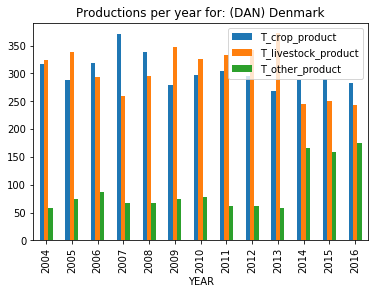

<Figure size 720x432 with 0 Axes>

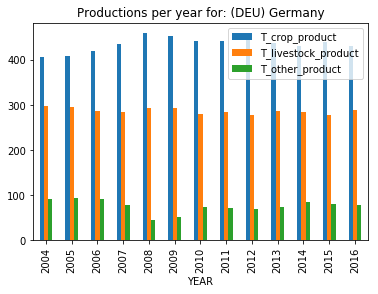

<Figure size 720x432 with 0 Axes>

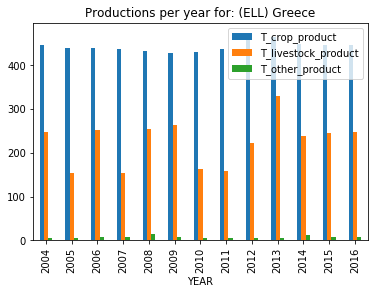

<Figure size 720x432 with 0 Axes>

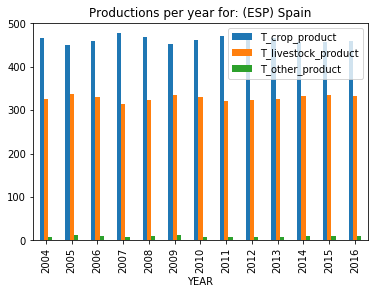

<Figure size 720x432 with 0 Axes>

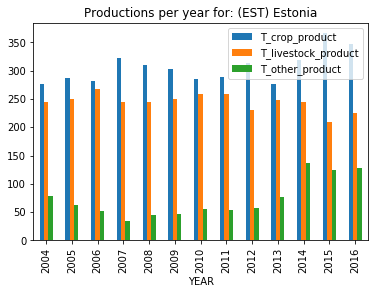

<Figure size 720x432 with 0 Axes>

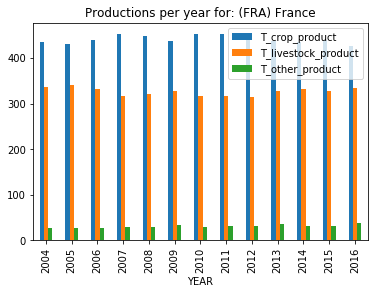

<Figure size 720x432 with 0 Axes>

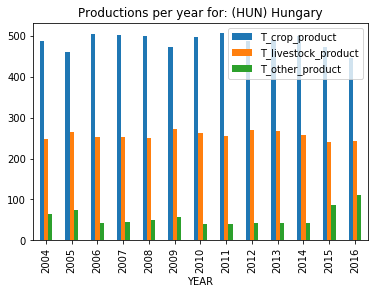

<Figure size 720x432 with 0 Axes>

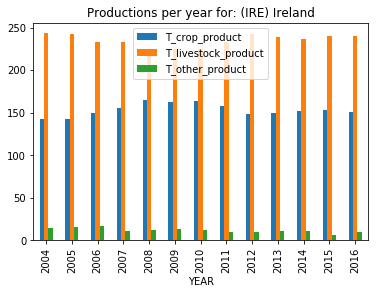

<Figure size 720x432 with 0 Axes>

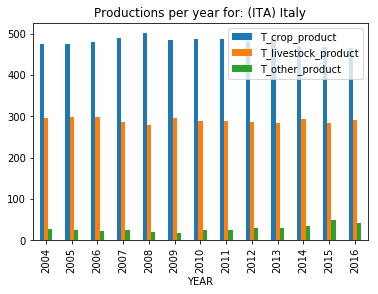

<Figure size 720x432 with 0 Axes>

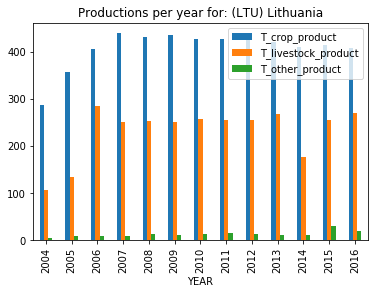

<Figure size 720x432 with 0 Axes>

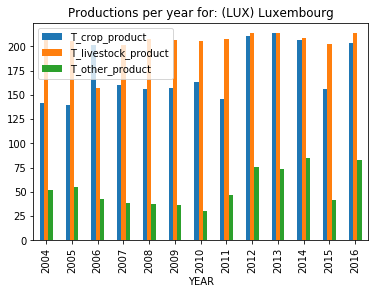

<Figure size 720x432 with 0 Axes>

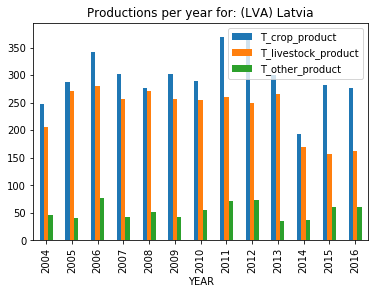

<Figure size 720x432 with 0 Axes>

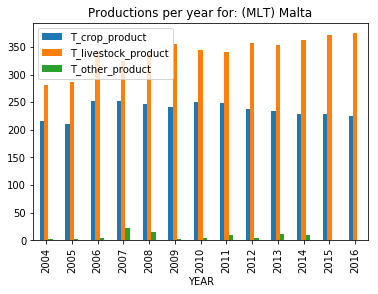

<Figure size 720x432 with 0 Axes>

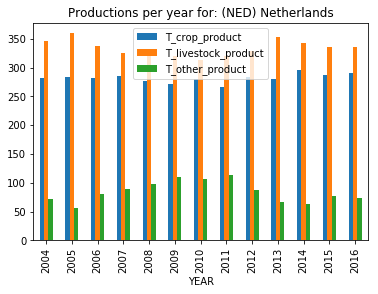

<Figure size 720x432 with 0 Axes>

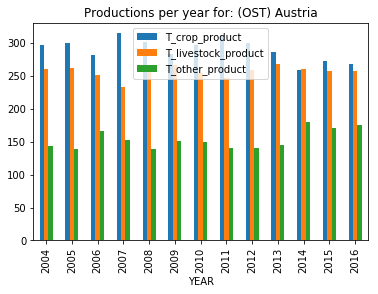

<Figure size 720x432 with 0 Axes>

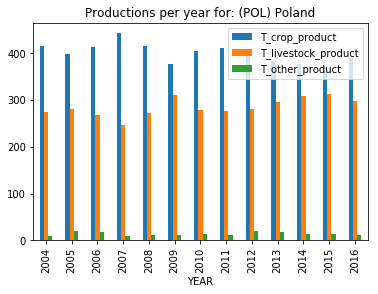

<Figure size 720x432 with 0 Axes>

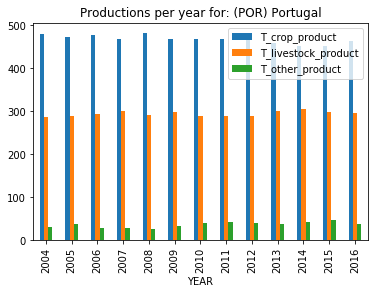

<Figure size 720x432 with 0 Axes>

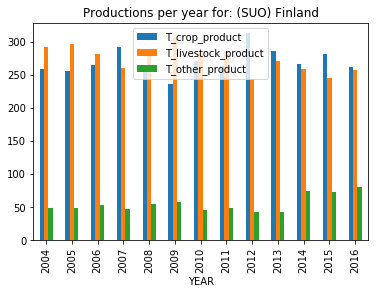

<Figure size 720x432 with 0 Axes>

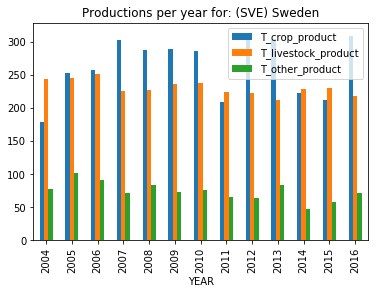

<Figure size 720x432 with 0 Axes>

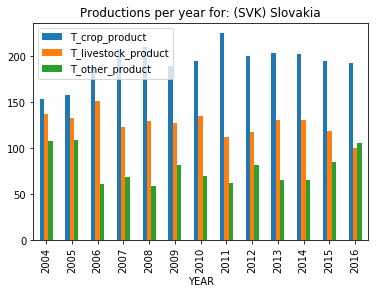

<Figure size 720x432 with 0 Axes>

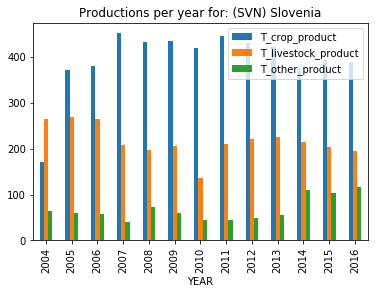

<Figure size 720x432 with 0 Axes>

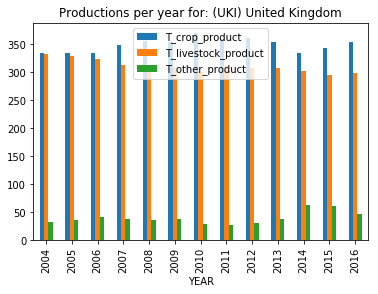

<Figure size 720x432 with 0 Axes>

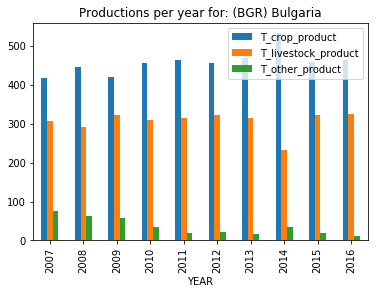

<Figure size 720x432 with 0 Axes>

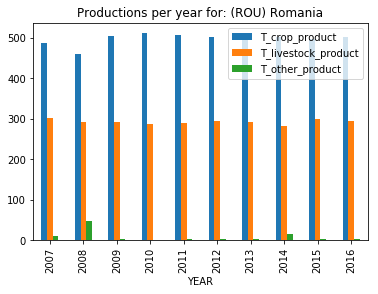

<Figure size 720x432 with 0 Axes>

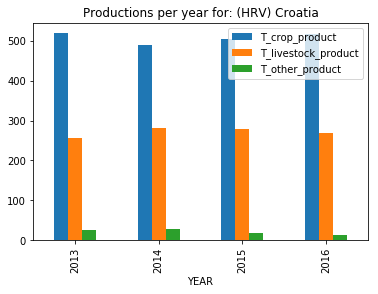

In [96]:
for country in production_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    production_data[production_data['COUNTRY']==country].groupby(['YEAR']).sum()[['T_crop_product','T_livestock_product', 'T_other_product']].plot.bar()
    plt.title("Productions per year for: "+country)

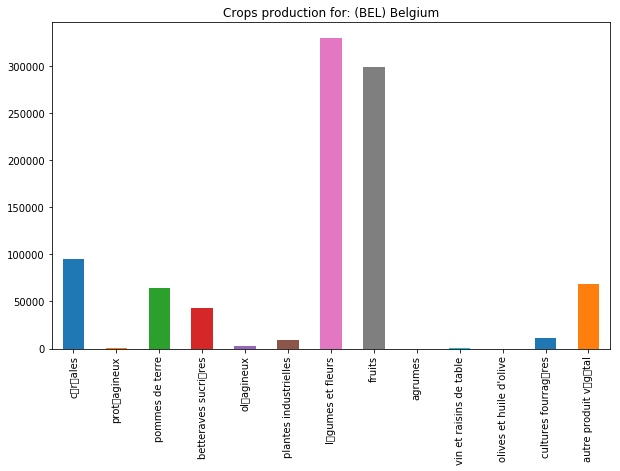

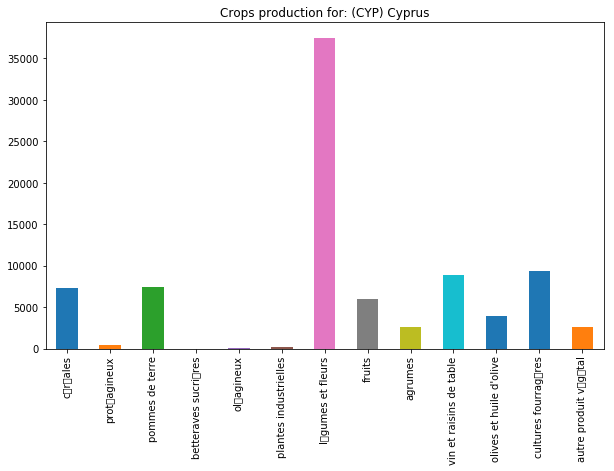

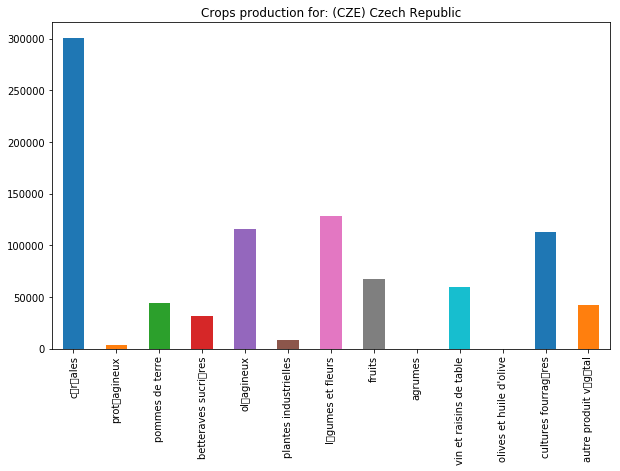

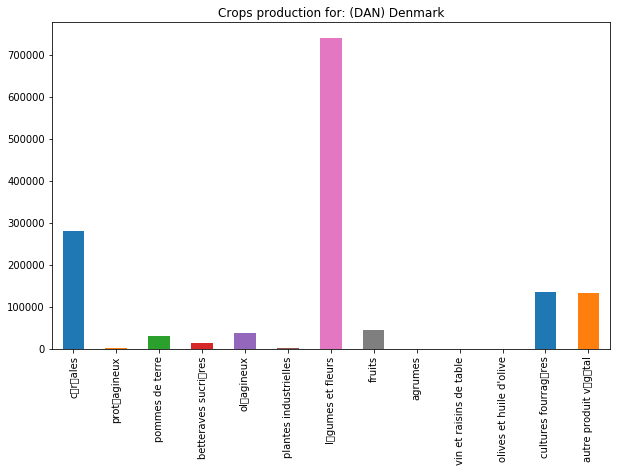

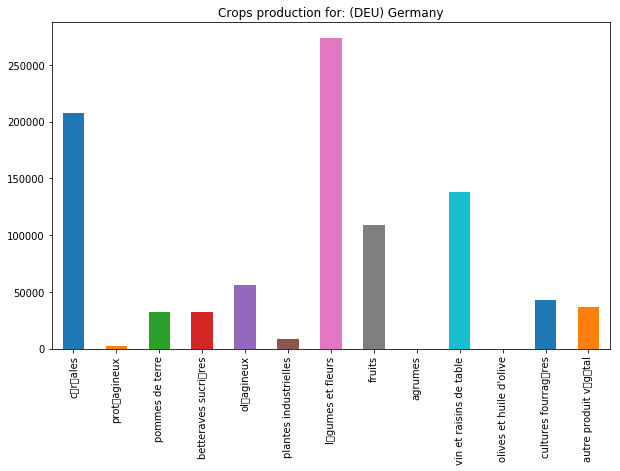

...

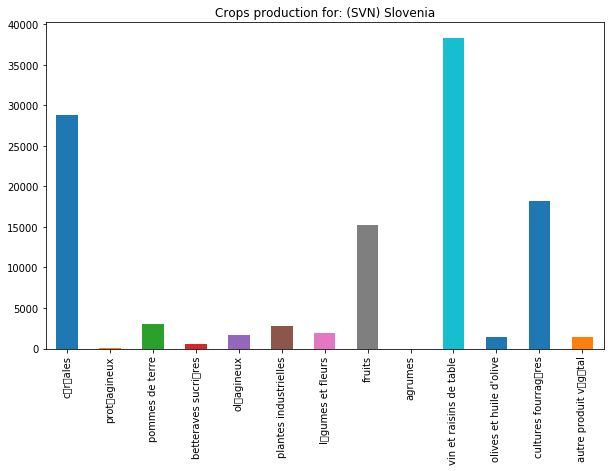

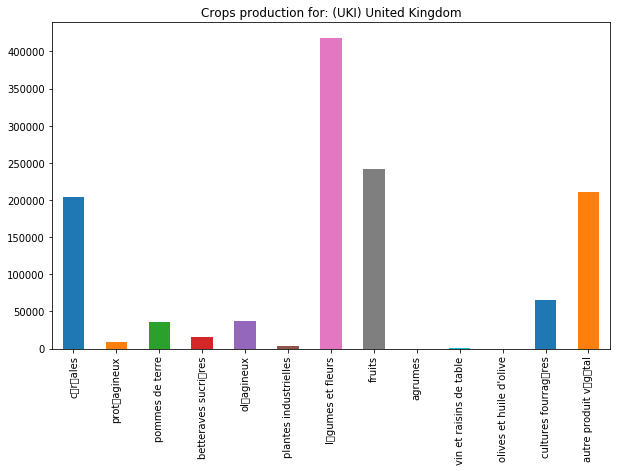

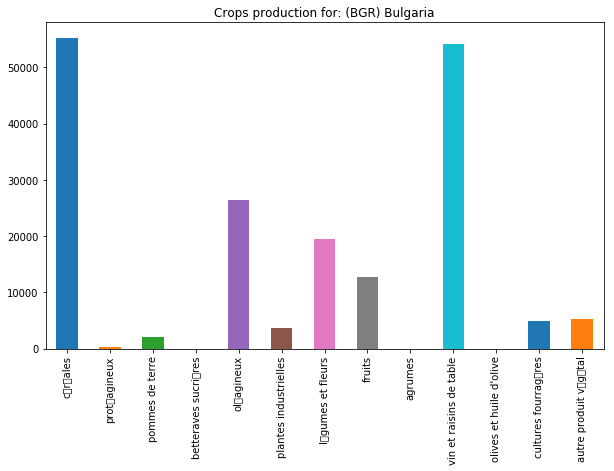

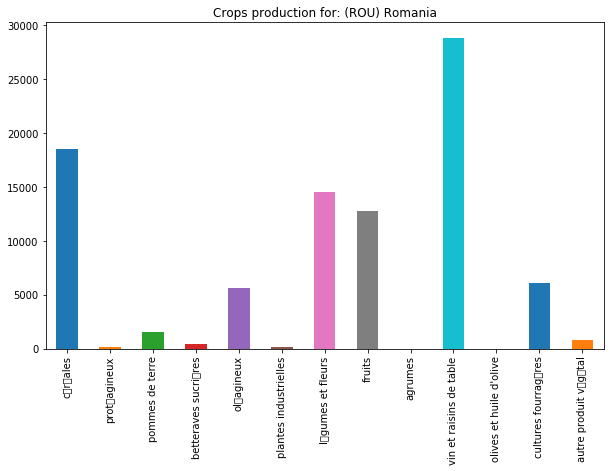

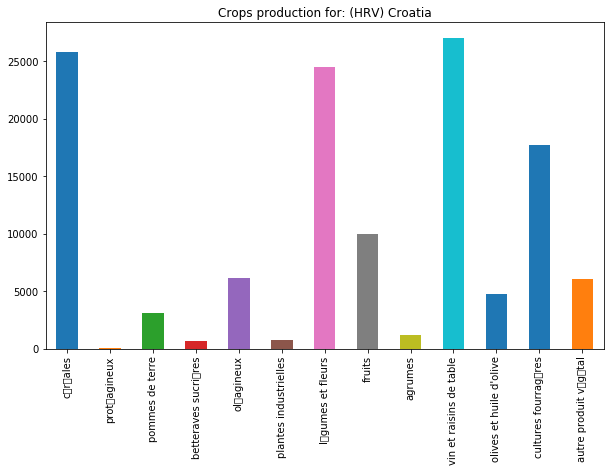

In [97]:
for country in production_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    product_cluster.loc[country][['SE140', 'SE145', 'SE150',
       'SE155', 'SE160', 'SE165', 'SE170', 'SE175', 'SE180', 'SE185', 'SE190',
       'SE195', 'SE200']].plot.bar()
    plt.xticks(np.arange(13), list(data_expl[['SE140', 'SE145', 'SE150',
       'SE155', 'SE160', 'SE165', 'SE170', 'SE175', 'SE180', 'SE185', 'SE190',
       'SE195', 'SE200']].values))
    plt.title('Crops production for: '+country)

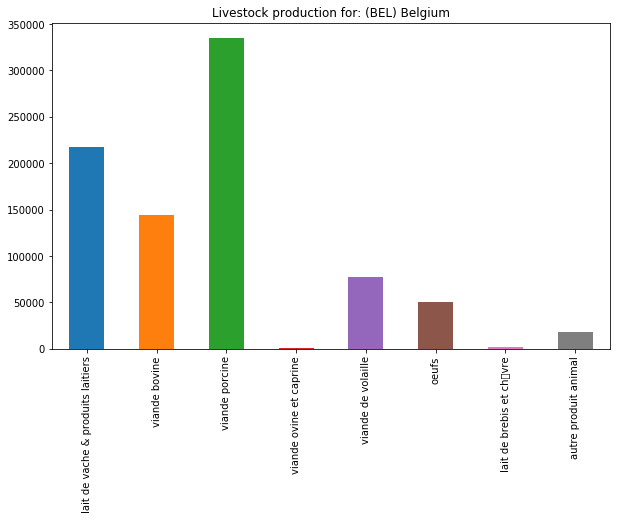

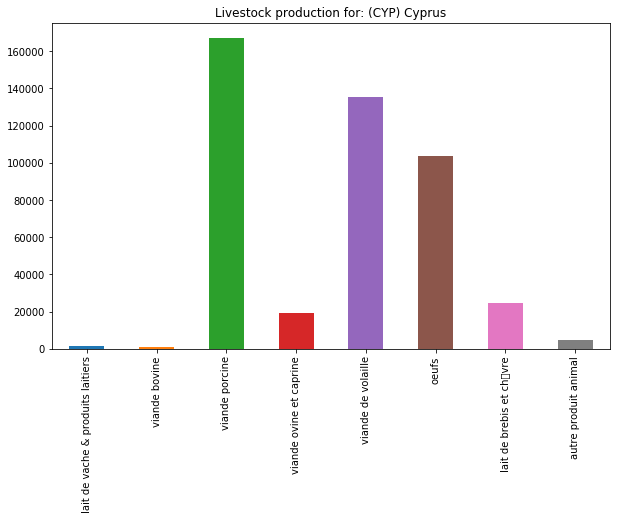

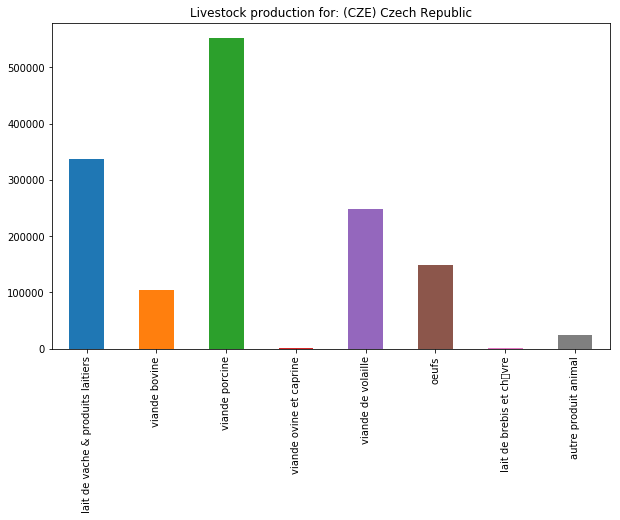

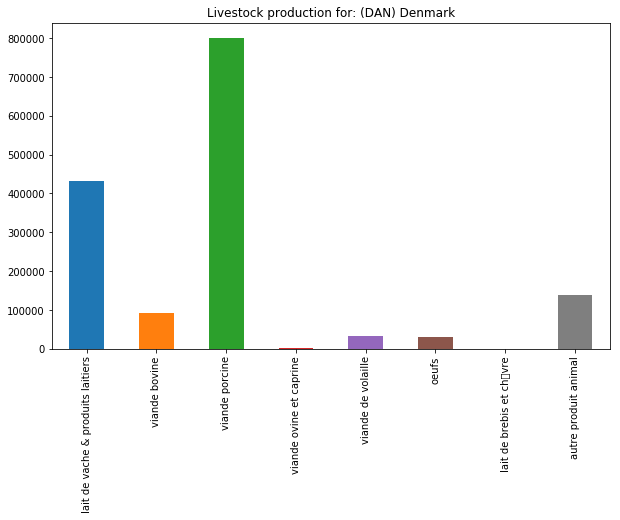

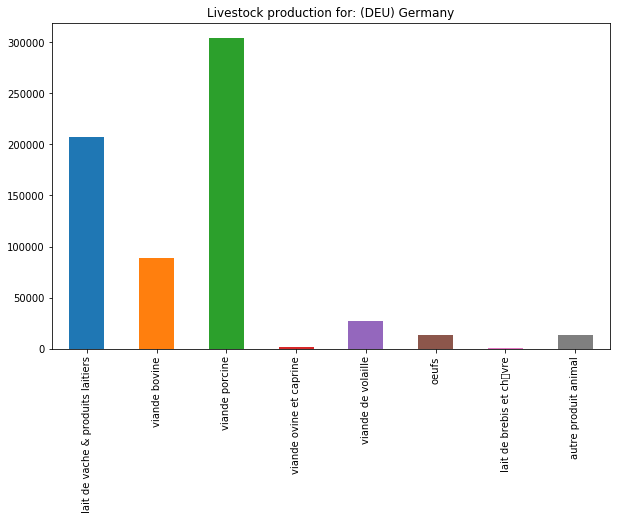

...

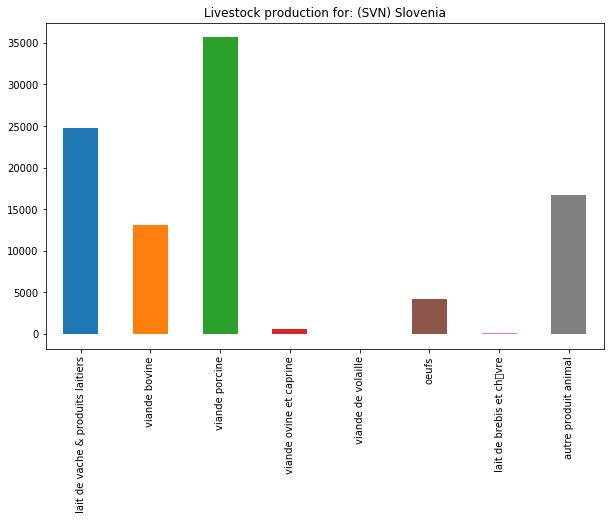

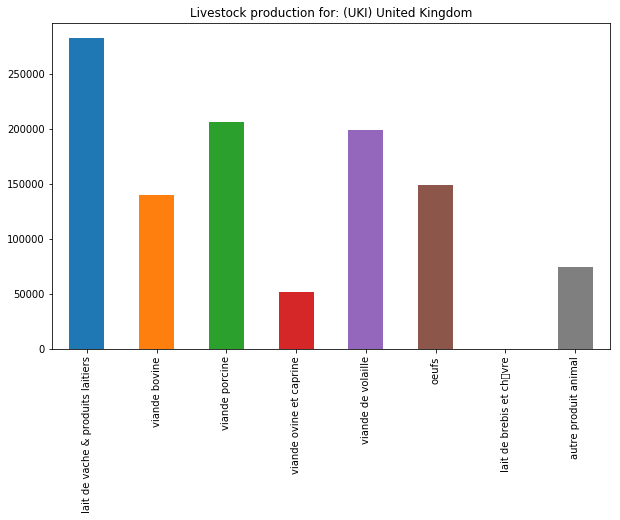

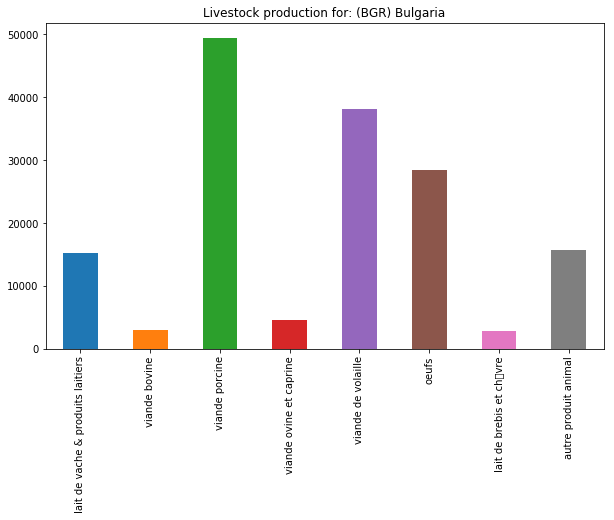

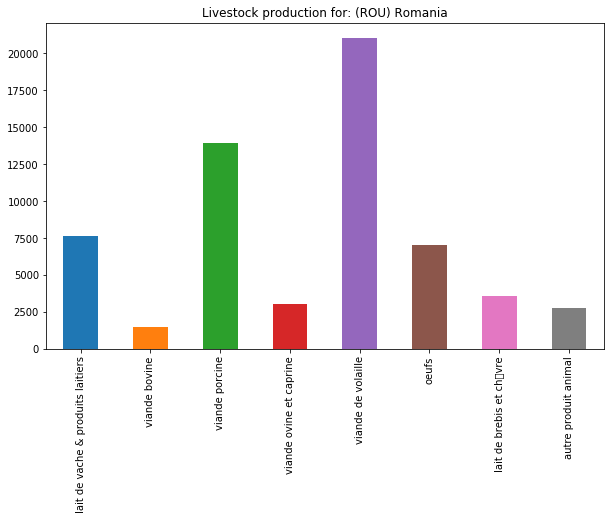

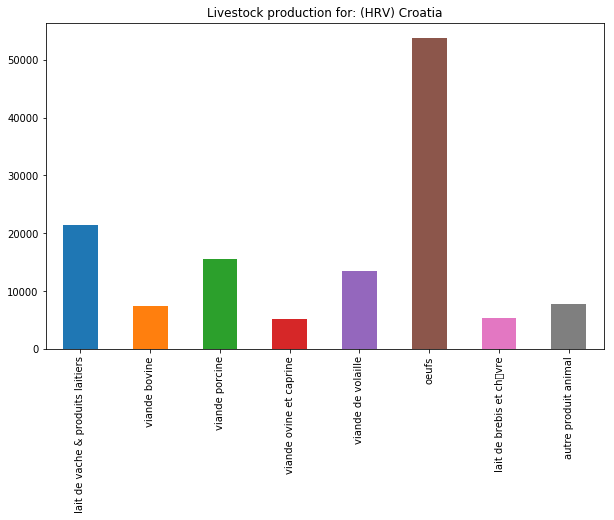

In [98]:
for country in production_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    product_cluster.loc[country][['SE216', 'SE220', 'SE225', 'SE230', 'SE235', 'SE240',
       'SE245', 'SE251']].plot.bar()
    plt.xticks(np.arange(8),list(data_expl[['SE216', 'SE220', 'SE225', 'SE230', 'SE235', 'SE240',
       'SE245', 'SE251']].values))
    plt.title('Livestock production for: '+country)

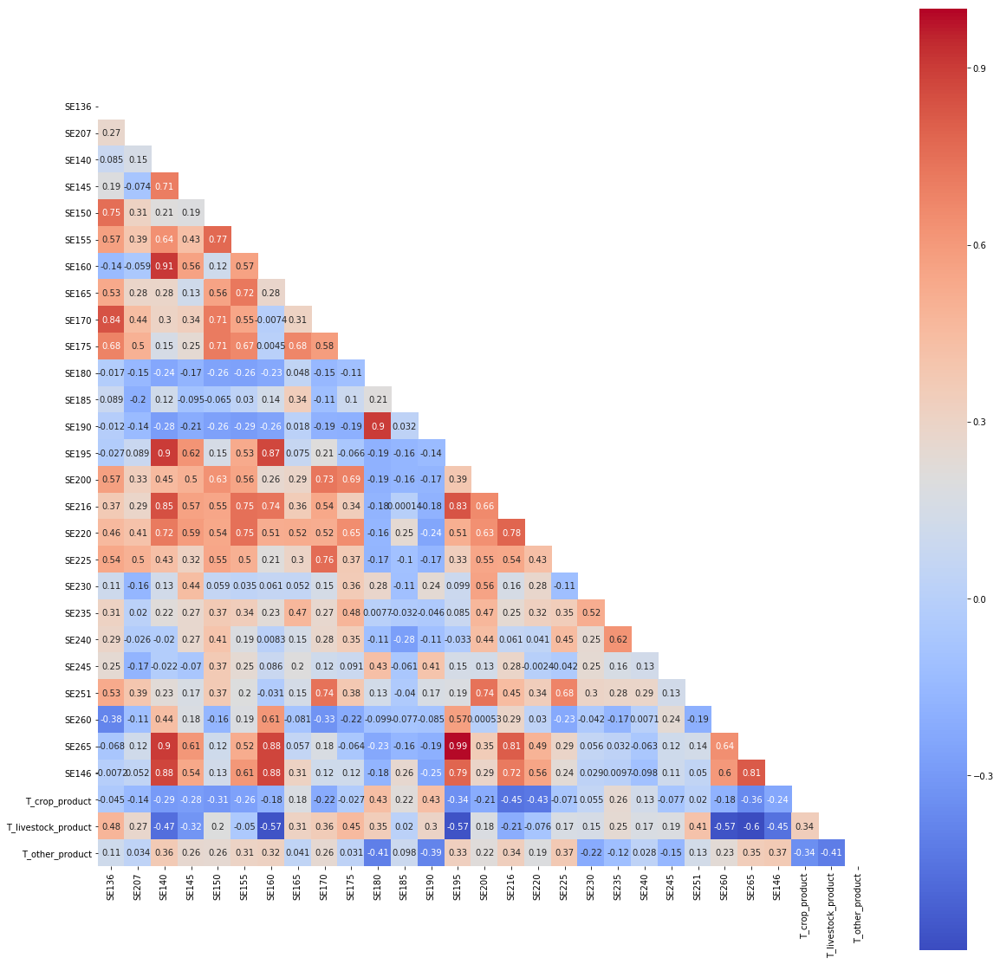

In [99]:
mask = np.zeros_like(product_cluster.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(20,20))
sns.heatmap(product_cluster.corr(), annot=True, mask=mask, square=True, cmap='coolwarm')

## Clustring of coutries according to production

### Scaling data

In [100]:
scaler=StandardScaler()
scaled_product_cluster_vals=scaler.fit_transform(product_cluster)

### PCA

In [101]:
var_cum, var_exp=var_pca(scaled_product_cluster_vals)

In [102]:
var_cum

array([0.32531887, 0.52179829, 0.61985671, 0.69135014, 0.75316261,
       0.8037994 , 0.84858864, 0.88793462, 0.91305448, 0.93231927,
       0.94903899, 0.96387281, 0.97394161, 0.98090316, 0.98700167,
       0.99098278, 0.99418134, 0.99682134, 0.99790481, 0.99879931,
       0.99918383, 0.99954902, 0.9997733 , 0.99994467, 0.99998218,
       0.9999921 , 1.        , 1.        , 1.        ])

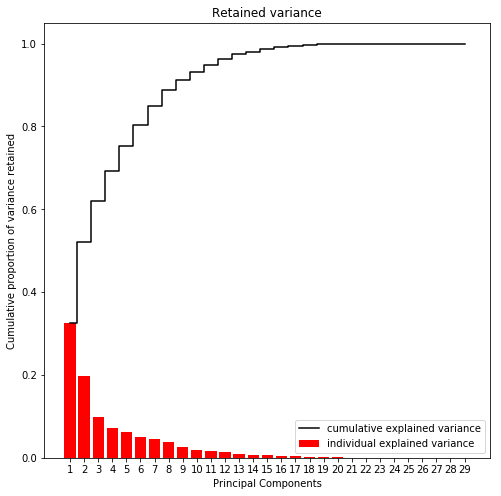

In [103]:
varCum_plot(var_cum)

#### We'll choose 13 components

In [104]:
pca_product=PCA(n_components=13)
pca_model_product=pca_product.fit_transform(scaled_product_cluster_vals)

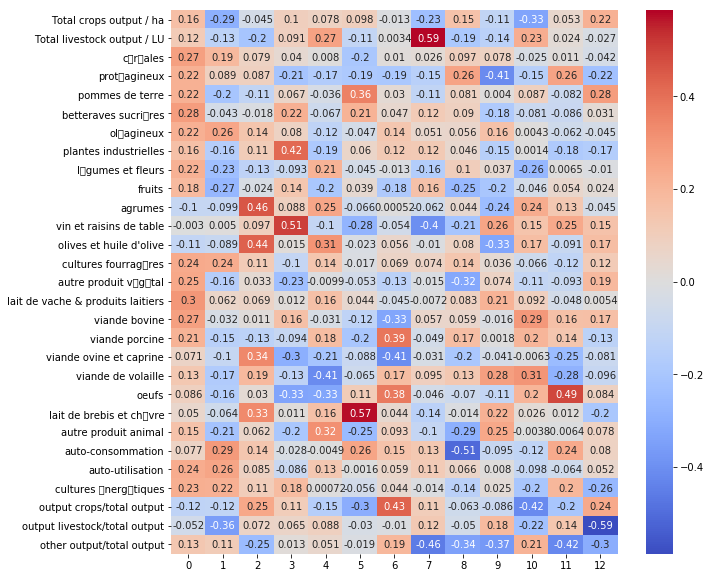

In [105]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.DataFrame(pca_product.components_, columns=data_expl[product_cluster.columns].values).T, annot=True, cmap='coolwarm')

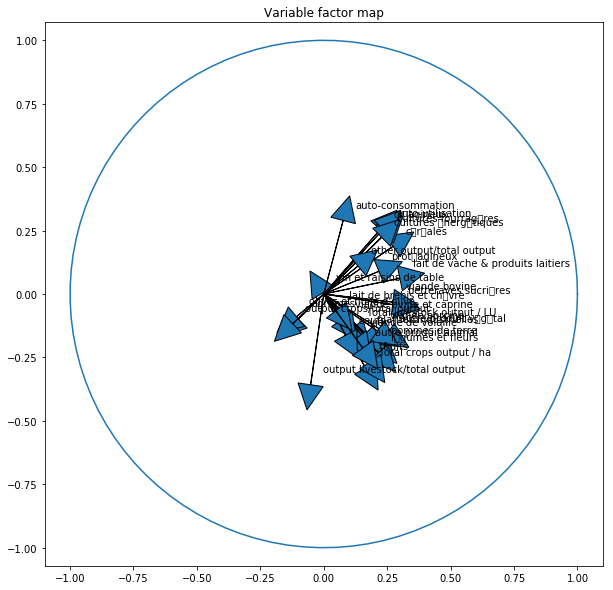

In [106]:
# Plot a variable factor map for the first two dimensions.
plot_factor_map(product_cluster, pca_product, data_expl)


In [107]:
kmeans_product=KMeans(n_clusters=3)
kmeans_product.fit(pca_model_product)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

[0.34213395 1.         2.         3.         4.         5.
 6.         7.         8.         9.        ]
[0.34213395 0.33789035 2.         3.         4.         5.
 6.         7.         8.         9.        ]
[0.34213395 0.33789035 0.23160761 3.         4.         5.
 6.         7.         8.         9.        ]
[0.34213395 0.33789035 0.23160761 0.13863614 4.         5.
 6.         7.         8.         9.        ]
[0.34213395 0.33789035 0.23160761 0.13863614 0.19473054 5.
 6.         7.         8.         9.        ]
[0.34213395 0.33789035 0.23160761 0.13863614 0.19473054 0.20488224
 6.         7.         8.         9.        ]
[0.34213395 0.33789035 0.23160761 0.13863614 0.19473054 0.20488224
 0.19886137 7.         8.         9.        ]
[0.34213395 0.33789035 0.23160761 0.13863614 0.19473054 0.20488224
 0.19886137 0.16747037 8.         9.        ]
[0.34213395 0.33789035 0.23160761 0.13863614 0.19473054 0.20488224
 0.19886137 0.16747037 0.16857244 9.        ]
[0.34213395 0.33789035 

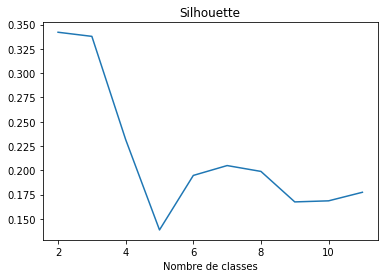

In [150]:
silhoutte(pca_model_product)

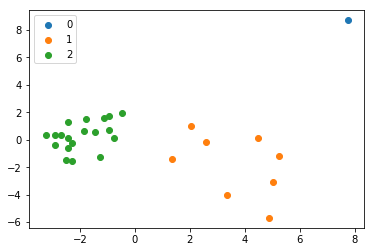

In [108]:
for i in range (3):
    plt.scatter(pca_model_product[np.where(kmeans_product.labels_==i)[0],0], pca_model_product[np.where(kmeans_product.labels_==i)[0],1], label=i)
    plt.legend()

In [109]:
df_product=pd.DataFrame(np.hstack((pca_model_product,kmeans_product.labels_.reshape(1,-1).T)), columns=[1,2,3,4,5,6,7,8,9,10,11,12,13,'labels'], index=product_cluster.index)
df_product.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,labels
COUNTRY,,,,,,,,,,,,,,
(BEL) Belgium,3.362833,-4.041775,-2.023855,2.514941,0.090615,0.669974,-0.807369,3.813753,-0.276304,-1.209064,0.584443,0.114467,0.143244,1.0
(BGR) Bulgaria,-2.455124,0.155701,-0.334265,0.632963,-0.722671,-0.367777,0.388069,0.342015,-0.402614,0.688438,-0.704974,-0.413099,-0.315845,2.0
(CYP) Cyprus,-2.442584,-0.568824,1.676098,-1.485346,-0.895383,1.131526,0.600183,0.128825,0.042139,0.452978,0.847577,-0.198037,-0.083757,2.0
(CZE) Czech Republic,4.479487,0.097368,0.871923,0.716808,-2.700852,-1.100167,2.884307,0.416071,1.591843,0.753325,1.347823,-0.606411,0.044925,1.0
(DAN) Denmark,5.228400,-1.201594,-2.027838,-1.706890,4.345580,-2.505698,0.976325,0.460433,-0.640110,1.264312,0.083041,-0.237765,-0.232653,1.0


In [110]:
df_product[df_product['labels']==0].index

Index(['(SVK) Slovakia'], dtype='object', name='COUNTRY')

In [111]:
df_product[df_product['labels']==1].index

Index(['(BEL) Belgium', '(CZE) Czech Republic', '(DAN) Denmark',
       '(DEU) Germany', '(FRA) France', '(NED) Netherlands', '(SVE) Sweden',
       '(UKI) United Kingdom'],
      dtype='object', name='COUNTRY')

In [112]:
df_product[df_product['labels']==2].index

Index(['(BGR) Bulgaria', '(CYP) Cyprus', '(ELL) Greece', '(ESP) Spain',
       '(EST) Estonia', '(HRV) Croatia', '(HUN) Hungary', '(IRE) Ireland',
       '(ITA) Italy', '(LTU) Lithuania', '(LUX) Luxembourg', '(LVA) Latvia',
       '(MLT) Malta', '(OST) Austria', '(POL) Poland', '(POR) Portugal',
       '(ROU) Romania', '(SUO) Finland', '(SVN) Slovenia'],
      dtype='object', name='COUNTRY')

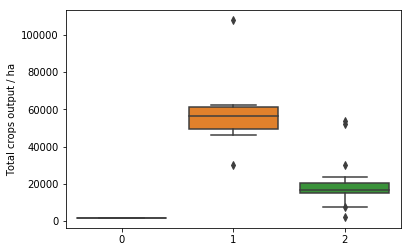

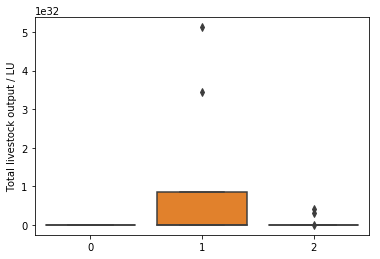

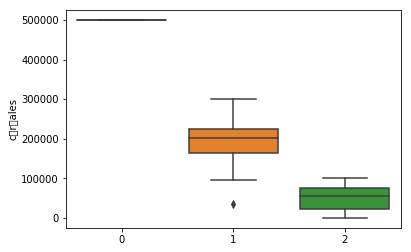

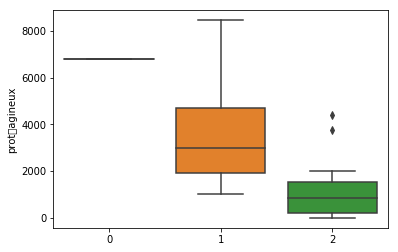

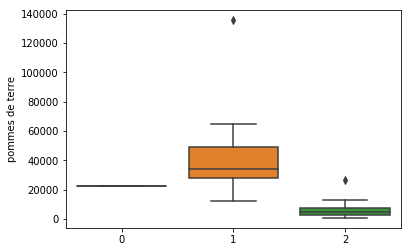

...

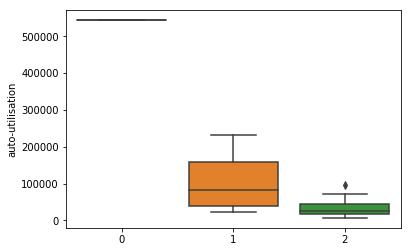

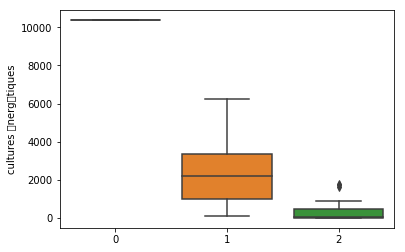

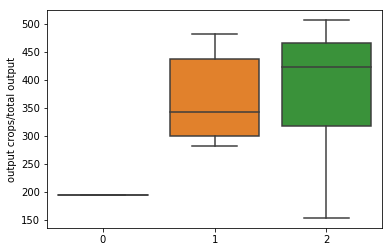

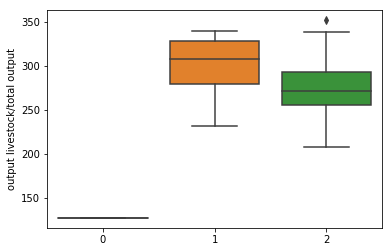

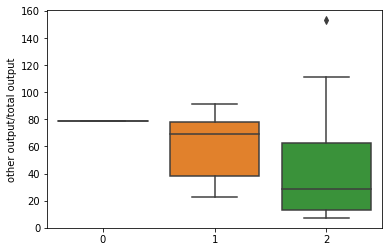

In [113]:
for feat in product_cluster.columns:
    plt.figure()
    sns.boxplot(x=kmeans_product.labels_,y=product_cluster[feat])
    plt.ylabel(data_expl[feat])

# zoom on resources

In [114]:
resources_columns=['SE005', 'SE025', 'SE010','SE030', 'SE035', 'SE041', 'SE046', 'SE050', 'SE054', 'SE071','SE074', 'SE080','SE085','SE090','SE095', 'SE100', 'SE105', 'SE110','SE115','SE125']

In [115]:
data_expl[resources_columns]

code
SE005                       Dimension conomique
SE025         Total Superficie Agricole Utilise
SE010                        Total main d'oeuvre
SE030                             SAU en fermage
SE035                                   crales
SE041             autres cultures de plein champ
SE046                          fleurs et lgumes
SE050                                     vignes
SE054                       cultures permanentes
SE071                       cultures fourragres
SE074    Surface agricole totale hors production
SE080                              Total cheptel
SE085                           vaches laitires
SE090                              autres bovins
SE095                           ovins et caprins
SE100                                      porcs
SE105                                  volailles
SE110                              Rendement bl
SE115                             Rendement mas
SE125                          Rendement laitier
Name: Explicati

In [116]:
resources_data=new_data[['YEAR', 'COUNTRY', 'TF8']+resources_columns]

In [117]:
resources_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2332 entries, 0 to 2573
Data columns (total 23 columns):
YEAR       2332 non-null int64
COUNTRY    2332 non-null object
TF8        2332 non-null object
SE005      2332 non-null float64
SE025      2332 non-null float64
SE010      2332 non-null float64
SE030      2332 non-null float64
SE035      2332 non-null float64
SE041      2332 non-null float64
SE046      2332 non-null float64
SE050      2332 non-null float64
SE054      2332 non-null float64
SE071      2332 non-null float64
SE074      2332 non-null float64
SE080      2332 non-null float64
SE085      2332 non-null float64
SE090      2332 non-null float64
SE095      2332 non-null float64
SE100      2332 non-null float64
SE105      2332 non-null float64
SE110      2153 non-null float64
SE115      1569 non-null float64
SE125      1618 non-null float64
dtypes: float64(20), int64(1), object(2)
memory usage: 437.2+ KB


In [118]:
resources_data.isnull().sum()[['SE125', 'SE110']]

SE125    714
SE110    179
dtype: int64

In [119]:
new_data.isnull().sum()[['SE125D','SE125N']]

SE125D    0
SE125N    0
dtype: int64

In [120]:
new_data.isnull().sum()[['SE110D','SE110N']]

SE110D    0
SE110N    0
dtype: int64

In [121]:
resources_data['SE125'].fillna(new_data['SE125N']/(new_data['SE125D']+10**-30), inplace=True)
resources_data['SE110'].fillna(new_data['SE110N']/(new_data['SE110D']+10**-30), inplace=True)

In [122]:
resources_data.isnull().sum()[['SE125', 'SE110']]

SE125    0
SE110    0
dtype: int64

In [123]:
resources_cluster=(resources_data.drop('YEAR', axis=1).groupby(['COUNTRY', 'TF8']).mean()).groupby(level=[0]).sum()
resources_cluster.head()

,SE005,SE025,SE010,SE030,SE035,SE041,SE046,SE050,SE054,SE071,SE074,SE080,SE085,SE090,SE095,SE100,SE105,SE110,SE115,SE125
COUNTRY,,,,,,,,,,,,,,,,,,,,
(BEL) Belgium,1941.992308,278.242308,18.135385,201.463846,71.777692,38.684615,10.065385,0.000000,17.744615,133.046154,2.380000,815.606154,100.374615,207.009231,1.904615,412.661538,92.051538,575.876367,842.627575,38733.247352
(BGR) Bulgaria,286.190000,204.628000,24.188000,167.799000,93.397000,46.648000,1.470000,24.956000,8.848000,22.001000,7.013000,158.031000,16.211000,8.653000,10.691000,54.954000,66.954000,279.493742,424.485555,19155.475763
(CYP) Cyprus,678.036480,54.651760,13.704668,37.461964,21.641509,1.767500,2.400460,3.674639,4.769248,15.667331,4.553357,556.874744,0.465385,0.975385,25.797885,338.315385,191.315577,33.901137,140.374746,2249.250378
(CZE) Czech Republic,2204.803846,1115.198974,52.370449,926.663333,421.320577,158.651987,8.929744,11.016923,22.498205,486.868077,5.809679,1313.877628,171.881538,221.252115,4.064679,598.296667,316.106923,408.277579,577.518677,27187.596631
(DAN) Denmark,2820.100000,556.802308,17.790000,160.321538,291.000000,59.733077,9.563846,0.000000,18.303846,152.533077,25.966923,1126.848462,142.662308,143.239231,3.018462,783.751538,49.606154,488.957379,474.868597,32122.803336


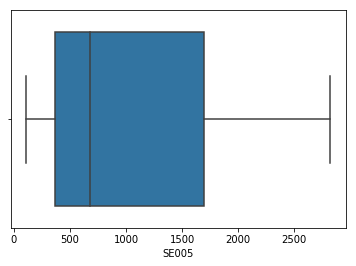

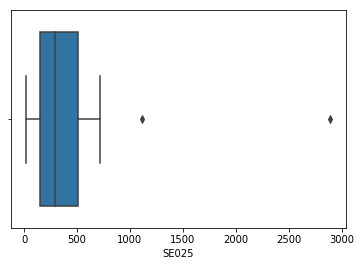

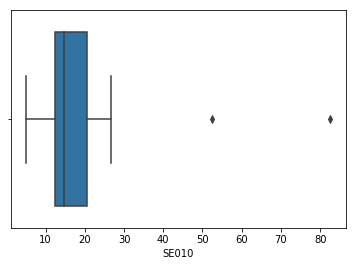

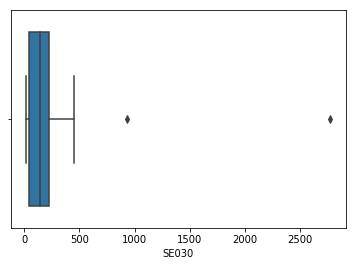

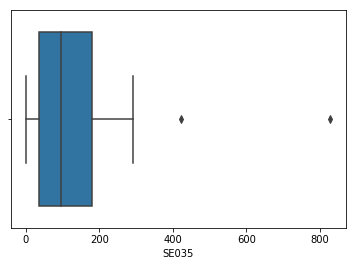

...

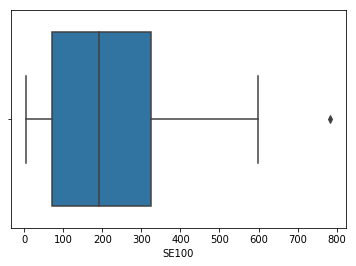

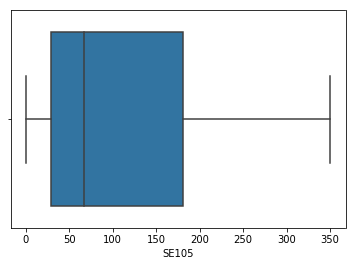

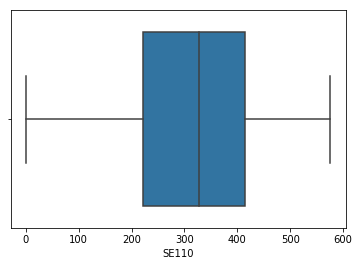

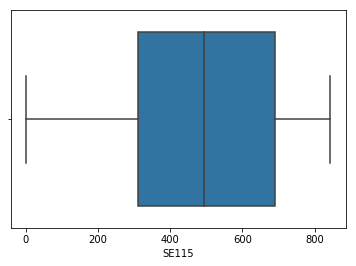

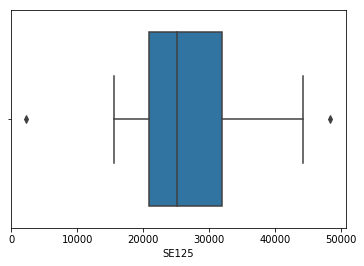

In [124]:
for feat in resources_cluster.columns:
    plt.figure()
    sns.boxplot(resources_cluster[feat])

In [125]:
resources_cluster.describe()

,SE005,SE025,SE010,SE030,SE035,SE041,SE046,SE050,SE054,SE071,SE074,SE080,SE085,SE090,SE095,SE100,SE105,SE110,SE115,SE125
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,1002.814145,409.745383,19.444983,268.839001,140.866000,43.565025,4.321657,5.365552,10.921665,186.775971,15.012761,519.522954,68.585971,97.360726,17.281441,230.394324,103.773980,324.579508,457.016709,26558.746604
std,808.832895,545.263617,15.090284,525.355113,166.759997,62.323060,3.681585,6.546108,8.028257,312.810145,16.281562,349.221978,70.878335,94.159577,24.482950,196.162181,96.850493,154.373180,276.219555,10014.804993
min,108.270000,17.471818,4.984615,14.776993,0.000000,1.119720,0.076923,0.000000,0.226923,11.229301,0.364551,58.377000,0.465385,0.975385,0.836154,4.246154,0.396154,0.000000,0.000000,2249.250378
25%,362.967512,147.119423,12.499728,46.814952,35.462000,9.695962,1.477500,0.000577,4.611686,37.440785,3.174327,216.840385,21.765385,29.481652,3.502885,70.902933,29.610385,221.429674,310.987642,20920.421115
50%,682.177855,295.279615,14.688365,141.351923,94.402731,28.753558,2.818462,3.461442,9.496692,116.470000,6.479577,517.288431,51.582692,59.706923,7.903385,191.166923,67.132385,327.967986,493.675022,25193.126354
75%,1695.240385,505.760192,20.468846,222.806538,180.728654,55.102030,6.104231,8.834635,16.932054,183.055529,24.600897,719.833269,85.661538,144.223077,18.539231,324.169231,181.387950,415.416755,689.402006,31891.243534
max,2820.100000,2893.642308,82.587692,2773.126154,828.240769,314.323077,14.273077,24.956000,27.051538,1674.131538,54.817692,1313.877628,352.930769,396.510769,106.190769,783.751538,350.120769,575.876367,843.413161,48349.072204


Text(0.5,1,'crops area per country')

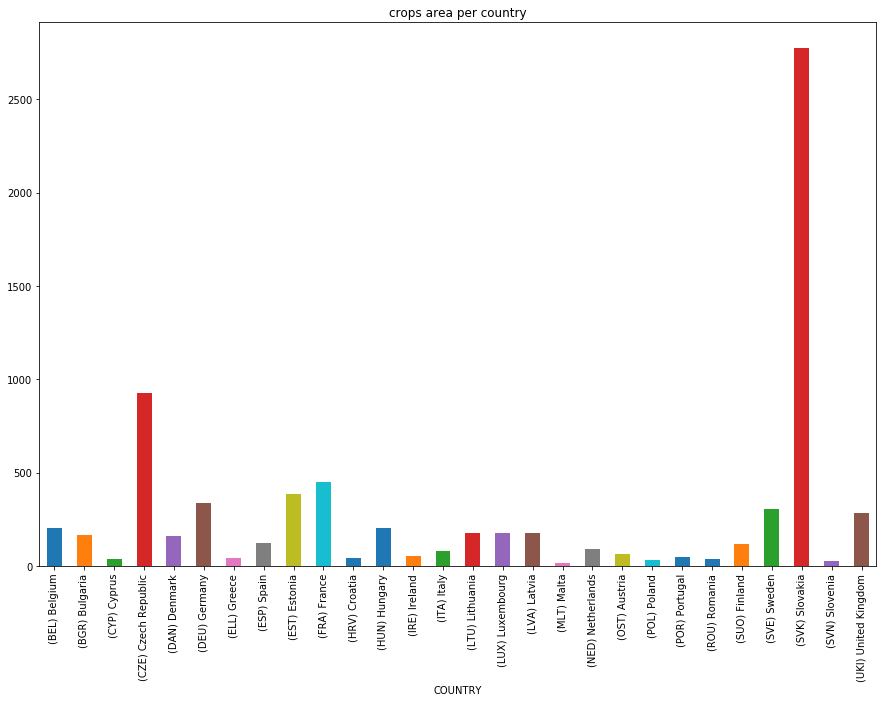

In [126]:
plt.figure(figsize=(15,10))
resources_cluster['SE030'].plot.bar()
plt.title('crops area per country')

Text(0.5,1,'Total livestock unit per country')

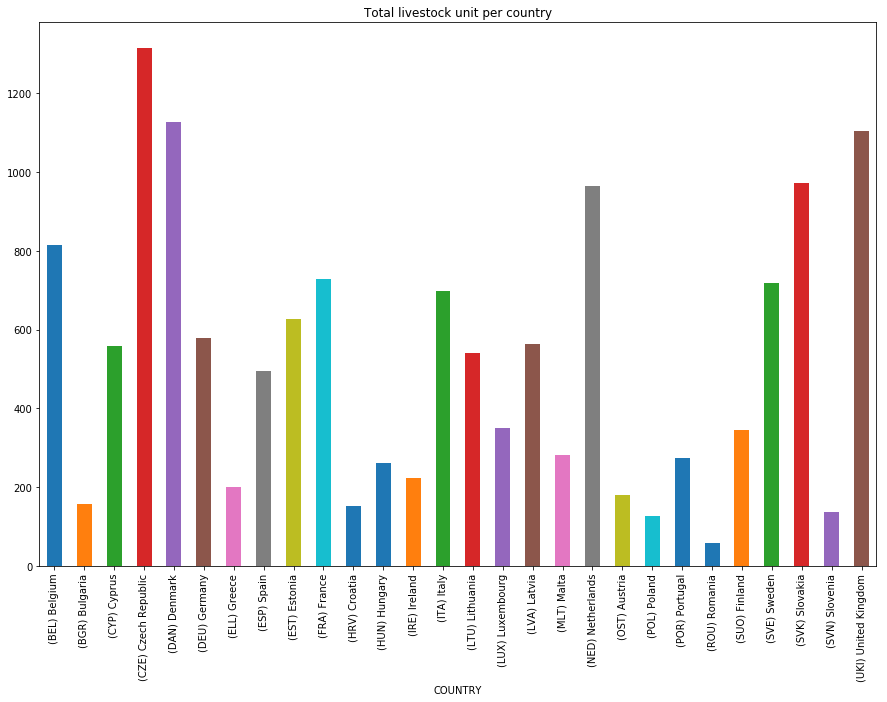

In [127]:
plt.figure(figsize=(15,10))
resources_cluster['SE080'].plot.bar()
plt.title('Total livestock unit per country')

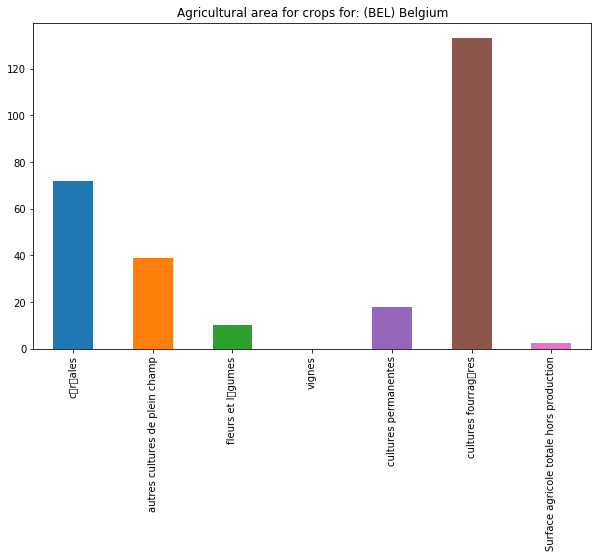

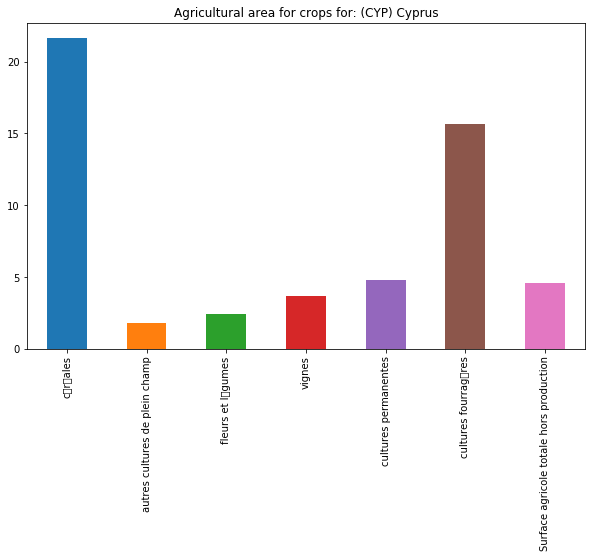

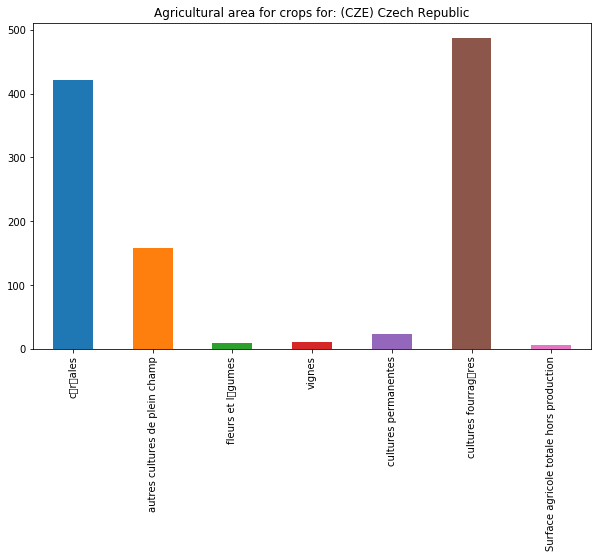

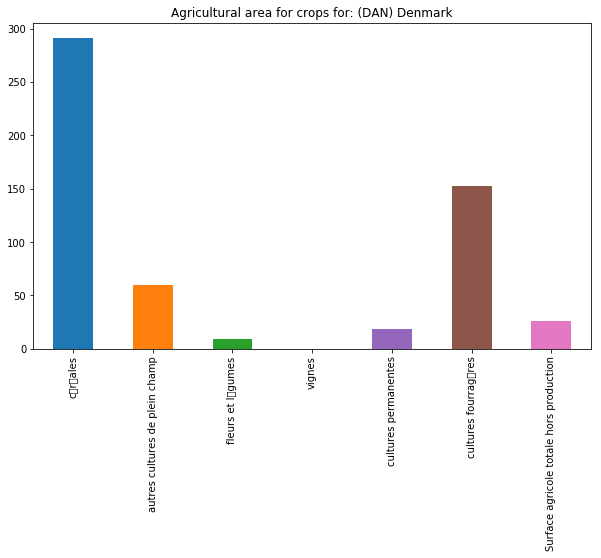

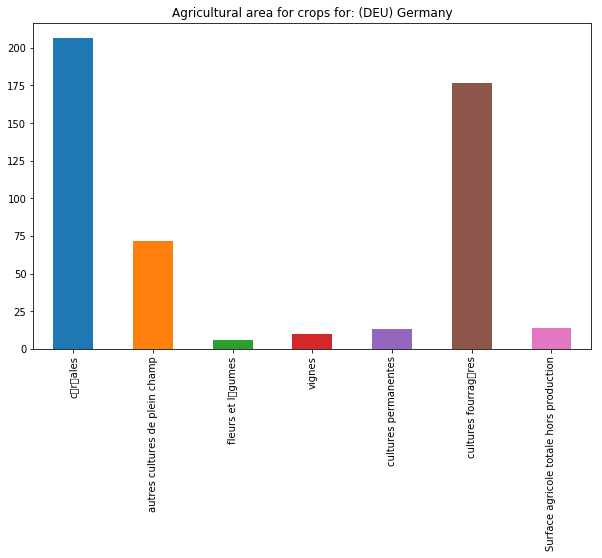

...

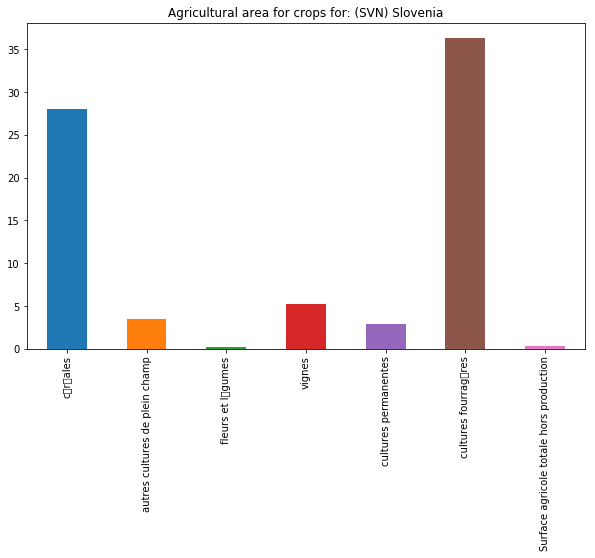

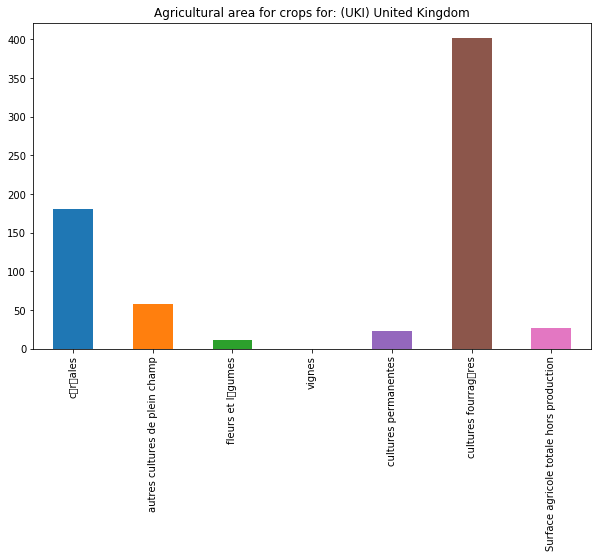

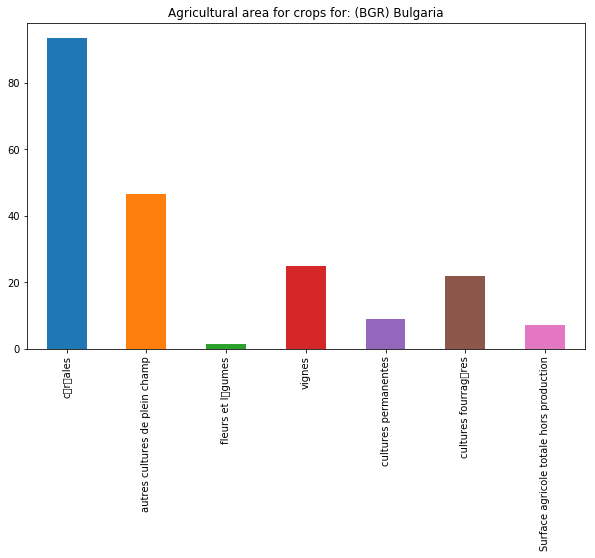

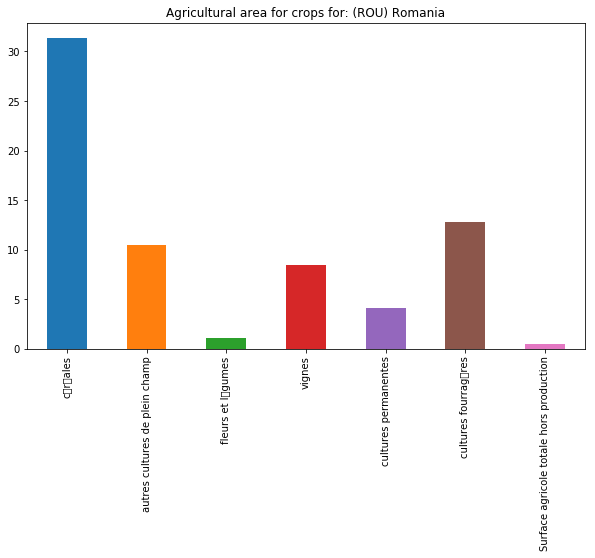

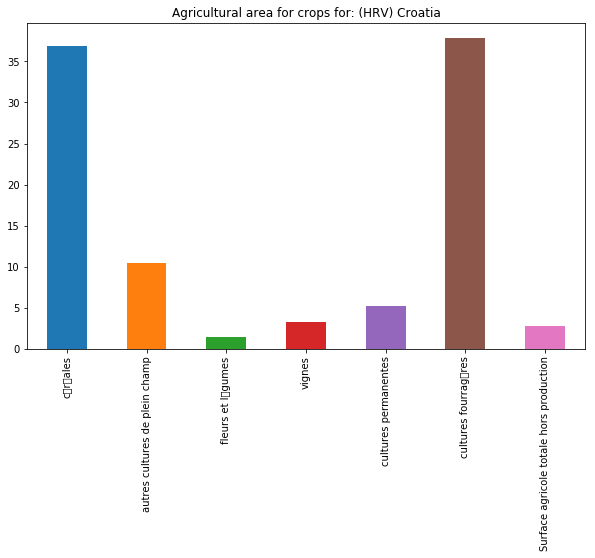

In [128]:
for country in resources_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    resources_cluster.loc[country][['SE035', 'SE041', 'SE046', 'SE050', 'SE054', 'SE071','SE074']].plot.bar()
    plt.xticks(np.arange(7), list(data_expl[['SE035', 'SE041', 'SE046', 'SE050', 'SE054', 'SE071','SE074']].values))
    plt.title('Agricultural area for crops for: '+country)

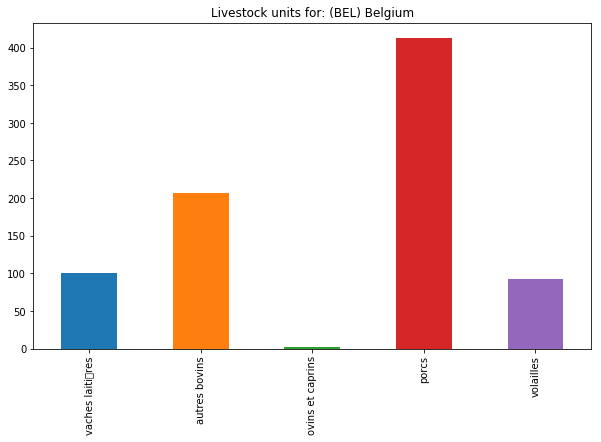

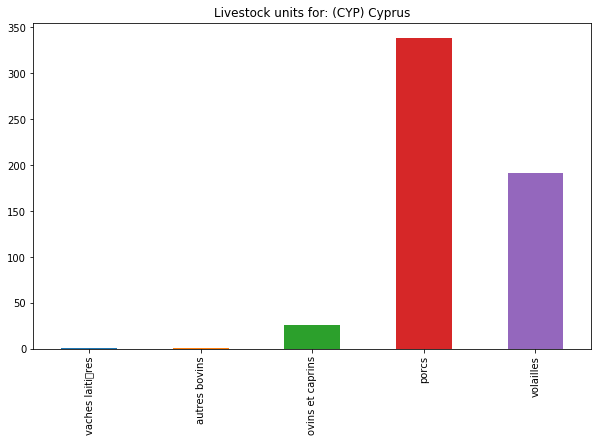

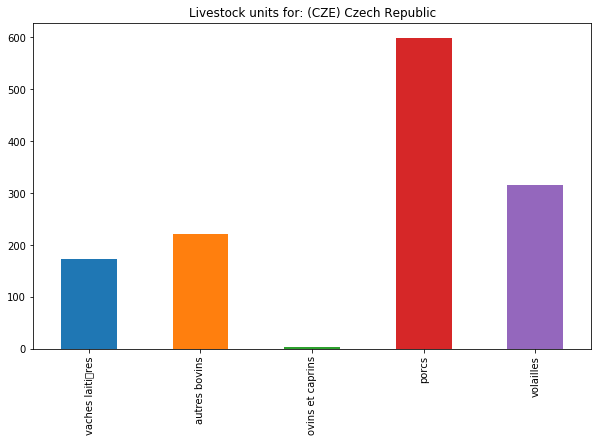

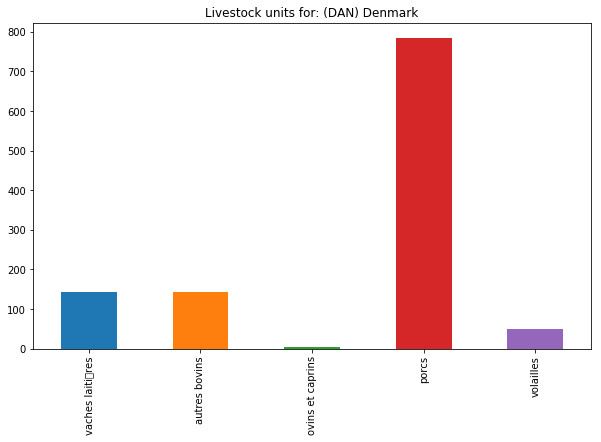

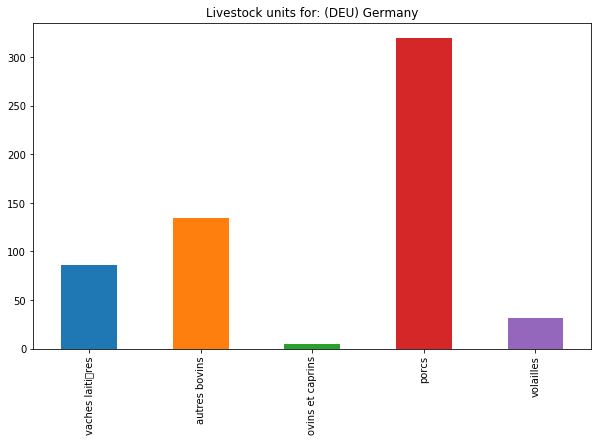

...

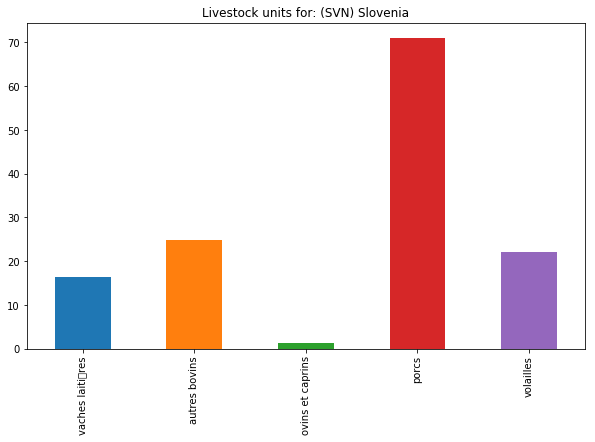

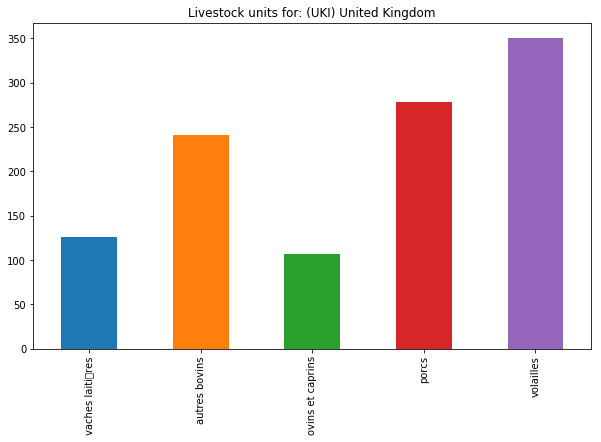

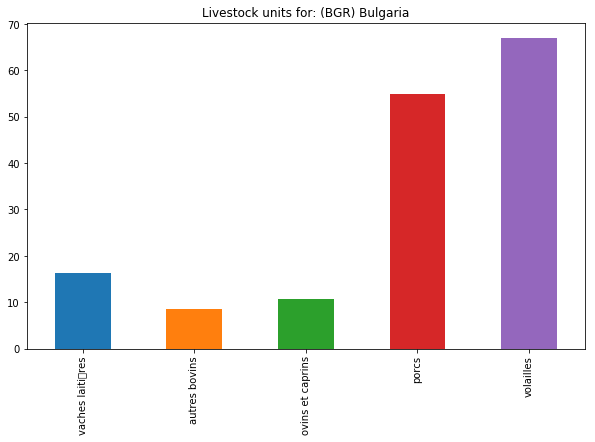

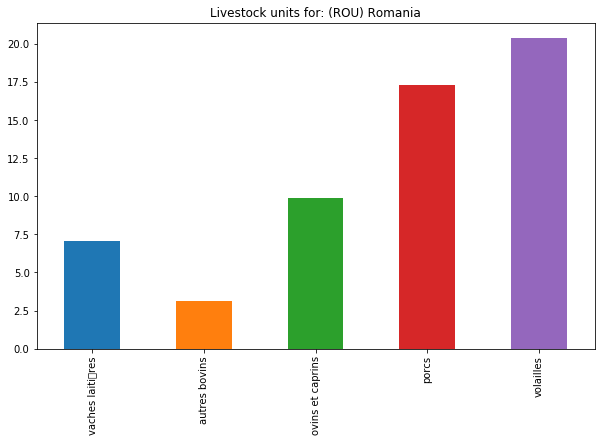

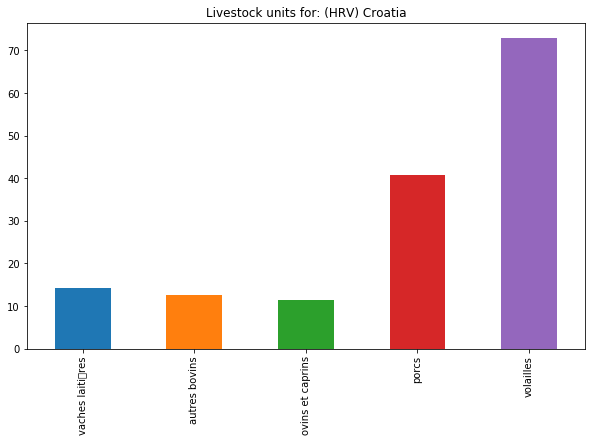

In [129]:
for country in resources_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    resources_cluster.loc[country][['SE085','SE090','SE095', 'SE100', 'SE105']].plot.bar()
    plt.xticks(np.arange(5), list(data_expl[['SE085','SE090','SE095', 'SE100', 'SE105']].values))
    plt.title('Livestock units for: '+country)

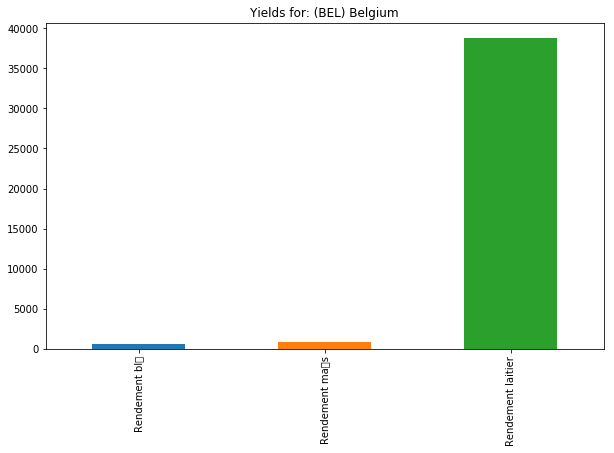

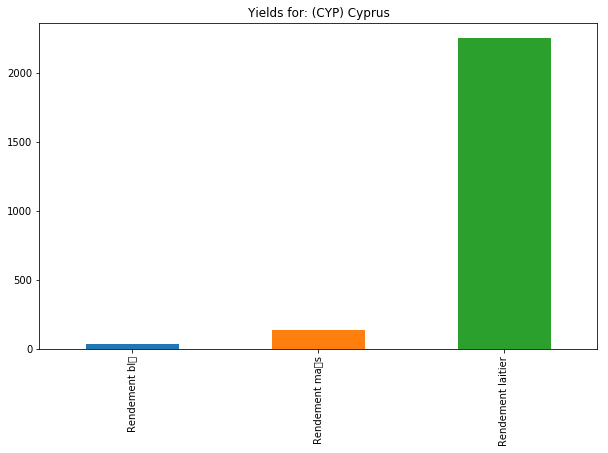

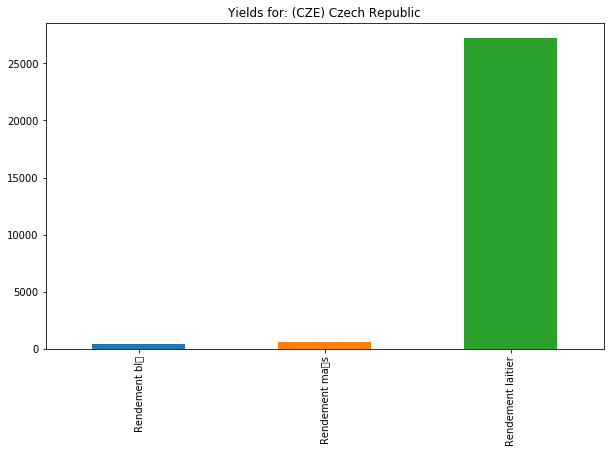

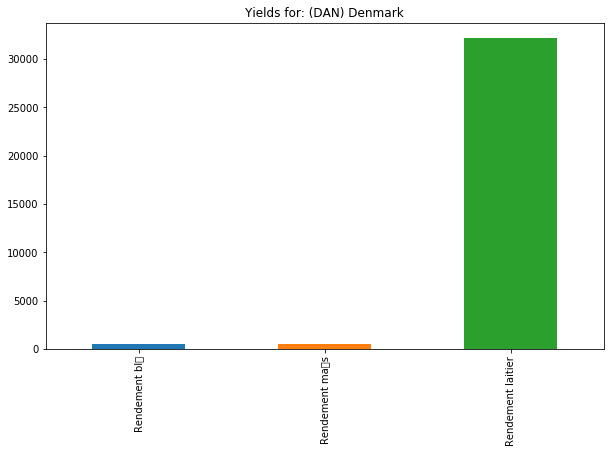

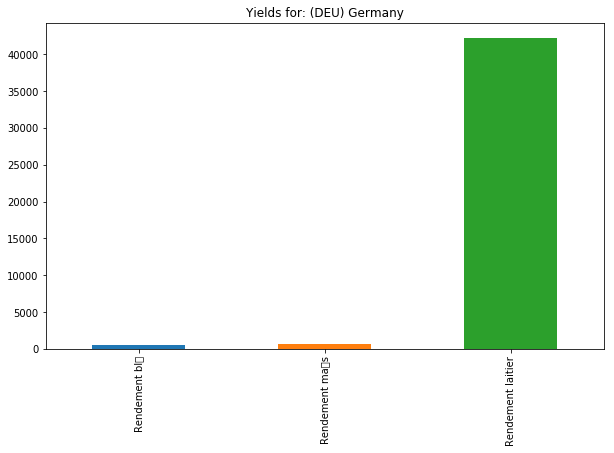

...

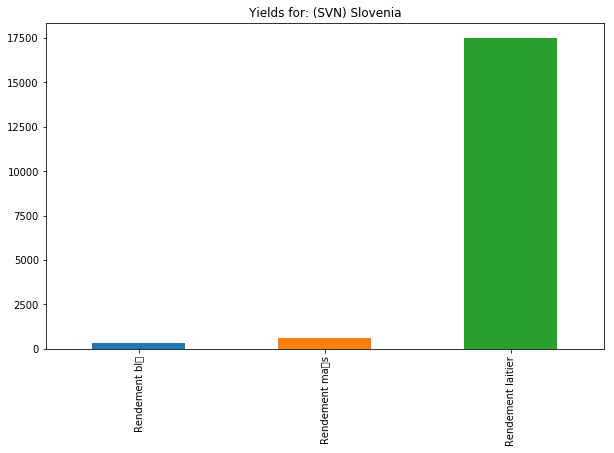

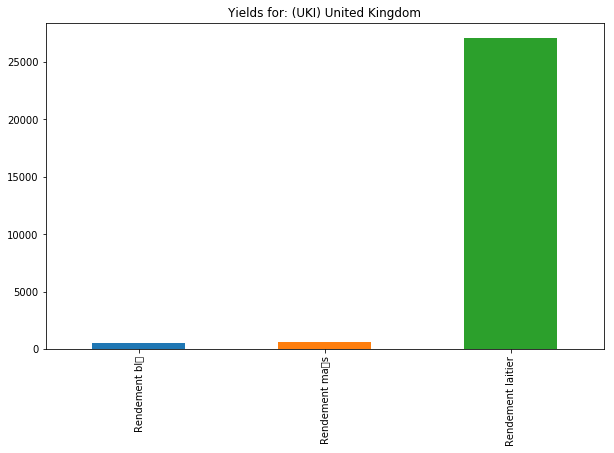

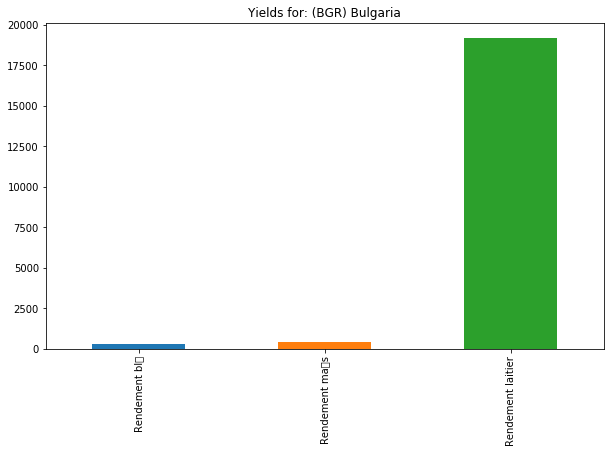

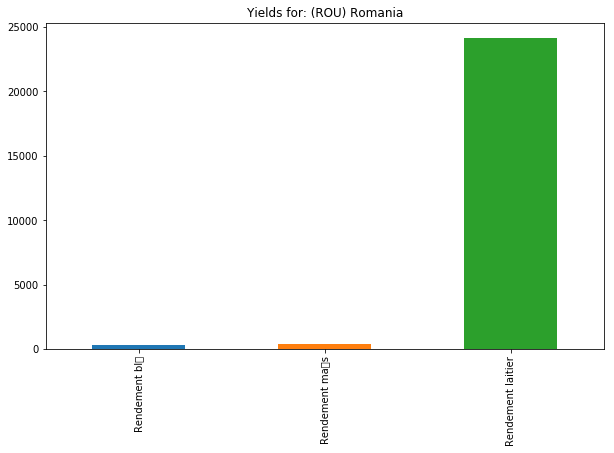

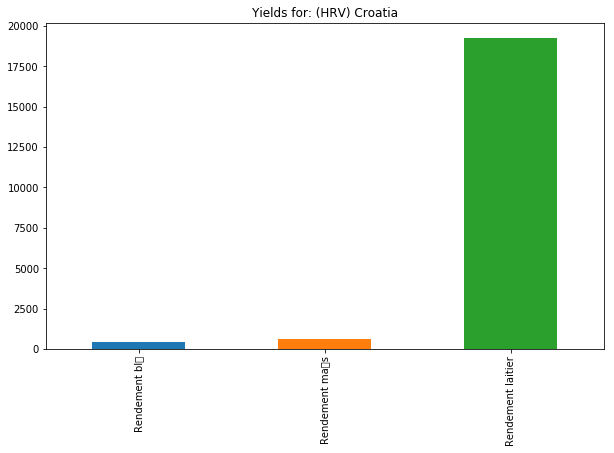

In [130]:
for country in resources_data['COUNTRY'].unique():
    plt.figure(figsize=(10,6))
    resources_cluster.loc[country][['SE110','SE115','SE125']].plot.bar()
    plt.xticks(np.arange(3), list(data_expl[['SE110','SE115','SE125']].values))
    plt.title('Yields for: '+country)

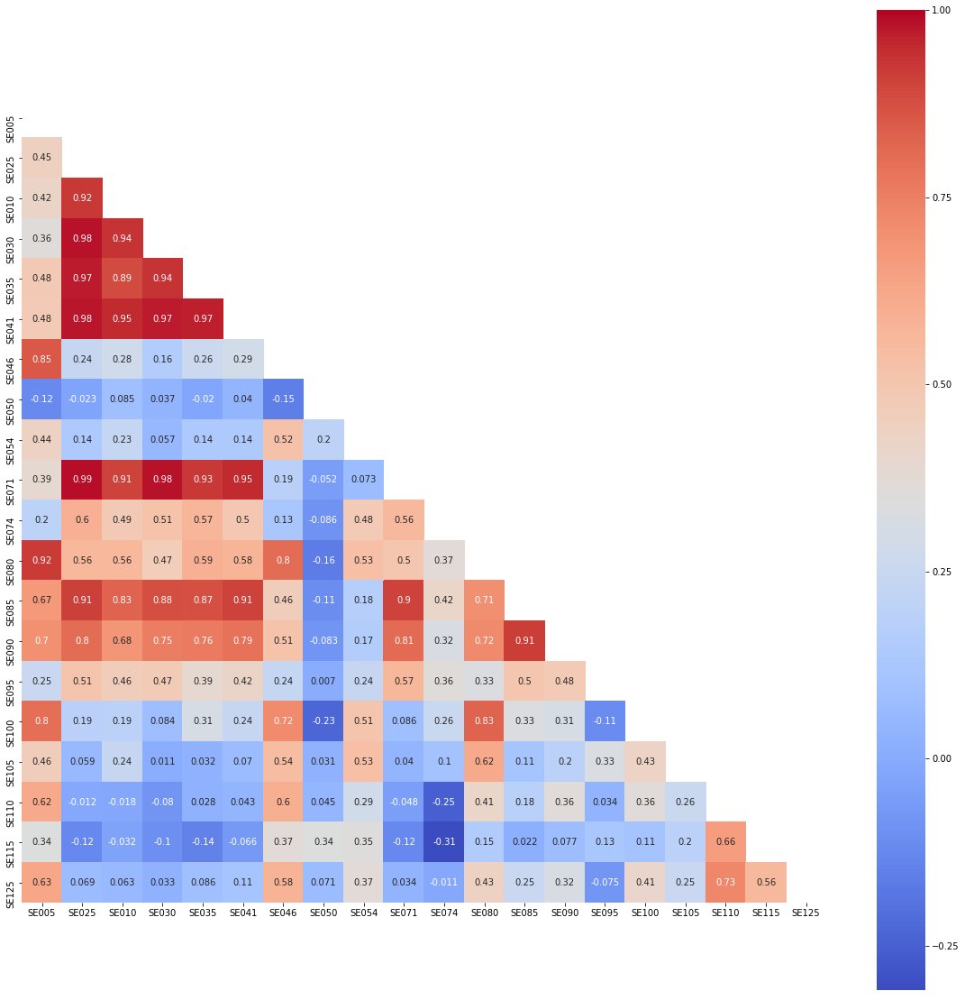

In [131]:
mask = np.zeros_like(resources_cluster.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(20,20))
sns.heatmap(resources_cluster.corr(), annot=True, mask=mask, square=True, cmap='coolwarm')

## Clustring of coutries according to resources

### Scaling data

In [132]:
scaler=StandardScaler()
scaled_resources_cluster_vals=scaler.fit_transform(resources_cluster)

### PCA

In [133]:
var_cum, var_exp=var_pca(scaled_resources_cluster_vals)

In [134]:
var_cum

array([0.46242406, 0.67713313, 0.76323261, 0.83704395, 0.88739587,
       0.92265434, 0.94226843, 0.96020762, 0.97191166, 0.98177372,
       0.99035982, 0.99532574, 0.99765411, 0.9986174 , 0.99923652,
       0.99963761, 0.99987409, 0.99999956, 0.99999994, 1.        ])

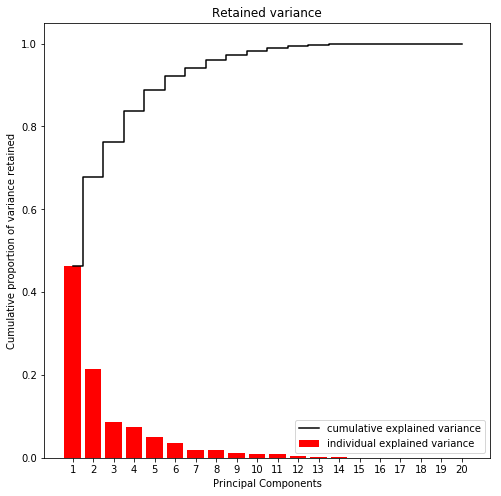

In [135]:
varCum_plot(var_cum)

#### We'll choose 11 components

In [136]:
pca_resources=PCA(n_components=11)
pca_model_resources=pca_resources.fit_transform(scaled_resources_cluster_vals)

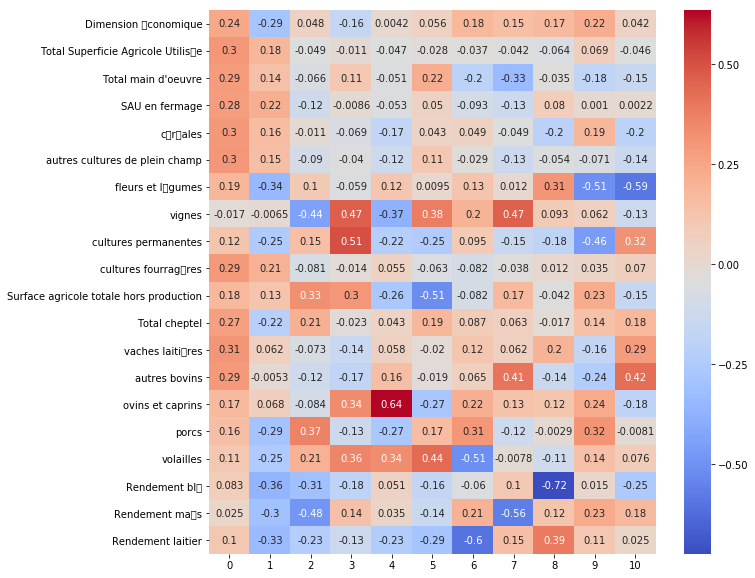

In [137]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.DataFrame(pca_resources.components_, columns=data_expl[resources_cluster.columns].values).T, annot=True, cmap='coolwarm')

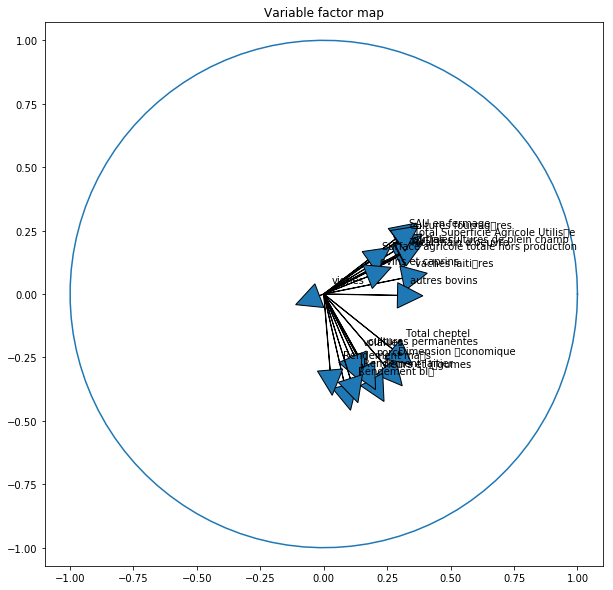

In [138]:
# Plot a variable factor map for the first two dimensions.
plot_factor_map(resources_cluster, pca_resources, data_expl)

In [139]:
kmeans_resources=KMeans(n_clusters=4)
kmeans_resources.fit(pca_model_resources)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

[0.3539115 1.        2.        3.        4.        5.        6.
 7.        8.        9.       ]
[0.3539115  0.33451661 2.         3.         4.         5.
 6.         7.         8.         9.        ]
[0.3539115  0.33451661 0.21219985 3.         4.         5.
 6.         7.         8.         9.        ]
[0.3539115  0.33451661 0.21219985 0.22526945 4.         5.
 6.         7.         8.         9.        ]
[0.3539115  0.33451661 0.21219985 0.22526945 0.23443471 5.
 6.         7.         8.         9.        ]
[0.3539115  0.33451661 0.21219985 0.22526945 0.23443471 0.20618649
 6.         7.         8.         9.        ]
[0.3539115  0.33451661 0.21219985 0.22526945 0.23443471 0.20618649
 0.17925779 7.         8.         9.        ]
[0.3539115  0.33451661 0.21219985 0.22526945 0.23443471 0.20618649
 0.17925779 0.19992159 8.         9.        ]
[0.3539115  0.33451661 0.21219985 0.22526945 0.23443471 0.20618649
 0.17925779 0.19992159 0.18958225 9.        ]
[0.3539115  0.33451661 0.2121998

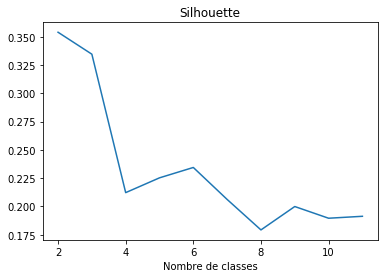

In [151]:
silhoutte(pca_model_resources)

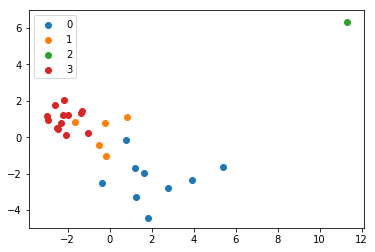

In [140]:
for i in range (4):
    plt.scatter(pca_model_resources[np.where(kmeans_resources.labels_==i)[0],0], pca_model_resources[np.where(kmeans_resources.labels_==i)[0],1], label=i)
    plt.legend()

In [141]:
df_resources=pd.DataFrame(np.hstack((pca_model_resources,kmeans_resources.labels_.reshape(1,-1).T)), columns=[1,2,3,4,5,6,7,8,9,10,11,'labels'], index=resources_cluster.index)
df_resources.head()

,1,2,3,4,5,6,7,8,9,10,11,labels
COUNTRY,,,,,,,,,,,,
(BEL) Belgium,1.277778,-3.270697,-0.571748,-1.377594,0.006407,-0.490348,0.310935,-0.424263,-0.116780,-0.866136,0.472671,0.0
(BGR) Bulgaria,-1.985385,1.210070,-1.736579,1.707611,-1.155928,1.405226,0.422312,0.681043,-0.080155,-0.087766,-0.734551,3.0
(CYP) Cyprus,-2.211215,1.211616,2.225940,0.638990,1.238287,1.872316,0.913338,-0.250810,0.275949,0.523959,-0.020157,3.0
(CZE) Czech Republic,5.411762,-1.613532,0.256179,0.512779,-0.726902,2.758634,-0.027636,-0.718651,-0.566574,-0.463728,0.448918,0.0
(DAN) Denmark,2.787526,-2.778044,1.721389,-1.552871,-1.281066,-0.387486,1.513356,0.051199,-0.125373,0.377908,-0.048918,0.0


In [142]:
df_resources[df_resources['labels']==0].index

Index(['(BEL) Belgium', '(CZE) Czech Republic', '(DAN) Denmark',
       '(DEU) Germany', '(FRA) France', '(ITA) Italy', '(NED) Netherlands',
       '(SVE) Sweden', '(UKI) United Kingdom'],
      dtype='object', name='COUNTRY')

In [143]:
df_resources[df_resources['labels']==1].index

Index(['(ESP) Spain', '(EST) Estonia', '(LTU) Lithuania', '(LVA) Latvia',
       '(POR) Portugal'],
      dtype='object', name='COUNTRY')

In [144]:
df_resources[df_resources['labels']==2].index

Index(['(SVK) Slovakia'], dtype='object', name='COUNTRY')

In [145]:
df_resources[df_resources['labels']==3].index

Index(['(BGR) Bulgaria', '(CYP) Cyprus', '(ELL) Greece', '(HRV) Croatia',
       '(HUN) Hungary', '(IRE) Ireland', '(LUX) Luxembourg', '(MLT) Malta',
       '(OST) Austria', '(POL) Poland', '(ROU) Romania', '(SUO) Finland',
       '(SVN) Slovenia'],
      dtype='object', name='COUNTRY')

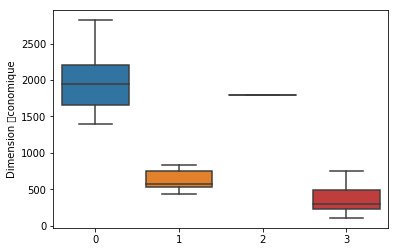

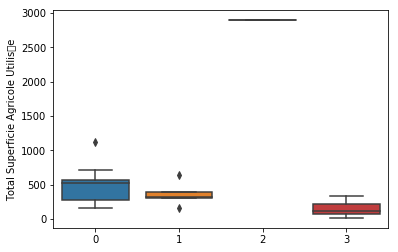

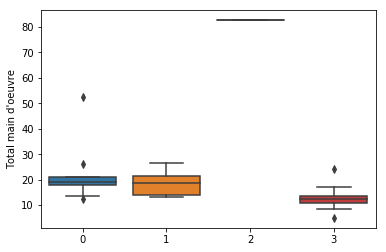

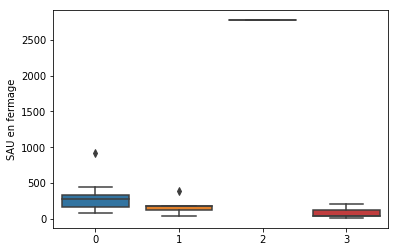

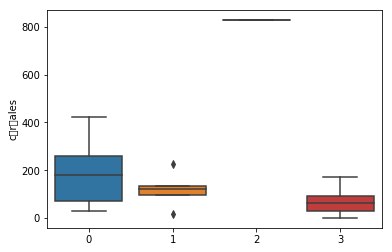

...

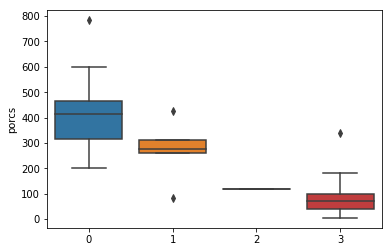

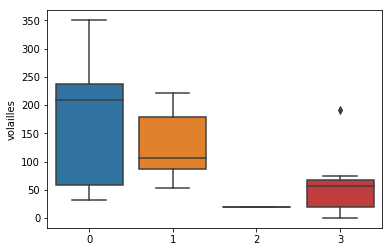

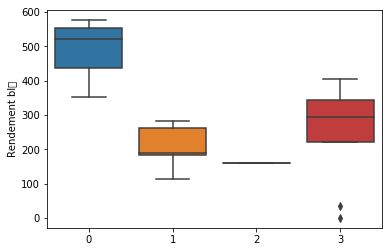

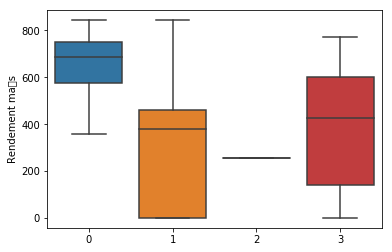

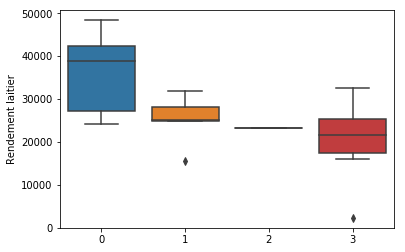

In [146]:
for feat in resources_cluster.columns:
    plt.figure()
    sns.boxplot(x=kmeans_resources.labels_,y=resources_cluster[feat])
    plt.ylabel(data_expl[feat])